# My personal SOM...

In [1]:
from math import sqrt
import numpy as np
from collections import defaultdict, Counter
from sys import stdout
from time import time
import os
import pickle



''' NORMALIZATION FUNCTIONS '''
''' FUNCTION THAT NORMALIZES A SINGLE SAMPLE'''

def fast_norm(x):
    # returns norm 2 for a 1-D numpy array
    
    return np.sqrt(np.dot(x, x.T))

# try another normalization function?


''' DECAY FUNCTIONS '''
''' FUNCTION THAT PEFORMS THE DECAY '''

def asymptotic_decay(decay_val, t, max_iter):
    '''
    decay learning rate
    learning_rate: current learning rate
    t: current iteration
    max_iter: max number of iterations
    '''
    c = t + 1
    max_c = max_iter + 1
    
    divider = (1+c/(max_c/2))
    new_decay = decay_val / divider
    print("Previous decay: ", decay_val)
    print("Updated decay: ", new_decay)
    return new_decay



# new decay function
# seperate decay for lr and sig
# boost decay function




''' TRAIN TEST SPLITTERS '''

''' REGULAR TRAIN TEST SPLIT '''
def norm_train_test(data, tsplit):
    # data: dataset to be split
    # split: float split between 0 to 1
    
    # setting splitter
    split = int(tsplit * data.shape[0])
    train_set = data[:split, :]
    test_set = data[split:, :]
    return train_set, test_set


''' RANDOM TRAIN TEST SPLIT '''
def rand_train_test(data, tsplit):
    # data: dataset to be split
    
    # shuffling the index
    new_idx = np.random.permutation(data.shape[0])
    shuffle_data = data[new_idx]
    
    # setting splitter
    split = int(tsplit * data.shape[0])
    train_set = data[:split, :]
    test_set = data[split:, :]
    return train_set, test_set


def get_size(length):
    
    size = (int(np.sqrt(5*np.sqrt(length))))
    inc_size = (int(size/10) + 1) * 10
    return inc_size

###########################################################################################################################

class mySOM(object):
    
    
    
    ''' THE CONSTRUCTOR '''
    
    def __init__(self, x, y, input_len, sigma=1.0, learning_rate=0.5,
                decay_function=asymptotic_decay,
                neighborhood_function='gaussian', random_seed=42):
        '''
        # interesting rule to set the map size depending on 5*sqrt(N)
        
        x: x dim of the som
        y: y dim of the som
        input_len: no. elements of each vector in input (features in dataset)
        sigma: distance (diameter?) function that keeps decaying
        learning_rate: control the update that keeps decaying
        decay_function: that decays sigma and learning_rate
        neighborhood_function: choose what function to use in sigma
        random_seed: set a random_seed
        
        '''
        
        if sigma >= x or sigma >= y:
            print("sigma too high")
        
        # initialize the parameters
        self._random_generator = np.random.RandomState(random_seed)
        self._learning_rate = learning_rate
        self._sigma = sigma
        self._input_len = input_len
        
        # setting collectors
        self.coll_lr = []
        self.coll_sig = []
        
        # random initialization
        self._weights = self._random_generator.rand(x, y, input_len)*2-1
        self._class_assignments = defaultdict(list)
        
        for i in range(x):
            for j in range(y):
                
                # normalize the weights
                # is this similar to vector quantization??
                norm = fast_norm(self._weights[i, j])
                self._weights[i, j] = self._weights[i, j] / norm
        
        self._activation_map = np.zeros((x, y))
        self._neigx = np.arange(x)
        self._neigy = np.arange(y)
        self._decay_function = decay_function
        
        # are these many functions needed??
        neig_functions = {'gaussian': self._gaussian}
        
        # probably not going to be used
        if neighborhood_function not in neig_functions:
            print("Function not found!!")
        
        
        self.neighborhood = neig_functions[neighborhood_function]
        print("Som of size: ", self._weights.shape, " has been initialized")
     
    

    
    ''' NEIGHBORHOOD SETTING FUNCTIONS '''
    ''' FUNCTION THAT PERFORMS GAUSSIAN DISTANCE '''
    
    def _gaussian(self, c, sigma):
        # returns gaussian centered on c
        d = 2*np.pi*sigma*sigma # 2pi*sig^2
        ax = np.exp(-np.power(self._neigx-c[0], 2)/d) #e^(x-xcenter)^2/d
        ay = np.exp(-np.power(self._neigy-c[1], 2)/d) #e^(y-ycenter)^2/d
        
        #ax[i] * ay[0 to end (every value in array ay)]
        dist = np.outer(ax, ay) # external product returns a matrix?
        
        return dist
 
    
   
    ''' WEIGHT SETTING FUNCTIONS '''
    ''' RANDOMLY INITIALIZES WEIGHTS '''
    
    def random_weights_init(self, data):
        # initializes weights by picking random samples from data
        
        # create an iterator -- multi index means more than one index is used at a time
        # example - 0,0 0,1 0,2 1,0 1,1 1,2 .......
        it = np.nditer(self._activation_map, flags=['multi_index'])
        
        while not it.finished:
            # get a random index
            rand_i = self._random_generator.randint(len(data))
            # assign it in the multi index location of weights (map dims)
            self._weights[it.multi_index] = data[rand_i]
            # normalize the weights
            norm = fast_norm(self._weights[it.multi_index])
            self._weights[it.multi_index] = norm
            # iterate to next multi index
            it.iternext()
            
        print("Weight matrix is initialized with random weights")
                
                
    ''' STORING THE WEIGHTS ONCE TRAINING IS COMPLETE '''
    
    def save_weights(self, file, name):
        # go into the file to store weights
        os.chdir(file)
        # add '.npy to the name'
        filename = name + '.npy'
        # save the weights to a npy file
        np.save(filename, self._weights)
        # leave the file
        os.chdir('..')
        
    
    ''' LOAD THE WEIGHTS THAT HAVE BEEN STORED '''
    
    def load_weights(self, file, name):
        # go into the file to store weights
        os.chdir(file)
        # add '.npy to the name'
        filename = name + '.npy'
        # save the weights to a npy file
        self._weights = np.load(filename)
        # leave the file
        os.chdir('..')
        
        
    ''' SET THE WEIGHTS AFTER LOADING '''
    
    def set_weights(self, wt):
        
        self._weights = wt
        
        return
    
    
    ''' RESET THE WEIGHTS '''
    
    def reset_weights(self, wt):
        
        wt_shape = wt.shape
        self._weights = np.zeros(wt.shape)
        
        return
    
    
    ''' DEPENDENT FUNCTIONS '''
    
    ''' TRAINING FUNCTIONS '''
    ''' FUNCTION THAT ACTIVATES THE MAP - ONLY ACTIVATES THE MAP '''
    
    def _activate(self, x):
        # updates activation matrix
        # elem[i, j] is response to neuron i, j to specific vector x
        
        # diff bet sample and weights
        s = np.subtract(x, self._weights)
        # a multi index iterator object based on the activation map 
        it = np.nditer(self._activation_map, flags=['multi_index'])
        
        while not it.finished:
            # set every map activation based on the normalized diff
            self._activation_map[it.multi_index] = fast_norm(s[it.multi_index])
            it.iternext()
            
    
    ''' FUNCTION THE ACTIVATES BASED ON SAMPLE AND RETURNS ITS RESPECTIVE WINNER '''
    
    def winner(self, x):
        # update the activation map according to the sample
        self._activate(x)
        # return the value of the index at the in the minimum value
        you_win = np.unravel_index(self._activation_map.argmin(), self._activation_map.shape)
        
        '''
        # unravel kind of works like this maybe??
        minimum = 1
        for i in range(self._activation_map.shape[0]):
            for j in range(self._activation_map.shape[1]):
                if minimum < self._activation_map[i][j]
                    mimimum = self._activation_map[i][j]
                    win_map = (i, j)
        '''
        
        return you_win
    
    
    ''' FUNCTION THAT UPDATES THE DECAY PARAMETERS AND THEN THE WEIGHTS '''
    
    def update_no(self, x, win, t, max_iteration):
        
        sig = self._sigma
        eta = self._learning_rate
        
        # 'g' is needed to update the weights
        g = self.neighborhood(win, sig) * eta
        self._weights += np.einsum('ij, ijk->ijk', g, x-self._weights)
        
        
    def up_lr_sig(self, t, max_iteration):
        
        # update only learning rate and sigma
        self._learning_rate = self._decay_function(self._learning_rate, t, max_iteration)
        self._sigma = self._decay_function(self._sigma, t, max_iteration)
        
    
    ''' TRAINING FUNCTIONS '''
    ''' FUNCTION USING SPECIFIED WINDOW'''
    
    def prof_window(self, data, num_iteration, save, verbose=False):
        # train random batches
        
        max_cycle = num_iteration
        
        if verbose:
            iterations = _incremental_index_verbose(num_iteration)
            
        # number of cycles throught the data
        for cycle in range(max_cycle):
            
            # batch size is not used in iteration
            for iteration in range(data.shape[0]):  

                # update the map activations, sigma and learning rate
                self.update_no(data[iteration], self.winner(data[iteration]), cycle, max_cycle)

                if iteration % 100000 == 0:
                    plt.pcolor(self.distance_map()) 
                    plt.show()
                    print("Still going...", iteration)

            if verbose:
                print(' - quantization error: ', self.quantization_error(data))
            
            
            if save == True:
                name = str(1 + cycle) + "_wt_" + str(self._weights.shape[0])
                self.save_weights(wt_lab, name)
                
            
            self.up_lr_sig(cycle, max_cycle)
            print("Cycle - ", cycle, " - Complete!!")
            
        print("Sliding Window Training Complete!")
     
    
    ''' SKIPPING ITERATIONS IN THE TRAINING '''
    def skip_window(self, skip, data, num_iteration, save, verbose=False):
        # train random batches
        
        max_cycle = num_iteration
        
        if verbose:
            iterations = _incremental_index_verbose(num_iteration)
            
        # number of cycles throught the data
        for cycle in range(max_cycle):
            
            if cycle < skip:
                self.up_lr_sig(cycle, max_cycle)
                continue
                
            # batch size is not used in iteration
            for iteration in range(data.shape[0]):  

                # update the map activations, sigma and learning rate
                self.update_no(data[iteration], self.winner(data[iteration]), cycle, max_cycle)

                if iteration % 100000 == 0:
                    plt.pcolor(self.distance_map()) 
                    plt.show()
                    print("Still going...", iteration)

            if verbose:
                print(' - quantization error: ', self.quantization_error(data))
            
            
            if save == True:
                name = str(1 + cycle) + "_wt_" + str(self._weights.shape[0])
                self.save_weights("seg_wts", name)
                
            
            self.up_lr_sig(cycle, max_cycle)
            print("Cycle - ", cycle, " - Complete!!")
        
        print("Sliding Window Training AFTER SKIP Complete!")
        
        
    ''' RANDOMISING THE TRAINING '''
    def rand_window(self, data, num_iteration, save, verbose=False):
        # train random batches
        
        max_cycle = num_iteration
        
        if verbose:
            iterations = _incremental_index_verbose(num_iteration)
            
        # number of cycles throught the data
        for cycle in range(max_cycle):
                
            # batch size is not used in iteration
            for iteration in range(data.shape[0]):  
                
                itr = np.random.randint(data.shape[0])
                # update the map activations, sigma and learning rate
                self.update_no(data[itr], self.winner(data[itr]), cycle, max_cycle)

                if iteration % 100000 == 0:
                    plt.pcolor(self.distance_map()) 
                    plt.show()
                    print("Still going...", iteration)

            if verbose:
                print(' - quantization error: ', self.quantization_error(data))
            
            if save == True:
                name = str(1 + cycle) + "_wt_" + str(self._weights.shape[0])
                self.save_weights("seg_wts", name)
                
            self.up_lr_sig(cycle, max_cycle)
            print("Cycle - ", cycle, " - Complete!!")
        
        print("Random Window Training Complete!")
        
        
    ''' RANDOM BATCHED TRAINING '''
    def rands_window(self, data, num_iteration, save, verbose=False):
        # train random batches
        
        max_cycle = num_iteration
        
        if verbose:
            iterations = _incremental_index_verbose(num_iteration)
            
        # number of cycles throught the data
        for cycle in range(max_cycle):
            i = 0
            # batch size is not used in iteration
            for iteration in range(int(data.shape[0]/100)):  
                
                itr = np.random.randint(data.shape[0]-100)
                
                for pt in range(itr, itr+100):
                    # update the map activations, sigma and learning rate
                    self.update_no(data[pt], self.winner(data[pt]), cycle, max_cycle)
                    i = i + 1

                if i % 100000 == 0:
                    plt.pcolor(self.distance_map()) 
                    plt.show()
                    print("Still going...", iteration)

            if verbose:
                print(' - quantization error: ', self.quantization_error(data))
            
            if save == True:
                name = str(1 + cycle) + "_wt_" + str(self._weights.shape[0])
                self.save_weights("seg_wts", name)
                
            self.up_lr_sig(cycle, max_cycle)
            print("Cycle - ", cycle, " - Complete!!")
        
        print("Random Window Training Complete!")



    ''' GREY MAP FUNCTIONS '''        
    ''' FUNCTION THAT RETURNS THE CELLS IN THE MAP '''        
    
    def distance_map(self, verbose=False):
        # gives distance map where each cell is normalised sum of distances between 
        # neuron and its neighbours
        
        # distance map values to be returned
        um = np.zeros((self._weights.shape[0], self._weights.shape[1]))
        it = np.nditer(um, flags=['multi_index'])
        
        coll = defaultdict(list)
        while not it.finished:
            for ii in range(it.multi_index[0]-1, it.multi_index[0]+2):
                for jj in range(it.multi_index[1]-1, it.multi_index[1]+2):
                    
                    if (ii >= 0 and ii < self._weights.shape[0] and jj >= 0 and jj < self._weights.shape[1]):
                        w_1 = self._weights[ii, jj, :]
                        w_2 = self._weights[it.multi_index]
                        both = (ii, jj)
                        coll[it.multi_index].append(both)
                        um[it.multi_index] += fast_norm(w_1 - w_2)

            it.iternext()
        
        if verbose:
            for key, value in zip(coll.keys(), coll.values()):
                print(key, ' ----------> ', value)
        
        um = um/um.max()
        return um

   
    
    ''' ADDITIONAL SOM FINAL MAP FUNCTIONS '''
    ''' FUNCTION THAT RETURNS SAMPLES TO MAP POSITION '''
    
    def win_map(self, data):
        # returns patterns (samples?) of all locations on map

        winmap = defaultdict(list)
        windex = defaultdict(list)
        
        for cnt, x in enumerate(data):
            winmap[self.winner(x)].append(x)
            windex[self.winner(x)].append(cnt)
            
            if cnt % 500 == True:
                print("Mapping in progress...", cnt)
        return winmap, windex
        
        
    ''' FUNCTION THAT RETURNS MAP POSITION TO LABEL AND NUMBER OF TIMES FOUND '''    
    
    def labels_map(self, data, labels):
        # returns no. of samples of a particular label for position i, j

        if not len(data) == len(labels):
            print("Incorrect number of labels")

        winmap = defaultdict(list)
        for x, l in zip(data, labels):
            winmap[self.winner(x)].append(l)

        for position in winmap:
            winmap[position] = Counter(winmap[position])

        self._class_assignments = winmap
        return winmap
        
        
    ''' FUNCTION THAT RETURNS MOST COMMON CLASS IN EACH MAP POSITION? '''    
        
    def classify(self, data):
        # classifies each sample in respective label and
        # returns a list of classified samples

        winmap = self._class_assignments
        default_class = np.npsum(list(winmap.values())).most_common()[0][0]
        result = []

        for d in data:
            win_position = self.winner(d)

            if win_position in winmap:
                result.append(winmap[win_position].most_common()[0][0])

            else:
                result.append(default_class)
        return result
    
    
    ''' ADDITIONAL ACTIVATION FUNCTIONS '''
    ''' FUNCTION THAT UPDATES, ACTIVATES AND THEN RETURNS ACTIVATION MAP'''
    
    def activate(self, x):
        # returns the activation map to x
        
        # update the activation map with sample x
        self._activate(x)
        # return the updated activation map
        return self._activation_map
    
    
    ''' FUNCTION TO RETURN NUMBER OF TIMES A NEURON WINS '''
    
    def activation_response(self, data):
        # returns number of times neuron ij wins

        a = np.zeros((self._weights.shape[0], self._weights.shape[1]))
        for x in data:
            a[self.winner(x)] += 1
        return a

    
    ''' QUANTIZATION FUNCTIONS '''
    ''' FUNCTION TO RETURN A CODEBOOK VECTOR FOR EACH SAMPLE IN DATA '''
    
    def quantization(self, data):
        # assigns code book (weights vector) to each sample
        q = np.zeros(data.shape)
        for i, x in enumerate(data):
            q[i] = self._weights[self.winner(x)]
        return q
    
    
    ''' FUNCTION THAT GIVE DIFFERENCE BETWEEN WINNING SAMPLE AND CODEBOOK VECTORS '''
    
    def quantization_error(self, data):
        # returns diff bet input sample and bmu

        error = 0
        for x in data:
            error += fast_norm(x-self._weights[self.winner(x)])
        return error/len(data)

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import os
import glob
import time

print("Packages Imported")

pre = "pre_files"
nor = "norm_files"
og = "og_files"

init = "init_weights"
wt = "weights"
res = "results"

Packages Imported


# 1. Load and store data...

# Normalise the data...

In [3]:
#os.chdir('..')
# normalising using given norm function, apply along the columns
def norm(matrix):
    
    theshape = matrix.shape
    # initialise the new normalised matrix
    norm_mat = np.zeros(theshape).reshape(theshape[0], -1)
    
    # take out a column
    for feature in range(theshape[1]):
        column = matrix.iloc[:, feature]
        max_val = max(column)
        min_val = min(column)
        
        # take out each row (cell in column)
        for sample in range(theshape[0]):
            normed = (column[sample] - min_val) / (max_val - min_val)
            norm_mat[sample, feature] = normed
    
    return norm_mat
        
                
# load the dataframe and return the normalised values
def get_norm(direc, filename):
    '''
    # directory of the file
    # file to be stored and loaded from: filename
    # to normalize or not
    '''
    
    os.chdir(direc)
    
    # read first 9 features of data as a numpy array
    pdx_npy = np.genfromtxt(filename, delimiter=',', usecols=(np.arange(8)))
    print("File ", filename, " is used to get the dataset as a numpy array...")
    
    os.chdir("..")
    
    # dealing with more nan problems
    pdx_npy11 = pdx_npy[1:, 2:] # nan in 1st row, also remove iterable col and time
    print("Shape of modified data: ", pdx_npy11.shape)
    
    '''if norm == True:
        print("Note: Normalization with LINALG...")
        pdx_numpy11_som = np.apply_along_axis(lambda x: x/np.linalg.norm(x), 1, pdx_numpy11)
        return pdx_numpy11_som
    
    else:
        print("Note: No normalization...")
        return pdx_numpy_11'''
    
    # normalization only and not standardisation
    normed_data = norm(pdx_npy11)
    
    return normed_data

   
# performing normalisation after segmenting
def npy_seg_norm(npx, label):
    
    # normalise only the label
    print("Note: Normalization with LINALG...")
    seg_norm = norm(label)
    
    # combine data with normed label as a form of segmentation
    data_seg = np.concatenate((npx, seg_norm), axis=1)
    
    return data_seg

# Applying the loaders and storers...

In [4]:
# load a file as a dataframe - csv data
def pre_files(loc, name):
    
    os.chdir(loc)
    pdx = pd.read_csv(name)
    os.chdir("..")
    
    # remove extra enumerated column
    return pdx.iloc[:, 1:]


# load a file as an numpy file - npy data
def norm_files(loc, name):
    
    os.chdir(loc)
    npx = np.load(name)
    os.chdir("..")
    
    return npx


# reset names between different types of files and what they are about
def reset_name(flist, extra):
    # flist: list of current file names (usually csv files)
    # ext: new file extension required (at end part)
    # reset: new appending character to denote change in file names (at start part)
    new_f = []
    
    for fi in flist:
        
        name = ''
        # keep adding letters upto '.'
        for idx in range(len(fi)):
            if fi[idx] == '.':
                break
            name = name + fi[idx]
        
        name = name + extra
        # complete by adding the new name to the list
        new_f.append(name)
        
    print(new_f)
    return new_f


# store a numpy array as an npy file
def store_npy(loc, data, name):
    
    os.chdir(loc)
    np.save(name, data)
    os.chdir('..')
    
# store a csv file
def store_csv(loc, data, name):
    
    os.chdir(loc)
    filename = name + ".csv"
    data.to_csv(filename, sep=',', encoding='utf-8')
    os.chdir('..')

# load the list of file names
def file_list(direc, ext):
    
    # gathering the files just in case
    list_files = []
        
    os.chdir(direc)
    print(os.getcwd())
    
    f_ext = "*." + ext
    for files in glob.glob(f_ext):
        list_files.append(files)
        
    os.chdir('..')
    print(list_files)
    print(os.getcwd())
    print("*****************\n")
    return list_files


# return dictionaries of file list
def file_dict(loc, f_list, ext):
    
    # dictionary to store file_names : file_data
    f_dict = dict()
    
    # empty list to store each file_data
    f_store = []
    
    # deal with removing e
    # load each file_data
    for fname in f_list:
        # check the file extension
        if ext == "csv":
            fi = pre_files(loc, fname)
        if ext == "npy":
            fi = norm_files(loc, fname)
            
        f_store.append(fi)
        
    print("Num of files: ", len(f_list), "\nNum of files loaded: ", len(f_store))
    
    # implementing the dictionary
    for i in range(len(f_list)):
        f_dict[f_list[i]] = f_store[i]
        
    print("Dictionary compiled!!", len(f_dict.keys()))
    return f_dict

# look into the dictionary
def lookup(cur_dict):
    
    keys = list(cur_dict.keys())
    values = list(cur_dict.values())
    
    for i in range(len(keys)):
        print(keys[i], ' ---> ', values[i].shape)
        
    return keys, values

# join the dictionary
def join_dict(keys, values):
    
    new_dict = dict()
    for i in range(len(keys)):
        new_dict[keys[i]] = values[i]
    
    return new_dict

# Applying file loaders and savers...

In [5]:
# dataframe section
# get the list of dataframe file names
pdx_names = file_list("pre_files", 'csv')

# get the dictionary combining dataframe names : dataframe data
pdx_csv = file_dict("pre_files", pdx_names, 'csv')

alin = []
for k in pdx_csv.keys():
    alin.append(pdx_csv[k])

alfin = pd.concat(alin)
#store_csv("pre_files", alfin, "al")

C:\Users\sunny\Desktop\workspace0\neural_nets\research_S19\MTO_data_copy\phase_dt\phase_5\pre_files
['al.csv', 'hf.csv', 'mu.csv', 'te.csv']
C:\Users\sunny\Desktop\workspace0\neural_nets\research_S19\MTO_data_copy\phase_dt\phase_5
*****************

Num of files:  4 
Num of files loaded:  4
Dictionary compiled!! 4


In [6]:
for i in pdx_csv.keys():
    print(pdx_csv[i].shape)

(1267509, 7)
(406241, 7)
(428231, 7)
(433037, 7)


# Applying Driver Segmentation...

In [8]:
# function to find the number of junctions
def junc(pdx):
    # pdx: dataframe used to find out what label to apply
    
    junc_pts = []
    
    for i in range(pdx.shape[0]):
        # compare using the starting time
        start = pdx.iloc[0, 0]
        
        if pdx.iloc[i, 0] == start:
            junc_pts.append(i)
            
    junc_pts.append(pdx.shape[0])
    return junc_pts

# set the driver label and dictionary
def driver_seg(pd_dict):
    # pdx: dataframe used to find out what label to apply
    pd_k, pd_v = lookup(pd_dict)
    se_k, se_v = [], []
    
    for k in range(len(pd_k)):
        cur_k, cur_v = pd_k[k], pd_v[k]
        
        # initialising the final label array
        label = np.zeros(cur_v.shape[0], dtype='int').reshape(-1, 1)

        # get the junction points and create the label
        junctions = junc(cur_v)
        tot = len(junctions)
        lab = 0 # the first label
        
        for i in range(tot-1):
            start = junctions[i]
            end = junctions[i + 1]
            
            if cur_k == 'al_14.csv':
                # label the split set
                for j in range(start, end):
                    label[j] = lab
                    
                lab = lab + 1
                if ((i != 0) and (i % 4)) == 0:
                    lab = 0
                        
            else:
                # label the split set
                for j in range(start, end):
                    label[j] = lab
                # go to next label
                lab = lab + 1

        print(junctions)
        print("Labels of 1D created based on split data...", label.shape)
        print("The labels are: ", set(label[:, 0]))
        
        # concatenate the label with the dataset
        npy_pd = pd.DataFrame({"driver_seg": label[:, 0]})
        combo_lab = pd.concat((cur_v, npy_pd), axis=1)
        
        name = cur_k.rstrip(".csv") + "_drseg"
        se_k.append(name)
        se_v.append(combo_lab)
        
    fin_dict = join_dict(se_k, se_v)
    return fin_dict

In [9]:
# get all the driver segments
dr_seg = driver_seg(pdx_csv)

al.csv  --->  (1267509, 7)
hf.csv  --->  (406241, 7)
mu.csv  --->  (428231, 7)
te.csv  --->  (433037, 7)
[0, 10840, 20528, 31033, 41550, 52042, 63041, 73099, 82430, 91882, 101219, 112043, 122963, 133085, 142980, 152344, 162856, 172949, 183524, 193168, 203637, 213334, 223360, 233533, 244177, 254728, 265280, 275341, 285860, 295210, 305218, 315403, 326293, 335881, 344073, 354713, 365898, 375854, 385609, 395766, 406241, 417081, 426650, 437220, 447897, 458182, 468681, 478532, 488776, 499033, 509591, 526456, 538290, 548433, 558948, 569837, 581266, 591409, 602662, 613051, 623355, 633599, 643756, 653504, 664435, 675137, 685690, 698858, 709861, 720143, 730633, 741108, 751668, 761952, 770711, 781499, 792904, 803322, 813299, 823849, 834472, 845241, 854970, 865651, 876180, 886982, 898160, 909632, 920308, 930777, 941402, 952707, 963802, 974039, 984504, 995238, 1006715, 1017014, 1027616, 1038223, 1048286, 1058612, 1068929, 1079405, 1090162, 1101415, 1111608, 1122821, 1133788, 1143780, 1153867, 11646

In [52]:
dr_seg['hf_drseg'].iloc[395000:, 7]

395000    38
395001    38
395002    38
395003    38
395004    38
395005    38
395006    38
395007    38
395008    38
395009    38
395010    38
395011    38
395012    38
395013    38
395014    38
395015    38
395016    38
395017    38
395018    38
395019    38
395020    38
395021    38
395022    38
395023    38
395024    38
395025    38
395026    38
395027    38
395028    38
395029    38
          ..
406211    39
406212    39
406213    39
406214    39
406215    39
406216    39
406217    39
406218    39
406219    39
406220    39
406221    39
406222    39
406223    39
406224    39
406225    39
406226    39
406227    39
406228    39
406229    39
406230    39
406231    39
406232    39
406233    39
406234    39
406235    39
406236    39
406237    39
406238    39
406239    39
406240    39
Name: driver_seg, Length: 11241, dtype: int32

In [11]:
# change the names for the resulting normalised data
npy_names = reset_name(list(dr_seg.keys()), 'n')
#os.chdir('..')

['al_drsegn', 'hf_drsegn', 'mu_drsegn', 'te_drsegn']


In [11]:
'''
# normalisation already done
'''
# use df file names to normalize and store the data
z = 0
nps = []
for fi in dr_seg.keys():
    
    print(npy_names[z])
    # store the new csv files
    store_csv("seg_pre", dr_seg[fi], fi)
    print("New segmented csv data is stored: ", dr_seg[fi].head())
    
    # normalise the data
    after_norm = norm(dr_seg[fi].iloc[:, 1:])
    print("Normalisation complete for ", after_norm.shape)
    
    # store the data with new names
    store_npy("seg_norm", after_norm, npy_names[z])
    print("New normalised npy file is stored: ", after_norm.shape)
    z = z + 1
    nps.append(after_norm)
    
''''''

al_drsegn
New segmented csv data is stored:      Time  Brake pressure/Axle 1/Left  Tangential speed  \
0  0.098                         0.0          0.392668   
1  0.210                         0.0          0.393256   
2  0.322                         0.0          0.121512   
3  0.434                         0.0          0.102623   
4  0.546                         0.0          0.090315   

   Tangent Acceleration/X  Tangent Acceleration/Y  Tangent Acceleration/Z  \
0               -0.079845                0.003401               -0.629291   
1               -0.424593                0.015728                0.306344   
2                0.046412                0.016495                0.892449   
3                0.066726               -0.013537                0.103988   
4                0.342620                0.021201               -0.267502   

   Lane gap  driver_seg  
0  0.000011           0  
1  0.000005           0  
2  0.000001           0  
3  0.000004           0  
4  0.000007  

''

In [14]:
os.getcwd()

'C:\\Users\\sunny\\Desktop\\workspace0\\neural_nets\\research_S19\\MTO_data_copy\\phase_dt\\phase_5'

In [15]:
# numpy section ##---> files are already normalised so no need to use linalg function
npy_files = file_list("seg_norm", 'npy')

# get the dictionary combining numpy names : numpy data
num_npy = file_dict("seg_norm", npy_files, 'npy')

C:\Users\sunny\Desktop\workspace0\neural_nets\research_S19\MTO_data_copy\phase_dt\phase_5\seg_norm
['al_drsegn.npy', 'hf_drsegn.npy', 'mu_drsegn.npy', 'te_drsegn.npy']
C:\Users\sunny\Desktop\workspace0\neural_nets\research_S19\MTO_data_copy\phase_dt\phase_5
*****************

Num of files:  4 
Num of files loaded:  4
Dictionary compiled!! 4


In [16]:
set(num_npy['hf_drsegn.npy'][:, 6])

{0.0,
 0.02564102564102564,
 0.05128205128205128,
 0.07692307692307693,
 0.10256410256410256,
 0.1282051282051282,
 0.15384615384615385,
 0.1794871794871795,
 0.20512820512820512,
 0.23076923076923078,
 0.2564102564102564,
 0.28205128205128205,
 0.3076923076923077,
 0.3333333333333333,
 0.358974358974359,
 0.38461538461538464,
 0.41025641025641024,
 0.4358974358974359,
 0.46153846153846156,
 0.48717948717948717,
 0.5128205128205128,
 0.5384615384615384,
 0.5641025641025641,
 0.5897435897435898,
 0.6153846153846154,
 0.6410256410256411,
 0.6666666666666666,
 0.6923076923076923,
 0.717948717948718,
 0.7435897435897436,
 0.7692307692307693,
 0.7948717948717948,
 0.8205128205128205,
 0.8461538461538461,
 0.8717948717948718,
 0.8974358974358975,
 0.9230769230769231,
 0.9487179487179487,
 0.9743589743589743,
 1.0}

# 2. Window remap function...

In [17]:
# function to remap data in the form of a window
# !! works for both data and labels!!
def remap(data, window):
    
    x = data.shape[0] - window
    y = data.shape[1] * window
    
    if data.shape[1] == 1:
        remapped = np.zeros(x * y, dtype='int').reshape(x, y)
        
    else:
        remapped = np.zeros(x * y).reshape(x, y)
        

    j = 0 # final map setter
    
    for idx in range(0, data.shape[0]-window-1):
        
        vec = np.zeros(y).reshape(window, data.shape[1])
        i = 0 # each single vector
        
        for ar_id in range(idx, idx + window):
            vec[i, :] = data[ar_id, :]
            i = i + 1
            
        n_vec = vec.reshape(-1)
        
        remapped[j, :] = n_vec
        j = j + 1
        
    print("Label shape after window: ", remapped.shape)
    return remapped
# remapping is required only for labels as weights are already trained on the windowed input data


# function to return dictionary of remapped data names : actual data
def remap_dict(cur_dict, window):
    
    nlist = list(cur_dict.keys())
    dlist = list(cur_dict.values())
    
    # rename the init wt files
    re_names = reset_name(nlist, '_re')
    
    # get every set of weights based on new names
    inits = []
    for i in range(len(re_names)):
        # get init weights using data and set new resetted names
        wt = remap(cur_dict[nlist[i]], window)
        inits.append(wt)
    
    # ready the dictionary
    ret_dict = dict()
    for i in range(len(re_names)):
        ret_dict[re_names[i]] = inits[i]
        
    return ret_dict

In [18]:
# create the dictionary of remapped new names : remapped data
remap_data = remap_dict(num_npy, 5)

['al_drsegn_re', 'hf_drsegn_re', 'mu_drsegn_re', 'te_drsegn_re']
Label shape after window:  (1267504, 35)
Label shape after window:  (406236, 35)
Label shape after window:  (428226, 35)
Label shape after window:  (433032, 35)


# 3. Initialise weights for new sizes of maps...

# Multi data - multi 'initialise' weight dictionary...

In [19]:
# function to change the first weights depending on the size of the data
def init_wt(data, name):
    # guestimating the map size and resetting it to a higher value
    re_size = get_size(data.shape[0])
    
    # hyperparameters
    sig = np.random.rand(1)
    lr = np.random.rand(1)
    
    # creating the som
    som = mySOM(re_size, re_size, data.shape[1], sig, lr)

    # initialize the weights
    som.random_weights_init(data)
    
    # current weights shape
    wt = som._weights
    
    print("Current: ", wt.shape)
    som.save_weights('seg_wts', name)
    
    print("************************************\n")
    return wt

# function to return dictionary of dataset names : initialised weights
def init_dict(cur_dict):
    
    nlist = list(cur_dict.keys())
    dlist = list(cur_dict.values())
    
    # rename the init wt files
    re_names = reset_name(nlist, '_init')
    
    # get every set of weights based on new names
    inits = []
    for i in range(len(re_names)):
        # get init weights using data and set new resetted names
        wt = init_wt(cur_dict[nlist[i]], re_names[i])
        inits.append(wt)
    
    # ready the dictionary
    ret_dict = dict()
    for i in range(len(re_names)):
        ret_dict[re_names[i]] = inits[i]
        
    return ret_dict

In [93]:
init_all = init_dict(remap_data)

['al_drsegn_re_init', 'hf_drsegn_re_init', 'mu_drsegn_re_init', 'te_drsegn_re_init']
Som of size:  (80, 80, 35)  has been initialized
Weight matrix is initialized with random weights
Current:  (80, 80, 35)
************************************

Som of size:  (60, 60, 35)  has been initialized
Weight matrix is initialized with random weights
Current:  (60, 60, 35)
************************************

Som of size:  (60, 60, 35)  has been initialized
Weight matrix is initialized with random weights
Current:  (60, 60, 35)
************************************

Som of size:  (60, 60, 35)  has been initialized
Weight matrix is initialized with random weights
Current:  (60, 60, 35)
************************************



In [156]:
def load_npy(loc, name):
    
    os.chdir(loc)
    te = np.load(name)
    os.chdir('..')
    return te
    
load_wts = file_list("seg_wts", "npy")
the_nwt = []
the_wts = []

for na in load_wts:
    t = load_npy("seg_wts", na)
    n = na.rstrip(".npy")
    the_nwt.append(n)
    the_wts.append(t)
    
f_wts = join_dict(the_nwt, the_wts)

C:\Users\sunny\Desktop\workspace0\neural_nets\research_S19\MTO_data_copy\phase_dt\phase_5\seg_wts
['10_wt_20.npy', '11_wt_20.npy', '12_wt_20.npy', '13_wt_20.npy', '14_wt_20.npy', '15_wt_20.npy', '1_wt_20.npy', '2_wt_20.npy', '3_wt_20.npy', '4_wt_20.npy', '5_wt_20.npy', '6_wt_20.npy', '7_wt_20.npy', '8_wt_20.npy', '9_wt_20.npy', 'al_drsegn_re_init.npy', 'hf_drsegn_re_init.npy', 'mu_drsegn_re_init.npy', 'te_drsegn_re_init.npy']
C:\Users\sunny\Desktop\workspace0\neural_nets\research_S19\MTO_data_copy\phase_dt\phase_5
*****************



In [21]:
f_wts['al_drsegn_re_init'].shape

(80, 80, 35)

In [22]:
f_wts.keys()

dict_keys(['10_wt_20', '11_wt_20', '12_wt_20', '13_wt_20', '14_wt_20', '15_wt_20', '1_wt_20', '2_wt_20', '3_wt_20', '4_wt_20', '5_wt_20', '6_wt_20', '7_wt_20', '8_wt_20', '9_wt_20', 'al_drsegn_re_init', 'hf_drsegn_re_init', 'mu_drsegn_re_init', 'te_drsegn_re_init'])

# Set the initial weights...

# 5. SOM window training...

In [ ]:
# main function algorithm

# step 1: convert dataset to windowed data by remapping function
# step 2: set the size of the map (either manually or by using get size functions)
# step 3: initialise the som object using som class (including sig, lr and features (5win*6cols=30features) by experimentation)
# step 4: load the weights to be used
# step 5: perform the training function
# step 6: show the distance map after training
# step 7: get the indices values from som map to data index
# step 8: save the weights when necessary

# All data som...

In [23]:
def slide_win(data, weight, cycles, sig, lr, d_loc, wt_loc, name, save):
    # data: the data being used
    # weight: the weight being loaded
    # cycles: number of training iterations
    # sig: the sigma value
    # lr: the learning rate value
    # d_loc: place to store figures and result diagrams
    # wt_loc: place to store resulting weights
    # name: name to modify during storage
    # save: is results saved or not?
    
    # get the size of the map
    sh = weight.shape
    
    # creating the som
    mine0 = mySOM(sh[0], sh[0], data.shape[1], sig, lr)
    
    # reset weights
    mine0.reset_weights(weight)
    
    # weights sent from outside the function
    mine0.set_weights(weight)

    print("Training begins...") 
    mine0.prof_window(data, cycles, False)
    print("\n...ready!")

    # plotting the response for each pattern
    plt.bone()
    mapping0 = mine0.distance_map()
    plt.pcolor(mapping0.T)


    # plotting the distance map as background
    plt.colorbar()
    title = 'grplt_' + name
    plt.title(title)
    
    if save == True:
        os.chdir(d_loc)
        plt.savefig
        os.chdir('..')

    plt.show()

    #print(win_data[:10, :])
    # collect map to data samples, map to data index
    win0, ind0 = mine0.win_map(data)
    
    #thresh = name + "_thresh"
    #plot_thresh(tar, ind0, thresh, loc_res, save)
        
    # save the gray plot?
    if save == True:
        wt_name = name + "_wt"
        mine0.save_weights(wt_loc, wt_name)
        print("weights saved!!")
    
    return win0, ind0

#os.chdir('..')

In [24]:
# plot the thresholded value based on the maximum count in each cluster
def plot_thresh(lab, ind, theshape, thresh_name, loc, save):
    # lab: 1d labels
    # ind: map to list index
    # thresh_name: add an extra name
    # loc: where to store the results
    # save: do you want to save the image (True or False)
    
    
    colorlis = ['#02b058', '#042333', '#0841fa', '#11fd99', '#28f934', '#3636ee', '#3c91a7', '#3e3986', '#3e8ae0', '#419b63', 
                '#427b34', '#5c1c3a', '#649b7c', '#65eb69', '#74470b', '#77793c', '#7fbfd4', '#806be1', '#820022', '#a07475',
                '#a0f8fb', '#a3f96c', '#a4c00f', '#acf837', '#bd25f4', '#c27495', '#c55a2d', '#c5c8fc', '#c9dc9b', '#d18b2c',
                '#dcd6e7', '#e2fa2b', '#e8390a', '#edda36', '#ee5b21', '#f06752', '#f28cf0', '#f68e2f', '#fc1cc0', '#fed3ca']
    
    cn = 0
    print("legend: ")
    for i in range(len(colorlis)):
        print("Lab: ", i, " Color: ", colorlis[i])
        
    cpt = 0
    for y in range(8):
        for x in range(5):
            plt.plot(x, y, 's', color=colorlis[cpt])
            cpt = cpt + 1
    plt.show()
    
    plt.axis([0, theshape[0], 0, theshape[0]])
    # open the map dictionary
    for key in ind.keys():
        
        # deal only with key having something in the list
        if(len(ind[key]) != 0):
            #print(key, " -- ", ind[key])
            #print("===============")
            lis = [0] * (len(set(lab)))
            
            # open a point in the list
            for pt in ind[key]:
                
                # deal only with points in the required label limit
                if pt < lab.shape[0]: 
                    res = lab[pt]
                    lis[res] = lis[res] + 1
                    maxi = max(lis)
            #print(lis)
            
            # locate the index of the maximum value and plot only that
            for i in range(len(lis)):
                if lis[i] == maxi:
                    #print("MAX: ", maxi)
                    pts = i
                    #print("MAX lab: ", pt)

            plt.plot(key[0]+0.5, key[1]+0.5, marker='.', markerfacecolor='None', 
                            markeredgecolor=colorlis[pts], markersize=4, markeredgewidth=1)
            
            '''if cn % 10000 == 0:
                print("Done mapping ", cn, " no. of points")
            cn = cn + 1'''
    
    plt.title(thresh_name)
    
    # save the labeled map
    if save == True:
        os.chdir(loc)
        plt.savefig(thresh_name)
        os.chdir('..')
        print("map saved!!")
        
    plt.show()


In [25]:
# plot the thresholded value based on the maximum count in each cluster
def plot_thresh_onev(lab, ind, theshape, thresh_name, loc, save):
    # lab: 1d labels
    # ind: map to list index
    # thresh_name: add an extra name
    # loc: where to store the results
    # save: do you want to save the image (True or False)
    
    # all driver ids
    totcla = list(set(lab))
    
    for clas in totcla:
        plt.axis([0, theshape[0], 0, theshape[0]])
        # open the map dictionary
        for key in ind.keys():

            # deal only with key having something in the list
            if(len(ind[key]) != 0):
                #print(key, " -- ", ind[key])
                #print("===============")
                lis = [0] * (len(set(lab)))

                # open a point in the list
                for pt in ind[key]:

                    # deal only with points in the required label limit
                    if pt < lab.shape[0]: 
                        res = lab[pt]
                        lis[res] = lis[res] + 1
                        maxi = max(lis)
                #print(lis)

                # locate the index of the maximum value and plot only that
                for i in range(len(lis)):
                    if lis[i] == maxi:
                        #print("MAX: ", maxi)
                        pts = i
                        #print("MAX lab: ", pt)

            
                if pts == clas:
                    plt.plot(key[0]+0.5, key[1]+0.5, 'b.')
                else:
                    plt.plot(key[0]+0.5, key[1]+0.5, 'y.')

        t_name = thresh_name + "_" + str(clas)
        plt.title(t_name)

        # save the labeled map
        if save == True:
            os.chdir(loc)
            plt.savefig(t_name)
            os.chdir('..')
            print("map saved!!")

        plt.show()
    return


In [26]:
def slide_skip(skip, data, tar, weight, cycles, sig, lr, d_loc, wt_loc, name, save):
    # data: the data being used
    # weight: the weight being loaded
    # cycles: number of training iterations
    # sig: the sigma value
    # lr: the learning rate value
    # d_loc: place to store figures and result diagrams
    # wt_loc: place to store resulting weights
    # name: name to modify during storage
    # save: is results saved or not?
    
    # get the size of the map
    sh = weight.shape
    
    # creating the som
    mine0 = mySOM(sh[0], sh[0], data.shape[1], sig, lr)
    
    # reset weights
    mine0.reset_weights(weight)
    
    # weights sent from outside the function
    mine0.set_weights(weight)

    print("Training begins...") 
    mine0.skip_window(skip, data, cycles, False)
    print("\n...ready!")

    # plotting the response for each pattern
    plt.bone()
    mapping0 = mine0.distance_map()
    plt.pcolor(mapping0.T)


    # plotting the distance map as background
    plt.colorbar()
    title = 'grplt_' + name
    plt.title(title)
    
    if save == True:
        os.chdir(d_loc)
        plt.savefig
        os.chdir('..')

    plt.show()

    #print(win_data[:10, :])
    # collect map to data samples, map to data index
    win0, ind0 = mine0.win_map(data)
    
    thresh = name + "_thresh"
    #plot_thresh(tar, ind0, weight.shape, thresh, "results", save)
        
    # save the gray plot?
    if save == True:
        wt_name = name + "_wt"
        mine0.save_weights(wt_loc, wt_name)
        print("weights saved!!")
    
    return win0, ind0

#os.chdir('..')

In [27]:
def slide_rand(data, tar, weight, cycles, sig, lr, d_loc, wt_loc, name, save):
    # data: the data being used
    # weight: the weight being loaded
    # cycles: number of training iterations
    # sig: the sigma value
    # lr: the learning rate value
    # d_loc: place to store figures and result diagrams
    # wt_loc: place to store resulting weights
    # name: name to modify during storage
    # save: is results saved or not?
    
    # get the size of the map
    sh = weight.shape
    
    # creating the som
    mine0 = mySOM(sh[0], sh[0], data.shape[1], sig, lr)
    
    # reset weights
    mine0.reset_weights(weight)
    
    # weights sent from outside the function
    mine0.set_weights(weight)

    print("Training begins...") 
    mine0.rand_window(data, cycles, False)
    print("\n...ready!")

    # plotting the response for each pattern
    plt.bone()
    mapping0 = mine0.distance_map()
    plt.pcolor(mapping0.T)


    # plotting the distance map as background
    plt.colorbar()
    title = 'grplt_' + name
    plt.title(title)
    
    if save == True:
        os.chdir(d_loc)
        plt.savefig
        os.chdir('..')

    plt.show()

    #print(win_data[:10, :])
    # collect map to data samples, map to data index
    win0, ind0 = mine0.win_map(data)
    
    thresh = name + "_thresh"
    #plot_thresh(tar, ind0, weight.shape, thresh, "results", save)
        
    # save the gray plot?
    if save == True:
        wt_name = name + "_wt"
        mine0.save_weights(wt_loc, wt_name)
        print("weights saved!!")
    
    return win0, ind0

#os.chdir('..')

In [28]:
def slide_rands(data, tar, weight, cycles, sig, lr, d_loc, wt_loc, name, save):
    # data: the data being used
    # weight: the weight being loaded
    # cycles: number of training iterations
    # sig: the sigma value
    # lr: the learning rate value
    # d_loc: place to store figures and result diagrams
    # wt_loc: place to store resulting weights
    # name: name to modify during storage
    # save: is results saved or not?
    
    # get the size of the map
    sh = weight.shape
    
    # creating the som
    mine0 = mySOM(sh[0], sh[0], data.shape[1], sig, lr)
    
    # reset weights
    mine0.reset_weights(weight)
    
    # weights sent from outside the function
    mine0.set_weights(weight)

    print("Random Batched training begins...") 
    mine0.rands_window(data, cycles, True)
    print("\n...ready!")

    # plotting the response for each pattern
    plt.bone()
    mapping0 = mine0.distance_map()
    plt.pcolor(mapping0.T)


    # plotting the distance map as background
    plt.colorbar()
    title = 'grplt_' + name
    plt.title(title)
    
    if save == True:
        os.chdir(d_loc)
        plt.savefig
        os.chdir('..')

    plt.show()

    #print(win_data[:10, :])
    # collect map to data samples, map to data index
    win0, ind0 = mine0.win_map(data)
    
    thresh = name + "_thresh"
    #plot_thresh(tar, ind0, weight.shape, thresh, "results", save)
        
    # save the gray plot?
    if save == True:
        wt_name = name + "_wt"
        mine0.save_weights(wt_loc, wt_name)
        print("weights saved!!")
    
    return win0, ind0

#os.chdir('..')

In [29]:
# running all the data
def all_run(all_data, all_weights, cycles, sig, lr, save):
    
    # get no. of all data sets
    data_keys = list(all_data.keys())
    weight_keys = list(all_weights.keys())
    set_len = len(data_keys)
    
    # set locations:
    d_loc = 'results'
    wt_loc = 'weights'
    
    ind_li = []
    win_li = []
    for i in range(1, set_len):
        data = all_data[data_keys[i]]
        weight = all_weights[weight_keys[i]]
        
        print("Using data: ", data_keys[i], "Its shape: ", data.shape)
        print("Using weight: ", weight_keys[i], "Its shape: ", weight.shape)
        
        win, ind = slide_win(data, weight, cycles, sig, lr, d_loc, wt_loc, data_keys[i], save)
        ind_li.append(ind)
        win_li.append(win)
        print("**************************************\n")
        
    return ind_li

Using data:  hf_drsegn_re Its shape:  (406236, 35)
Using weight:  hf_drsegn_re_init Its shape:  (60, 60, 35)
Som of size:  (60, 60, 35)  has been initialized
Training begins...


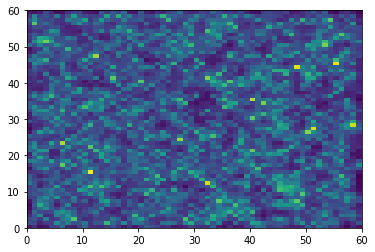

Still going... 0


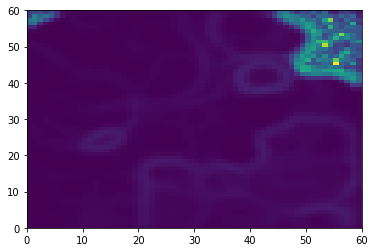

Still going... 100000


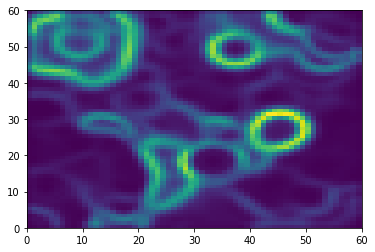

Still going... 200000


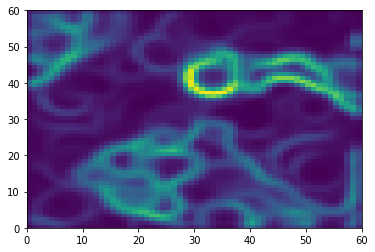

Still going... 300000


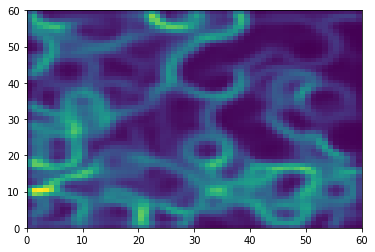

Still going... 400000
Previous decay:  0.5
Updated decay:  0.4
Previous decay:  1.0
Updated decay:  0.8
Cycle -  0  - Complete!!


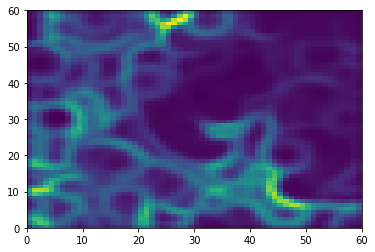

Still going... 0


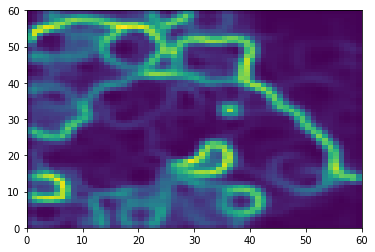

Still going... 100000


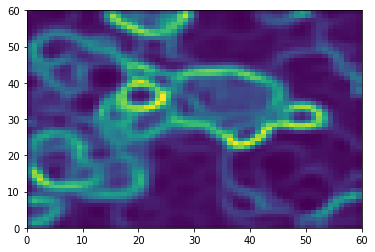

Still going... 200000


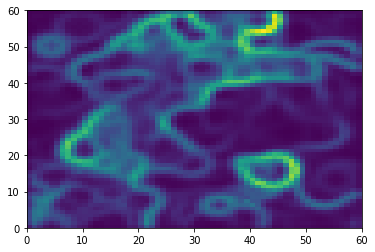

Still going... 300000


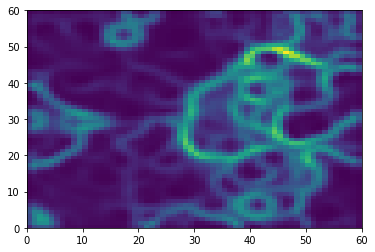

Still going... 400000
Previous decay:  0.4
Updated decay:  0.26666666666666666
Previous decay:  0.8
Updated decay:  0.5333333333333333
Cycle -  1  - Complete!!


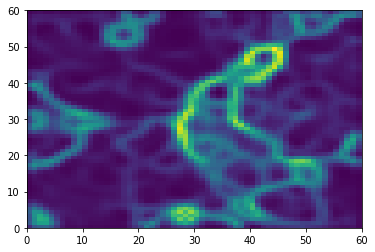

Still going... 0


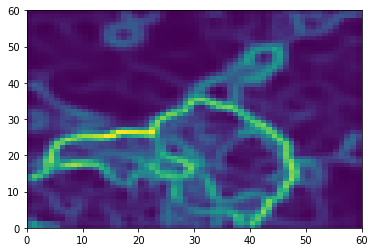

Still going... 100000


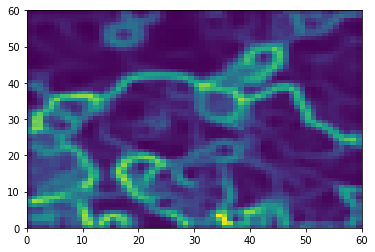

Still going... 200000


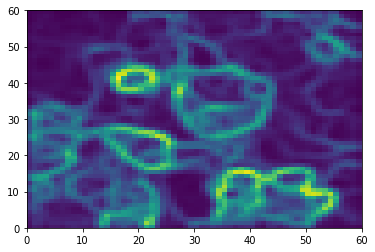

Still going... 300000


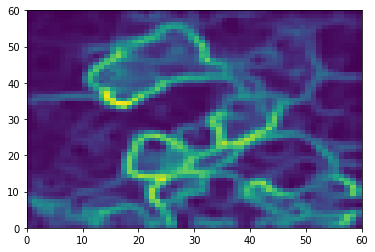

Still going... 400000
Previous decay:  0.26666666666666666
Updated decay:  0.15238095238095237
Previous decay:  0.5333333333333333
Updated decay:  0.30476190476190473
Cycle -  2  - Complete!!


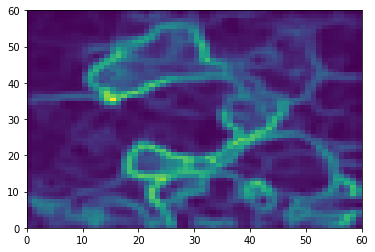

Still going... 0


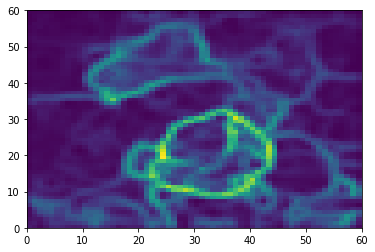

Still going... 100000


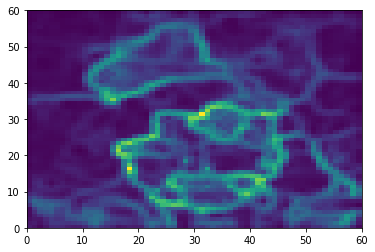

Still going... 200000


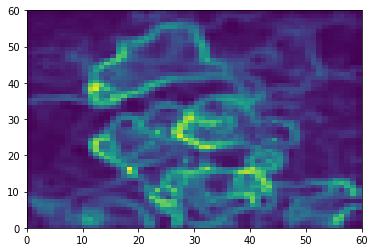

Still going... 300000


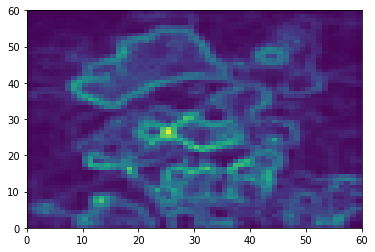

Still going... 400000
Previous decay:  0.15238095238095237
Updated decay:  0.07619047619047618
Previous decay:  0.30476190476190473
Updated decay:  0.15238095238095237
Cycle -  3  - Complete!!


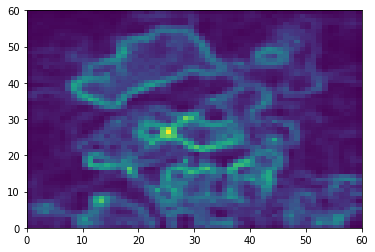

Still going... 0


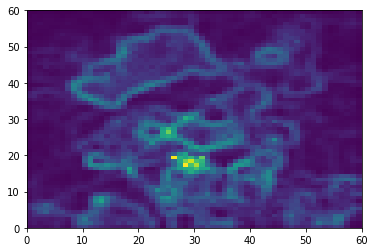

Still going... 100000


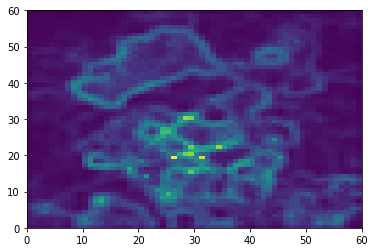

Still going... 200000


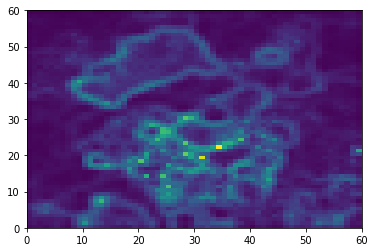

Still going... 300000


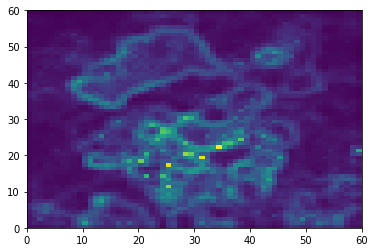

Still going... 400000
Previous decay:  0.07619047619047618
Updated decay:  0.03386243386243386
Previous decay:  0.15238095238095237
Updated decay:  0.06772486772486772
Cycle -  4  - Complete!!


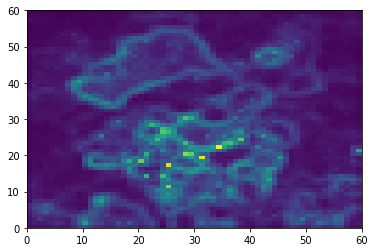

Still going... 0


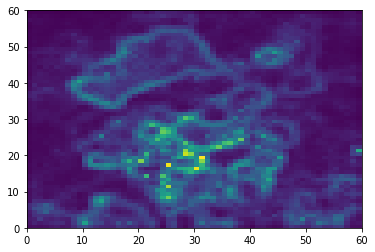

Still going... 100000


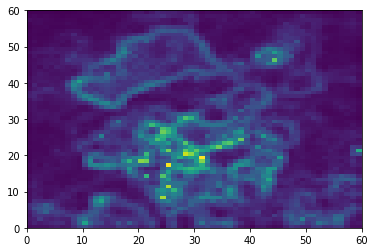

Still going... 200000


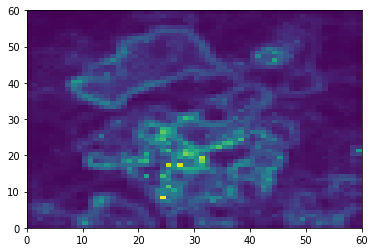

Still going... 300000


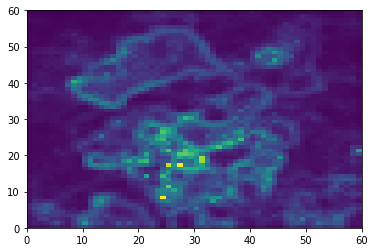

Still going... 400000
Previous decay:  0.03386243386243386
Updated decay:  0.013544973544973544
Previous decay:  0.06772486772486772
Updated decay:  0.027089947089947088
Cycle -  5  - Complete!!


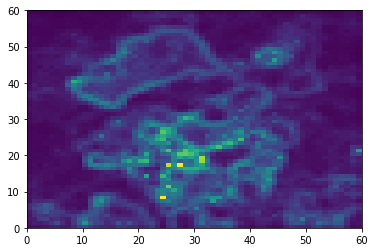

Still going... 0


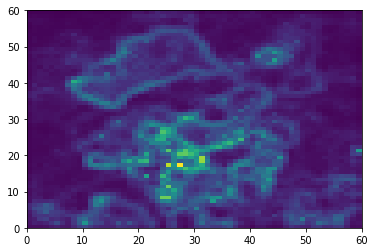

Still going... 100000


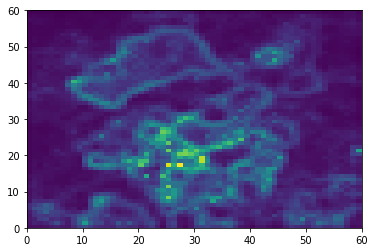

Still going... 200000


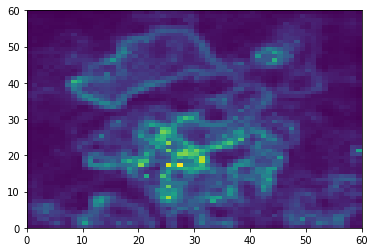

Still going... 300000


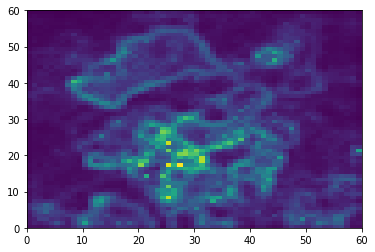

Still going... 400000
Previous decay:  0.013544973544973544
Updated decay:  0.004925444925444925
Previous decay:  0.027089947089947088
Updated decay:  0.00985088985088985
Cycle -  6  - Complete!!
Sliding Window Training Complete!

...ready!


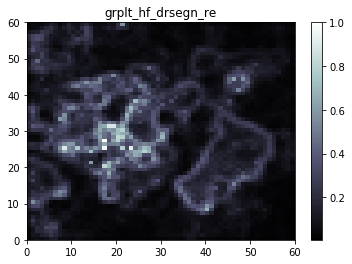

Mapping in progress... 1
Mapping in progress... 501
Mapping in progress... 1001
Mapping in progress... 1501
Mapping in progress... 2001
Mapping in progress... 2501
Mapping in progress... 3001
Mapping in progress... 3501
Mapping in progress... 4001
Mapping in progress... 4501
Mapping in progress... 5001
Mapping in progress... 5501
Mapping in progress... 6001
Mapping in progress... 6501
Mapping in progress... 7001
Mapping in progress... 7501
Mapping in progress... 8001
Mapping in progress... 8501
Mapping in progress... 9001
Mapping in progress... 9501
Mapping in progress... 10001
Mapping in progress... 10501
Mapping in progress... 11001
Mapping in progress... 11501
Mapping in progress... 12001
Mapping in progress... 12501
Mapping in progress... 13001
Mapping in progress... 13501
Mapping in progress... 14001
Mapping in progress... 14501
Mapping in progress... 15001
Mapping in progress... 15501
Mapping in progress... 16001
Mapping in progress... 16501
Mapping in progress... 17001
Mapping i

Mapping in progress... 140501
Mapping in progress... 141001
Mapping in progress... 141501
Mapping in progress... 142001
Mapping in progress... 142501
Mapping in progress... 143001
Mapping in progress... 143501
Mapping in progress... 144001
Mapping in progress... 144501
Mapping in progress... 145001
Mapping in progress... 145501
Mapping in progress... 146001
Mapping in progress... 146501
Mapping in progress... 147001
Mapping in progress... 147501
Mapping in progress... 148001
Mapping in progress... 148501
Mapping in progress... 149001
Mapping in progress... 149501
Mapping in progress... 150001
Mapping in progress... 150501
Mapping in progress... 151001
Mapping in progress... 151501
Mapping in progress... 152001
Mapping in progress... 152501
Mapping in progress... 153001
Mapping in progress... 153501
Mapping in progress... 154001
Mapping in progress... 154501
Mapping in progress... 155001
Mapping in progress... 155501
Mapping in progress... 156001
Mapping in progress... 156501
Mapping in

Mapping in progress... 277501
Mapping in progress... 278001
Mapping in progress... 278501
Mapping in progress... 279001
Mapping in progress... 279501
Mapping in progress... 280001
Mapping in progress... 280501
Mapping in progress... 281001
Mapping in progress... 281501
Mapping in progress... 282001
Mapping in progress... 282501
Mapping in progress... 283001
Mapping in progress... 283501
Mapping in progress... 284001
Mapping in progress... 284501
Mapping in progress... 285001
Mapping in progress... 285501
Mapping in progress... 286001
Mapping in progress... 286501
Mapping in progress... 287001
Mapping in progress... 287501
Mapping in progress... 288001
Mapping in progress... 288501
Mapping in progress... 289001
Mapping in progress... 289501
Mapping in progress... 290001
Mapping in progress... 290501
Mapping in progress... 291001
Mapping in progress... 291501
Mapping in progress... 292001
Mapping in progress... 292501
Mapping in progress... 293001
Mapping in progress... 293501
Mapping in

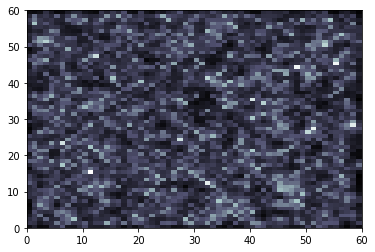

Still going... 0


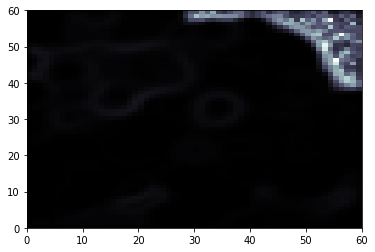

Still going... 100000


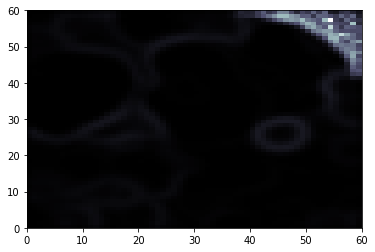

Still going... 200000


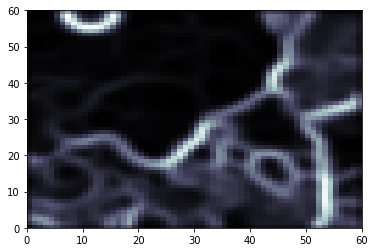

Still going... 300000


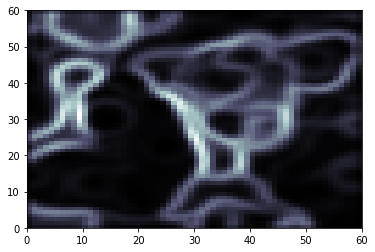

Still going... 400000
Previous decay:  0.5
Updated decay:  0.4
Previous decay:  1.0
Updated decay:  0.8
Cycle -  0  - Complete!!


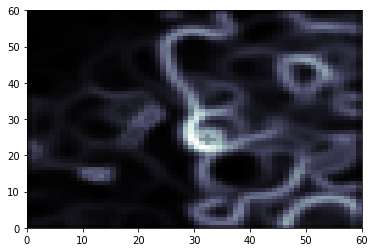

Still going... 0


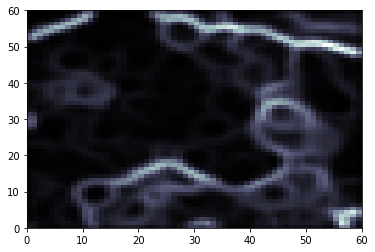

Still going... 100000


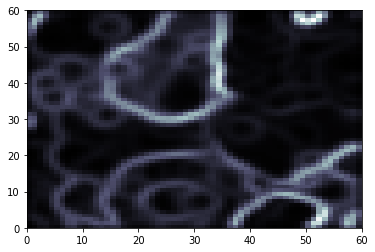

Still going... 200000


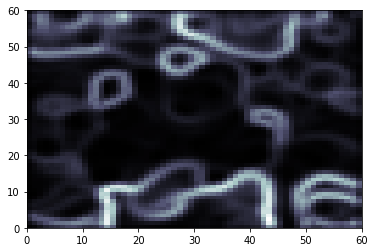

Still going... 300000


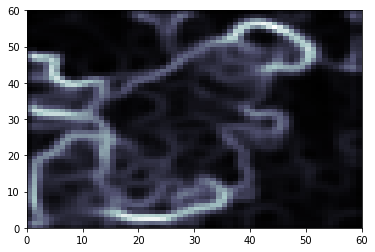

Still going... 400000
Previous decay:  0.4
Updated decay:  0.26666666666666666
Previous decay:  0.8
Updated decay:  0.5333333333333333
Cycle -  1  - Complete!!


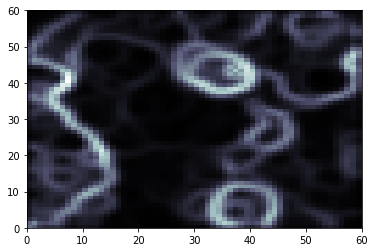

Still going... 0


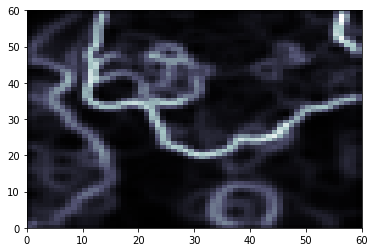

Still going... 100000


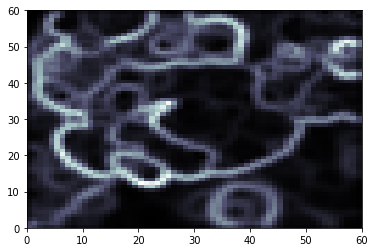

Still going... 200000


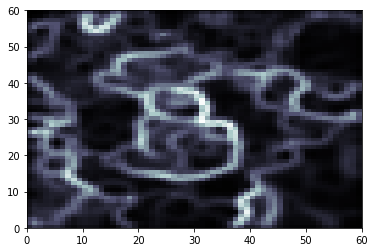

Still going... 300000


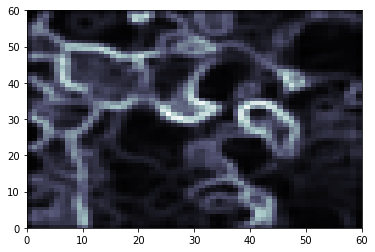

Still going... 400000
Previous decay:  0.26666666666666666
Updated decay:  0.15238095238095237
Previous decay:  0.5333333333333333
Updated decay:  0.30476190476190473
Cycle -  2  - Complete!!


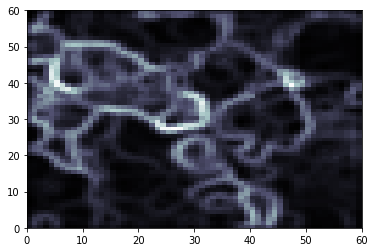

Still going... 0


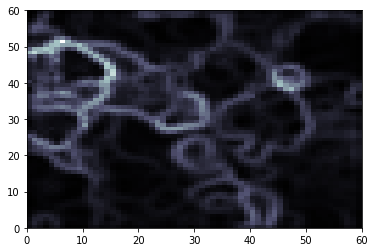

Still going... 100000


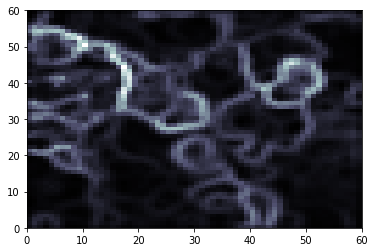

Still going... 200000


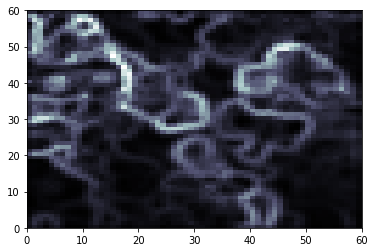

Still going... 300000


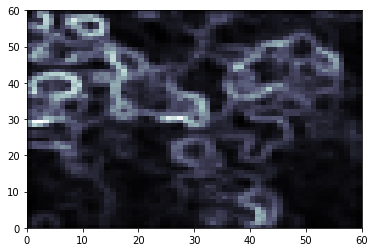

Still going... 400000
Previous decay:  0.15238095238095237
Updated decay:  0.07619047619047618
Previous decay:  0.30476190476190473
Updated decay:  0.15238095238095237
Cycle -  3  - Complete!!


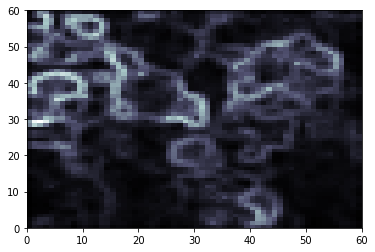

Still going... 0


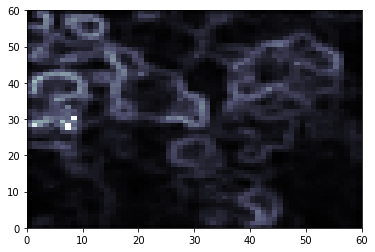

Still going... 100000


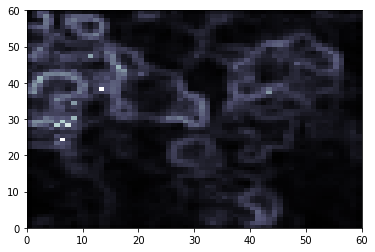

Still going... 200000


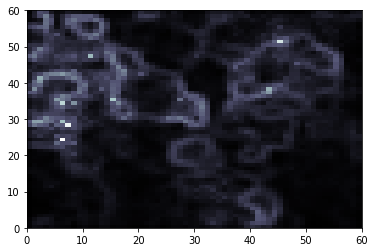

Still going... 300000


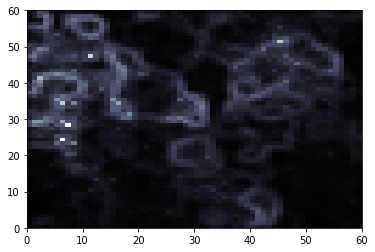

Still going... 400000
Previous decay:  0.07619047619047618
Updated decay:  0.03386243386243386
Previous decay:  0.15238095238095237
Updated decay:  0.06772486772486772
Cycle -  4  - Complete!!


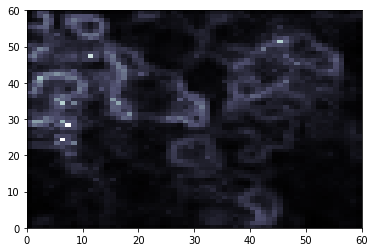

Still going... 0


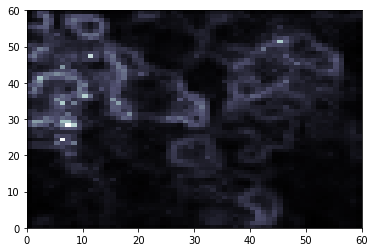

Still going... 100000


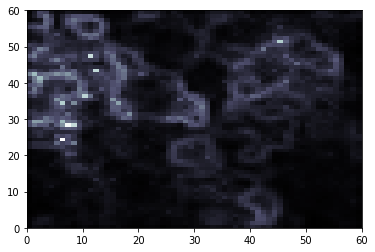

Still going... 200000


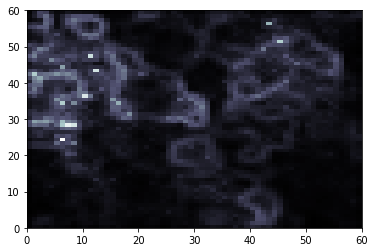

Still going... 300000


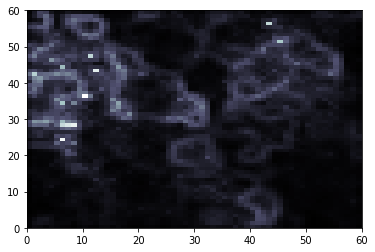

Still going... 400000
Previous decay:  0.03386243386243386
Updated decay:  0.013544973544973544
Previous decay:  0.06772486772486772
Updated decay:  0.027089947089947088
Cycle -  5  - Complete!!


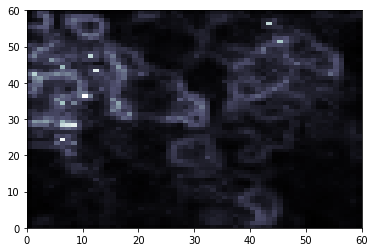

Still going... 0


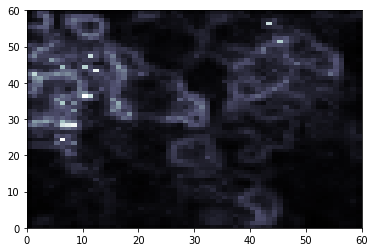

Still going... 100000


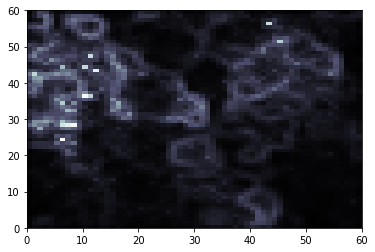

Still going... 200000


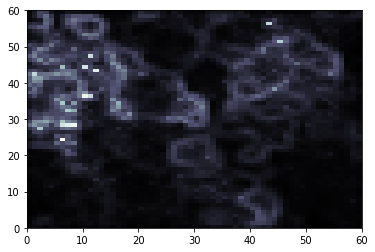

Still going... 300000


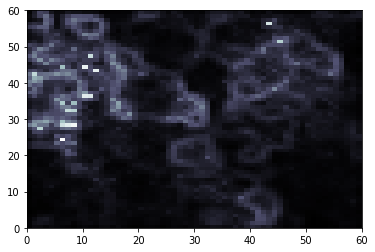

Still going... 400000
Previous decay:  0.013544973544973544
Updated decay:  0.004925444925444925
Previous decay:  0.027089947089947088
Updated decay:  0.00985088985088985
Cycle -  6  - Complete!!
Sliding Window Training Complete!

...ready!


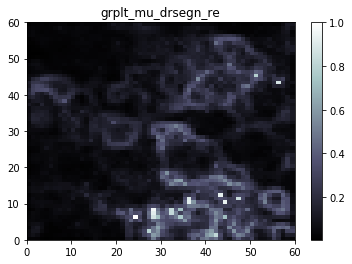

Mapping in progress... 1
Mapping in progress... 501
Mapping in progress... 1001
Mapping in progress... 1501
Mapping in progress... 2001
Mapping in progress... 2501
Mapping in progress... 3001
Mapping in progress... 3501
Mapping in progress... 4001
Mapping in progress... 4501
Mapping in progress... 5001
Mapping in progress... 5501
Mapping in progress... 6001
Mapping in progress... 6501
Mapping in progress... 7001
Mapping in progress... 7501
Mapping in progress... 8001
Mapping in progress... 8501
Mapping in progress... 9001
Mapping in progress... 9501
Mapping in progress... 10001
Mapping in progress... 10501
Mapping in progress... 11001
Mapping in progress... 11501
Mapping in progress... 12001
Mapping in progress... 12501
Mapping in progress... 13001
Mapping in progress... 13501
Mapping in progress... 14001
Mapping in progress... 14501
Mapping in progress... 15001
Mapping in progress... 15501
Mapping in progress... 16001
Mapping in progress... 16501
Mapping in progress... 17001
Mapping i

Mapping in progress... 140501
Mapping in progress... 141001
Mapping in progress... 141501
Mapping in progress... 142001
Mapping in progress... 142501
Mapping in progress... 143001
Mapping in progress... 143501
Mapping in progress... 144001
Mapping in progress... 144501
Mapping in progress... 145001
Mapping in progress... 145501
Mapping in progress... 146001
Mapping in progress... 146501
Mapping in progress... 147001
Mapping in progress... 147501
Mapping in progress... 148001
Mapping in progress... 148501
Mapping in progress... 149001
Mapping in progress... 149501
Mapping in progress... 150001
Mapping in progress... 150501
Mapping in progress... 151001
Mapping in progress... 151501
Mapping in progress... 152001
Mapping in progress... 152501
Mapping in progress... 153001
Mapping in progress... 153501
Mapping in progress... 154001
Mapping in progress... 154501
Mapping in progress... 155001
Mapping in progress... 155501
Mapping in progress... 156001
Mapping in progress... 156501
Mapping in

Mapping in progress... 277501
Mapping in progress... 278001
Mapping in progress... 278501
Mapping in progress... 279001
Mapping in progress... 279501
Mapping in progress... 280001
Mapping in progress... 280501
Mapping in progress... 281001
Mapping in progress... 281501
Mapping in progress... 282001
Mapping in progress... 282501
Mapping in progress... 283001
Mapping in progress... 283501
Mapping in progress... 284001
Mapping in progress... 284501
Mapping in progress... 285001
Mapping in progress... 285501
Mapping in progress... 286001
Mapping in progress... 286501
Mapping in progress... 287001
Mapping in progress... 287501
Mapping in progress... 288001
Mapping in progress... 288501
Mapping in progress... 289001
Mapping in progress... 289501
Mapping in progress... 290001
Mapping in progress... 290501
Mapping in progress... 291001
Mapping in progress... 291501
Mapping in progress... 292001
Mapping in progress... 292501
Mapping in progress... 293001
Mapping in progress... 293501
Mapping in

Mapping in progress... 414501
Mapping in progress... 415001
Mapping in progress... 415501
Mapping in progress... 416001
Mapping in progress... 416501
Mapping in progress... 417001
Mapping in progress... 417501
Mapping in progress... 418001
Mapping in progress... 418501
Mapping in progress... 419001
Mapping in progress... 419501
Mapping in progress... 420001
Mapping in progress... 420501
Mapping in progress... 421001
Mapping in progress... 421501
Mapping in progress... 422001
Mapping in progress... 422501
Mapping in progress... 423001
Mapping in progress... 423501
Mapping in progress... 424001
Mapping in progress... 424501
Mapping in progress... 425001
Mapping in progress... 425501
Mapping in progress... 426001
Mapping in progress... 426501
Mapping in progress... 427001
Mapping in progress... 427501
Mapping in progress... 428001
weights saved!!
**************************************

Using data:  te_drsegn_re Its shape:  (433032, 35)
Using weight:  te_drsegn_re_init Its shape:  (60, 60,

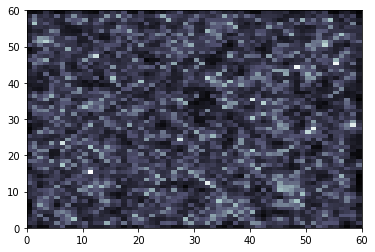

Still going... 0


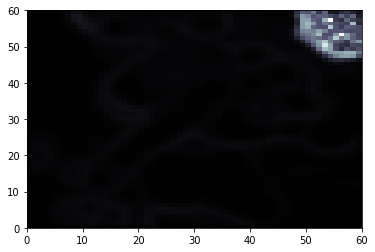

Still going... 100000


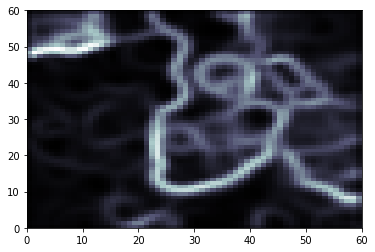

Still going... 200000


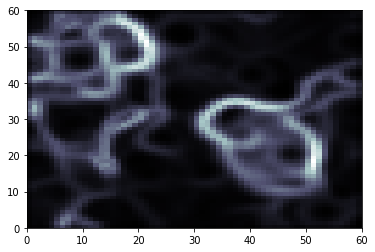

Still going... 300000


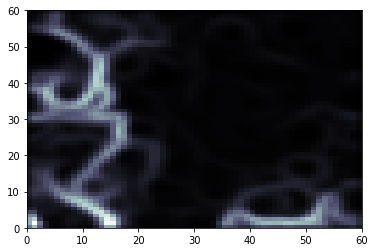

Still going... 400000
Previous decay:  0.5
Updated decay:  0.4
Previous decay:  1.0
Updated decay:  0.8
Cycle -  0  - Complete!!


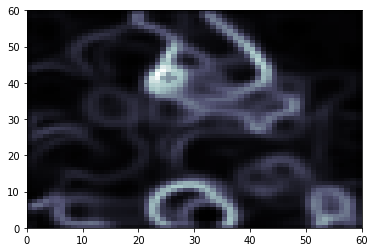

Still going... 0


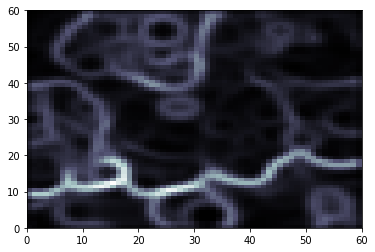

Still going... 100000


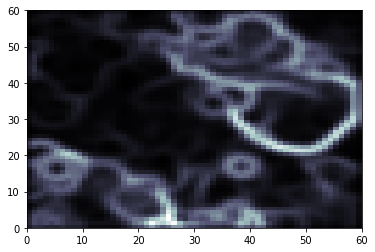

Still going... 200000


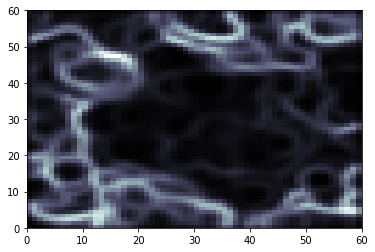

Still going... 300000


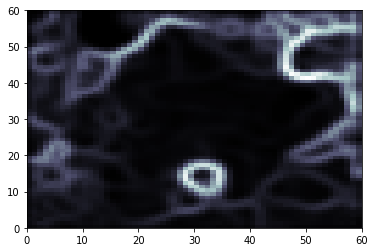

Still going... 400000
Previous decay:  0.4
Updated decay:  0.26666666666666666
Previous decay:  0.8
Updated decay:  0.5333333333333333
Cycle -  1  - Complete!!


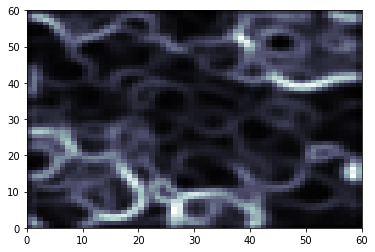

Still going... 0


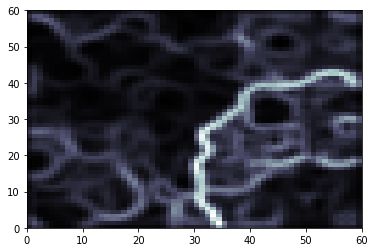

Still going... 100000


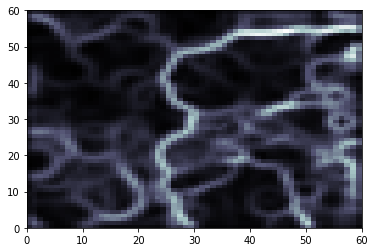

Still going... 200000


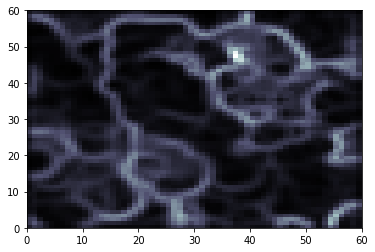

Still going... 300000


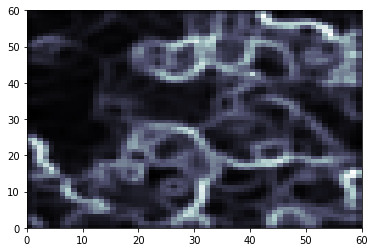

Still going... 400000
Previous decay:  0.26666666666666666
Updated decay:  0.15238095238095237
Previous decay:  0.5333333333333333
Updated decay:  0.30476190476190473
Cycle -  2  - Complete!!


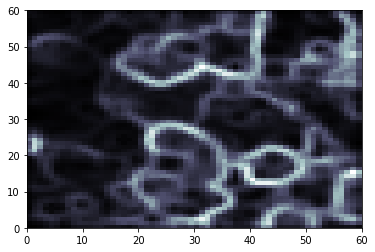

Still going... 0


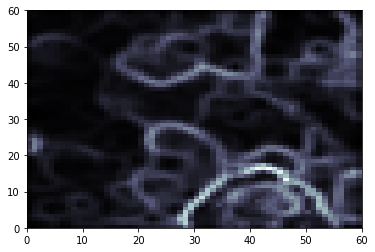

Still going... 100000


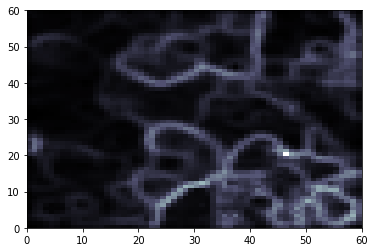

Still going... 200000


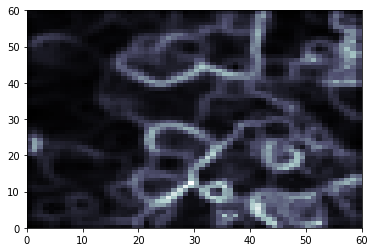

Still going... 300000


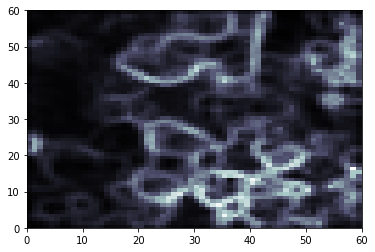

Still going... 400000
Previous decay:  0.15238095238095237
Updated decay:  0.07619047619047618
Previous decay:  0.30476190476190473
Updated decay:  0.15238095238095237
Cycle -  3  - Complete!!


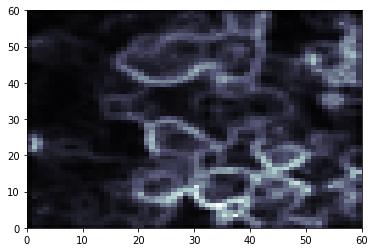

Still going... 0


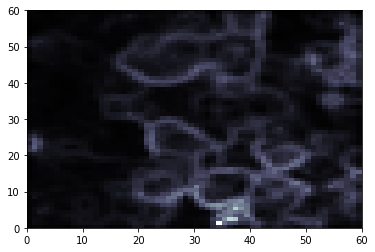

Still going... 100000


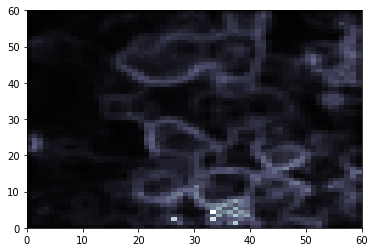

Still going... 200000


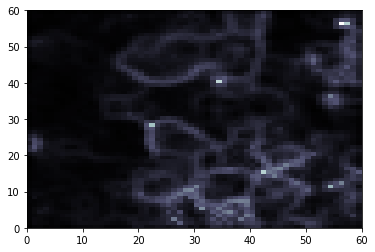

Still going... 300000


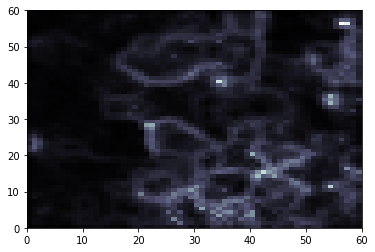

Still going... 400000
Previous decay:  0.07619047619047618
Updated decay:  0.03386243386243386
Previous decay:  0.15238095238095237
Updated decay:  0.06772486772486772
Cycle -  4  - Complete!!


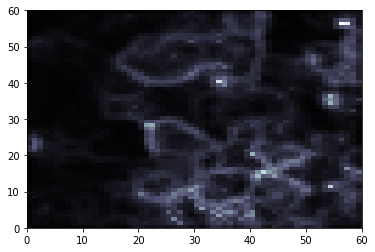

Still going... 0


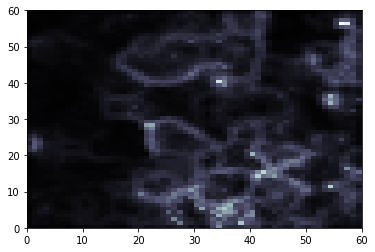

Still going... 100000


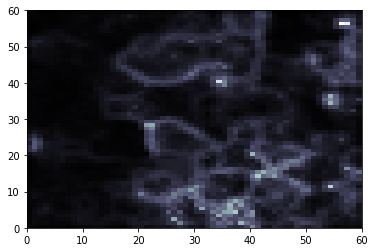

Still going... 200000


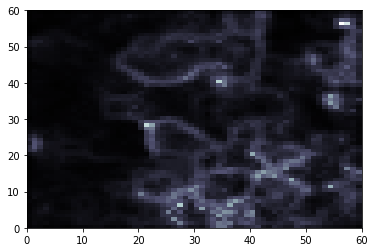

Still going... 300000


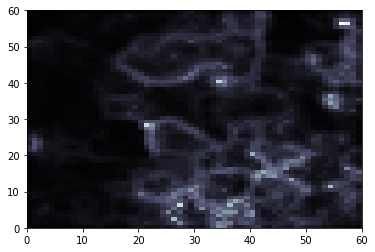

Still going... 400000
Previous decay:  0.03386243386243386
Updated decay:  0.013544973544973544
Previous decay:  0.06772486772486772
Updated decay:  0.027089947089947088
Cycle -  5  - Complete!!


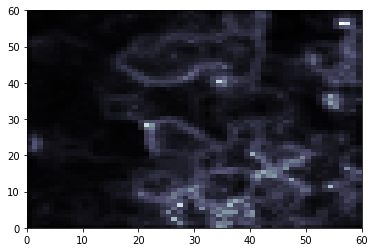

Still going... 0


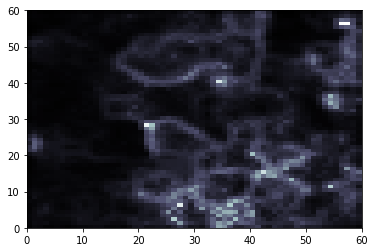

Still going... 100000


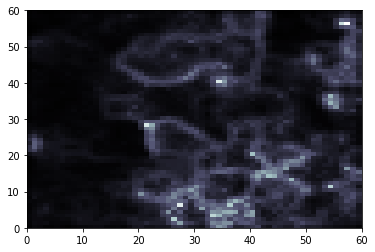

Still going... 200000


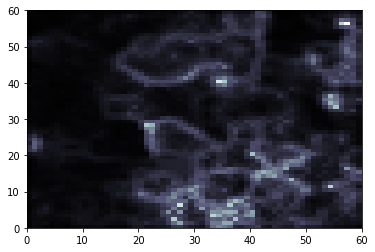

Still going... 300000


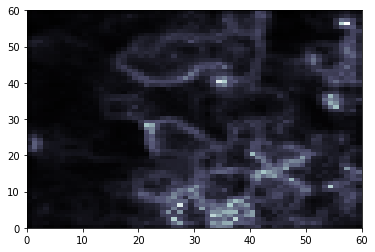

Still going... 400000
Previous decay:  0.013544973544973544
Updated decay:  0.004925444925444925
Previous decay:  0.027089947089947088
Updated decay:  0.00985088985088985
Cycle -  6  - Complete!!
Sliding Window Training Complete!

...ready!


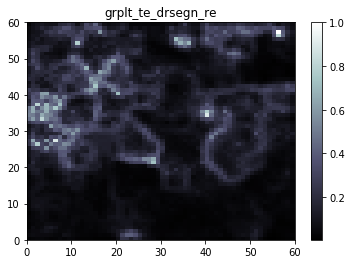

Mapping in progress... 1
Mapping in progress... 501
Mapping in progress... 1001
Mapping in progress... 1501
Mapping in progress... 2001
Mapping in progress... 2501
Mapping in progress... 3001
Mapping in progress... 3501
Mapping in progress... 4001
Mapping in progress... 4501
Mapping in progress... 5001
Mapping in progress... 5501
Mapping in progress... 6001
Mapping in progress... 6501
Mapping in progress... 7001
Mapping in progress... 7501
Mapping in progress... 8001
Mapping in progress... 8501
Mapping in progress... 9001
Mapping in progress... 9501
Mapping in progress... 10001
Mapping in progress... 10501
Mapping in progress... 11001
Mapping in progress... 11501
Mapping in progress... 12001
Mapping in progress... 12501
Mapping in progress... 13001
Mapping in progress... 13501
Mapping in progress... 14001
Mapping in progress... 14501
Mapping in progress... 15001
Mapping in progress... 15501
Mapping in progress... 16001
Mapping in progress... 16501
Mapping in progress... 17001
Mapping i

Mapping in progress... 140501
Mapping in progress... 141001
Mapping in progress... 141501
Mapping in progress... 142001
Mapping in progress... 142501
Mapping in progress... 143001
Mapping in progress... 143501
Mapping in progress... 144001
Mapping in progress... 144501
Mapping in progress... 145001
Mapping in progress... 145501
Mapping in progress... 146001
Mapping in progress... 146501
Mapping in progress... 147001
Mapping in progress... 147501
Mapping in progress... 148001
Mapping in progress... 148501
Mapping in progress... 149001
Mapping in progress... 149501
Mapping in progress... 150001
Mapping in progress... 150501
Mapping in progress... 151001
Mapping in progress... 151501
Mapping in progress... 152001
Mapping in progress... 152501
Mapping in progress... 153001
Mapping in progress... 153501
Mapping in progress... 154001
Mapping in progress... 154501
Mapping in progress... 155001
Mapping in progress... 155501
Mapping in progress... 156001
Mapping in progress... 156501
Mapping in

Mapping in progress... 277501
Mapping in progress... 278001
Mapping in progress... 278501
Mapping in progress... 279001
Mapping in progress... 279501
Mapping in progress... 280001
Mapping in progress... 280501
Mapping in progress... 281001
Mapping in progress... 281501
Mapping in progress... 282001
Mapping in progress... 282501
Mapping in progress... 283001
Mapping in progress... 283501
Mapping in progress... 284001
Mapping in progress... 284501
Mapping in progress... 285001
Mapping in progress... 285501
Mapping in progress... 286001
Mapping in progress... 286501
Mapping in progress... 287001
Mapping in progress... 287501
Mapping in progress... 288001
Mapping in progress... 288501
Mapping in progress... 289001
Mapping in progress... 289501
Mapping in progress... 290001
Mapping in progress... 290501
Mapping in progress... 291001
Mapping in progress... 291501
Mapping in progress... 292001
Mapping in progress... 292501
Mapping in progress... 293001
Mapping in progress... 293501
Mapping in

Mapping in progress... 414501
Mapping in progress... 415001
Mapping in progress... 415501
Mapping in progress... 416001
Mapping in progress... 416501
Mapping in progress... 417001
Mapping in progress... 417501
Mapping in progress... 418001
Mapping in progress... 418501
Mapping in progress... 419001
Mapping in progress... 419501
Mapping in progress... 420001
Mapping in progress... 420501
Mapping in progress... 421001
Mapping in progress... 421501
Mapping in progress... 422001
Mapping in progress... 422501
Mapping in progress... 423001
Mapping in progress... 423501
Mapping in progress... 424001
Mapping in progress... 424501
Mapping in progress... 425001
Mapping in progress... 425501
Mapping in progress... 426001
Mapping in progress... 426501
Mapping in progress... 427001
Mapping in progress... 427501
Mapping in progress... 428001
Mapping in progress... 428501
Mapping in progress... 429001
Mapping in progress... 429501
Mapping in progress... 430001
Mapping in progress... 430501
Mapping in

In [22]:
# RUN ONLY AFTER OTHER TESTS ARE COMPLETE...`
ind_list = all_run(remap_data, f_wts, 7, 1.0, 0.5, True)

In [95]:
f_wts['hf_drsegn_re_init'][:30, :30, :].shape

(30, 30, 35)

In [25]:
# convert index list to dictionary
nlist = list(remap_data.keys())
ind_di = dict()
for i in range(1, len(nlist)):
    nname = nlist[i] + "_id"
    ind_di[nname] = ind_list[i-1]
    
ind_di.keys()

dict_keys(['hf_drsegn_re_id', 'mu_drsegn_re_id', 'te_drsegn_re_id'])

In [30]:
target = dr_seg['te_drseg'].iloc[:, 7]

In [31]:
# running all the data
def all_skip(onedata, label, onewt, cycles, sig, lr, save):
    
    # set locations:
    d_loc = 'results'
    wt_loc = 'weights'
    name = "tex_brseg_"
    win, ind = slide_skip(0, onedata, label, onewt, cycles, sig, lr, d_loc, wt_loc, name, save)
    
    return ind

Som of size:  (20, 20, 35)  has been initialized
Training begins...


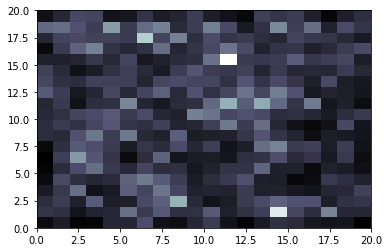

Still going... 0


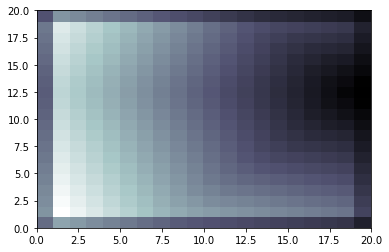

Still going... 100000


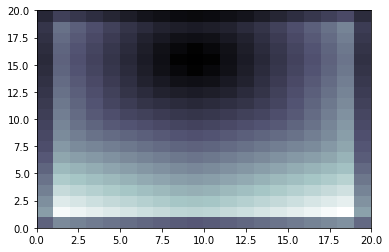

Still going... 200000


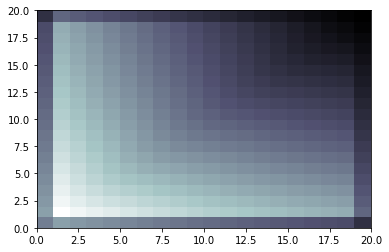

Still going... 300000


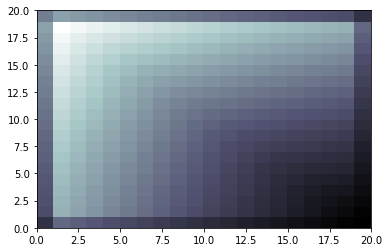

Still going... 400000
Previous decay:  0.5
Updated decay:  0.4444444444444444
Previous decay:  19
Updated decay:  16.88888888888889
Cycle -  0  - Complete!!


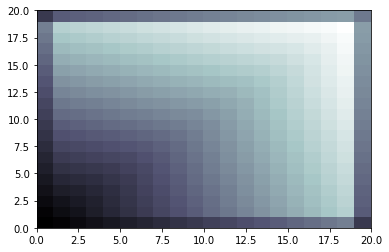

Still going... 0


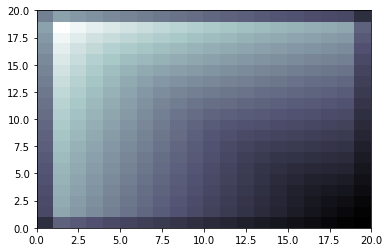

Still going... 100000


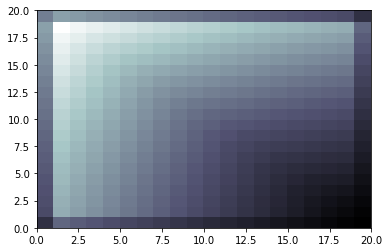

Still going... 200000


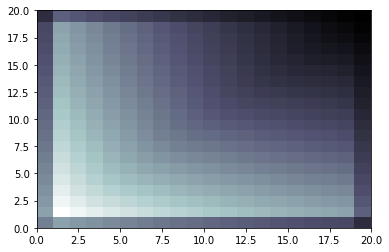

Still going... 300000


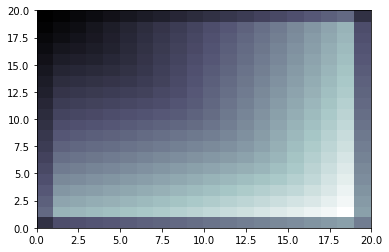

Still going... 400000
Previous decay:  0.4444444444444444
Updated decay:  0.3555555555555555
Previous decay:  16.88888888888889
Updated decay:  13.511111111111111
Cycle -  1  - Complete!!


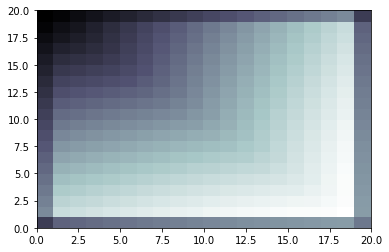

Still going... 0


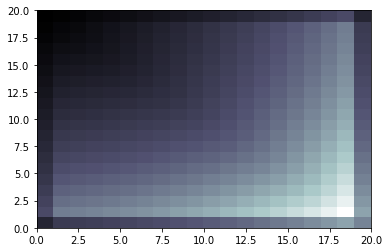

Still going... 100000


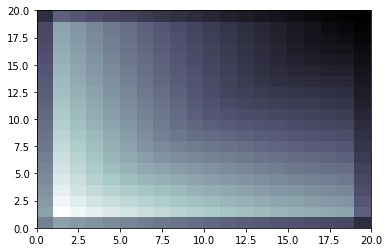

Still going... 200000


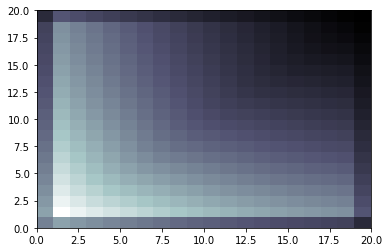

Still going... 300000


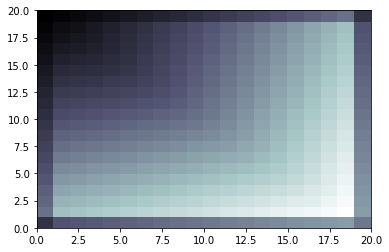

Still going... 400000
Previous decay:  0.3555555555555555
Updated decay:  0.25858585858585853
Previous decay:  13.511111111111111
Updated decay:  9.826262626262626
Cycle -  2  - Complete!!


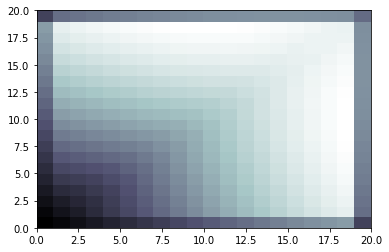

Still going... 0


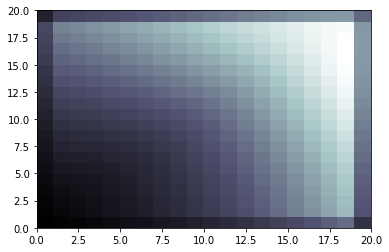

Still going... 100000


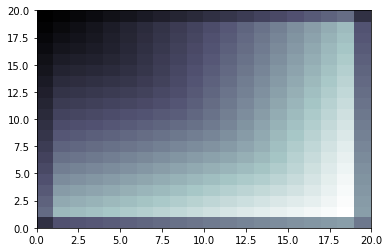

Still going... 200000


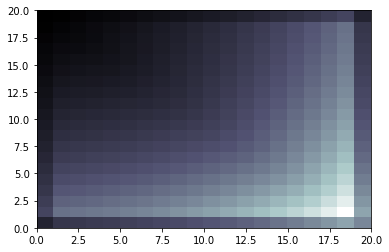

Still going... 300000


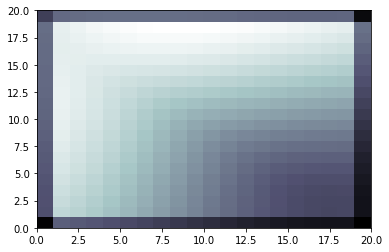

Still going... 400000
Previous decay:  0.25858585858585853
Updated decay:  0.17239057239057234
Previous decay:  9.826262626262626
Updated decay:  6.550841750841751
Cycle -  3  - Complete!!


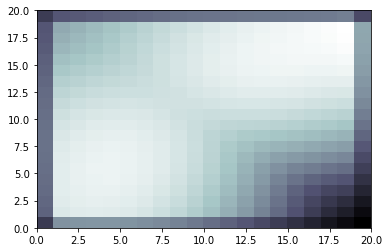

Still going... 0


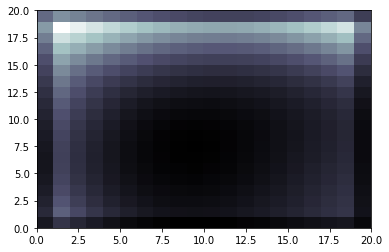

Still going... 100000


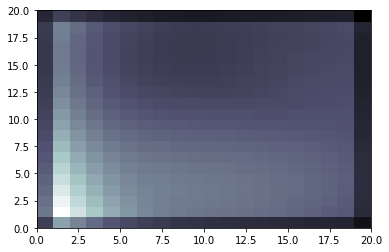

Still going... 200000


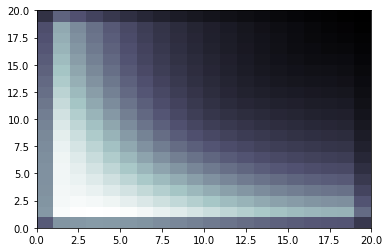

Still going... 300000


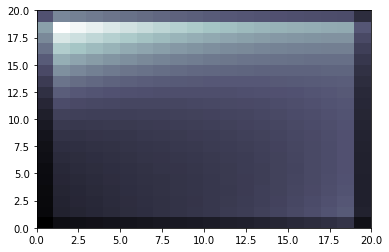

Still going... 400000
Previous decay:  0.17239057239057234
Updated decay:  0.10608650608650606
Previous decay:  6.550841750841751
Updated decay:  4.031287231287231
Cycle -  4  - Complete!!


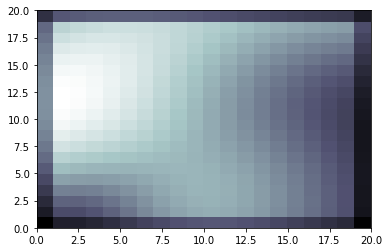

Still going... 0


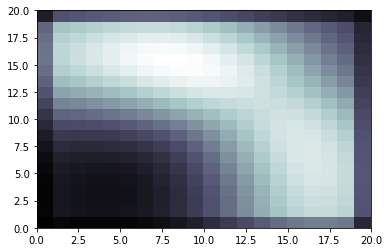

Still going... 100000


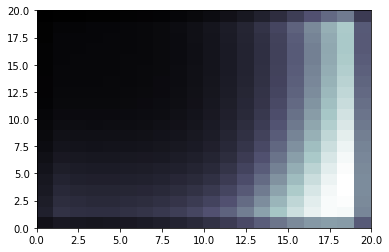

Still going... 200000


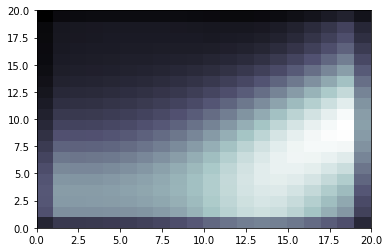

Still going... 300000


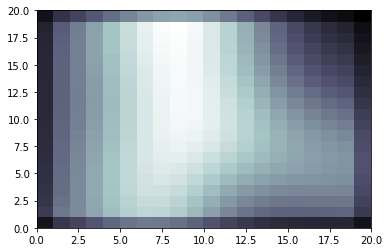

Still going... 400000
Previous decay:  0.10608650608650606
Updated decay:  0.060620860620860605
Previous decay:  4.031287231287231
Updated decay:  2.3035927035927033
Cycle -  5  - Complete!!


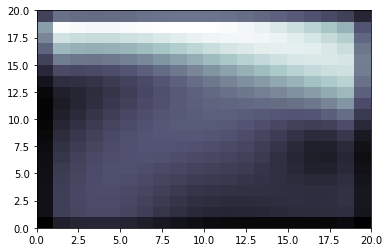

Still going... 0


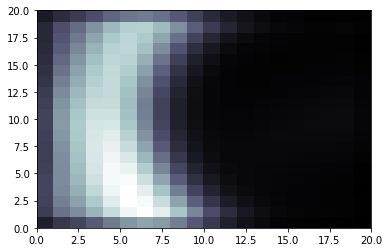

Still going... 100000


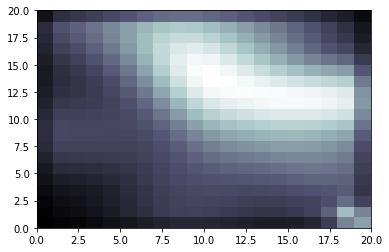

Still going... 200000


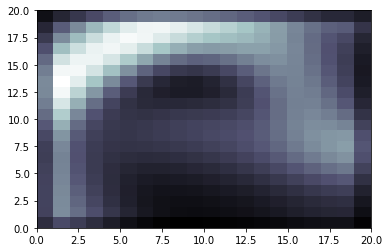

Still going... 300000


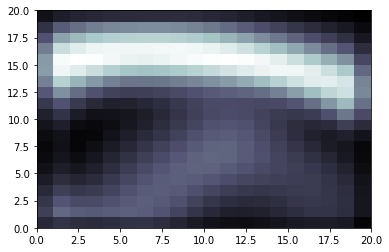

Still going... 400000
Previous decay:  0.060620860620860605
Updated decay:  0.03233112566445899
Previous decay:  2.3035927035927033
Updated decay:  1.2285827752494418
Cycle -  6  - Complete!!


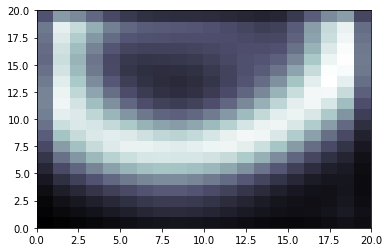

Still going... 0


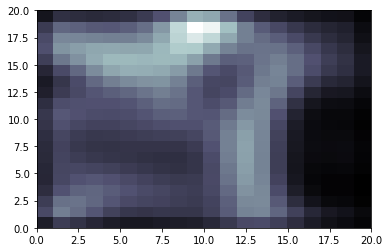

Still going... 100000


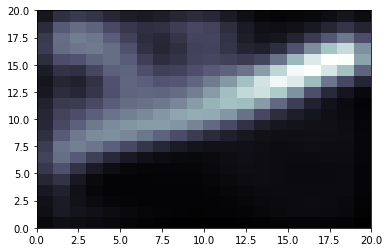

Still going... 200000


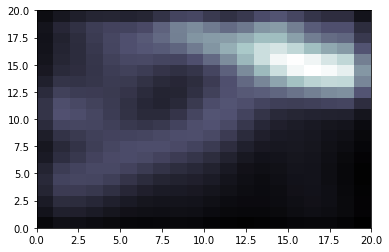

Still going... 300000


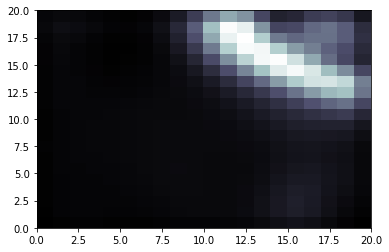

Still going... 400000
Previous decay:  0.03233112566445899
Updated decay:  0.016165562832229495
Previous decay:  1.2285827752494418
Updated decay:  0.6142913876247209
Cycle -  7  - Complete!!


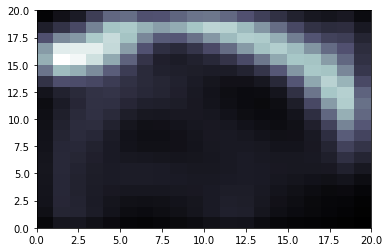

Still going... 0


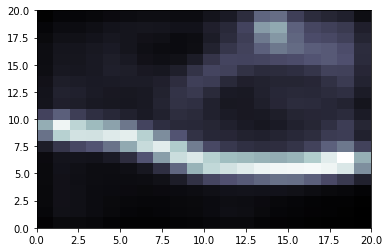

Still going... 100000


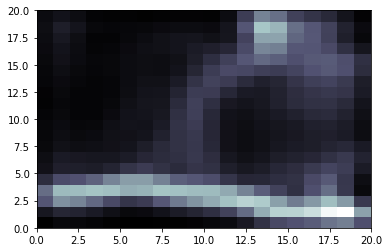

Still going... 200000


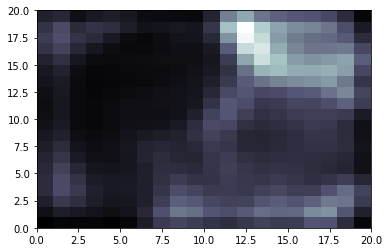

Still going... 300000


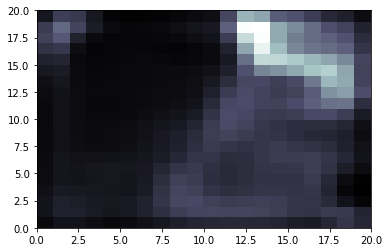

Still going... 400000
Previous decay:  0.016165562832229495
Updated decay:  0.007607323685755056
Previous decay:  0.6142913876247209
Updated decay:  0.2890783000586922
Cycle -  8  - Complete!!


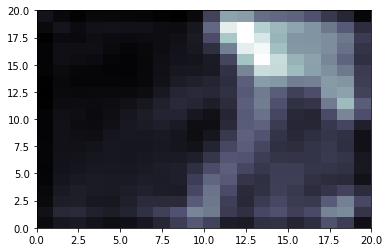

Still going... 0


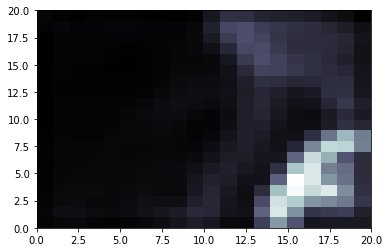

Still going... 100000


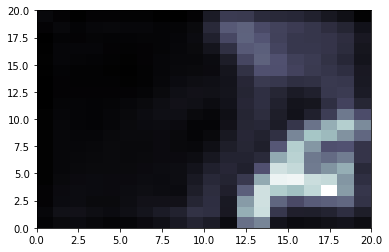

Still going... 200000


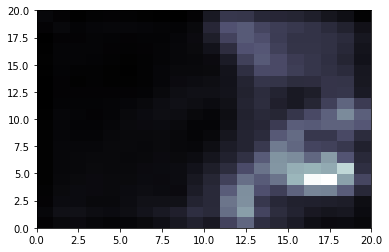

Still going... 300000


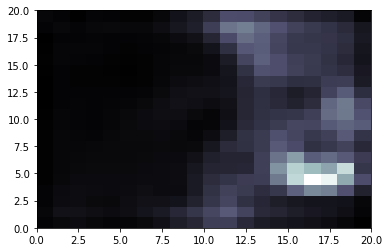

Still going... 400000
Previous decay:  0.007607323685755056
Updated decay:  0.0033810327492244693
Previous decay:  0.2890783000586922
Updated decay:  0.12847924447052986
Cycle -  9  - Complete!!


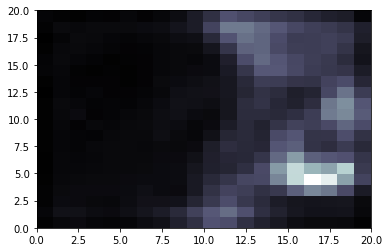

Still going... 0


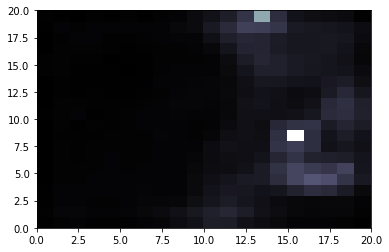

Still going... 100000


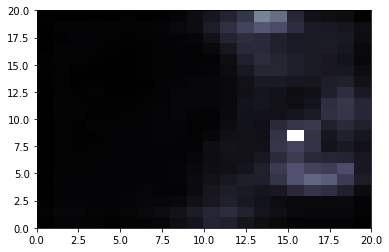

Still going... 200000


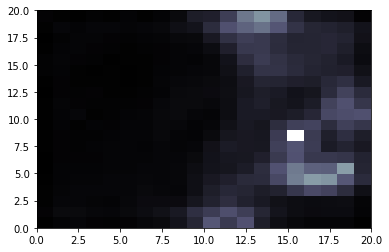

Still going... 300000


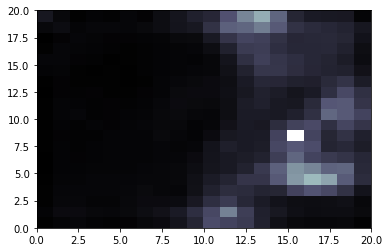

Still going... 400000
Previous decay:  0.0033810327492244693
Updated decay:  0.001423592736515566
Previous decay:  0.12847924447052986
Updated decay:  0.054096523987591516
Cycle -  10  - Complete!!


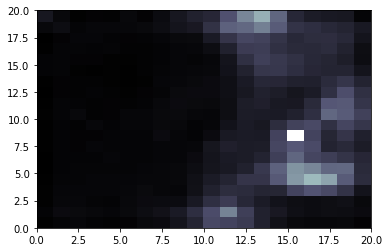

Still going... 0


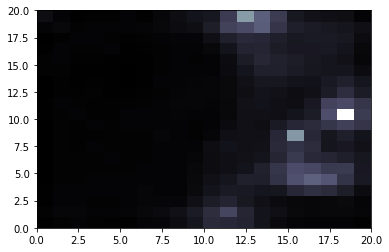

Still going... 100000


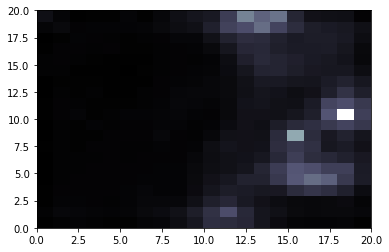

Still going... 200000


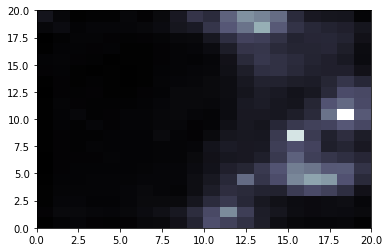

Still going... 300000


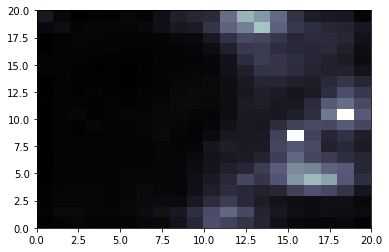

Still going... 400000
Previous decay:  0.001423592736515566
Updated decay:  0.0005694370946062264
Previous decay:  0.054096523987591516
Updated decay:  0.021638609595036606
Cycle -  11  - Complete!!


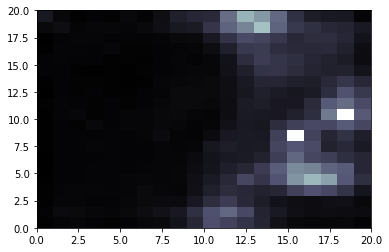

Still going... 0


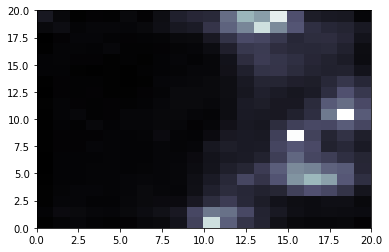

Still going... 100000


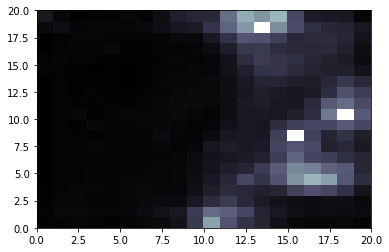

Still going... 200000


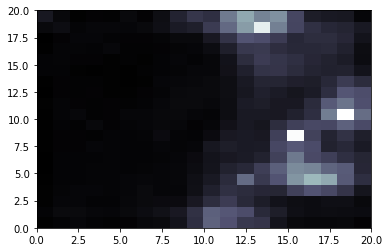

Still going... 300000


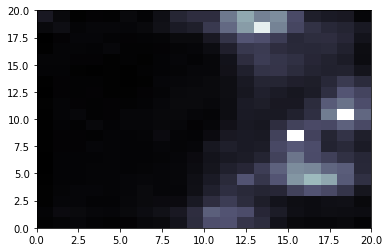

Still going... 400000
Previous decay:  0.0005694370946062264
Updated decay:  0.00021692841699284815
Previous decay:  0.021638609595036606
Updated decay:  0.008243279845728231
Cycle -  12  - Complete!!


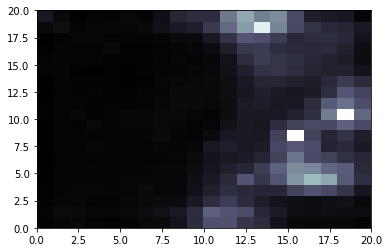

Still going... 0


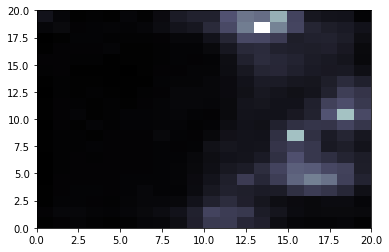

Still going... 100000


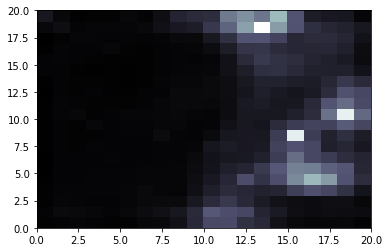

Still going... 200000


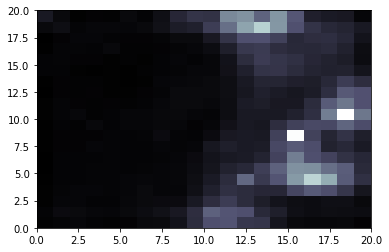

Still going... 300000


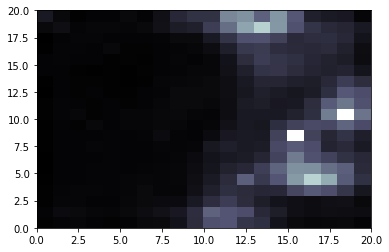

Still going... 400000
Previous decay:  0.00021692841699284815
Updated decay:  7.888306072467206e-05
Previous decay:  0.008243279845728231
Updated decay:  0.0029975563075375386
Cycle -  13  - Complete!!


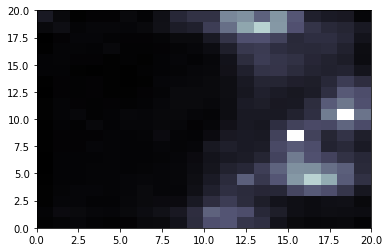

Still going... 0


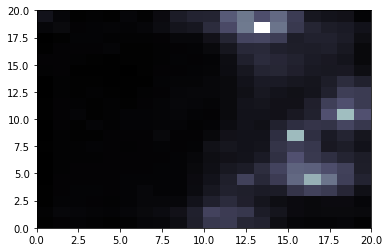

Still going... 100000


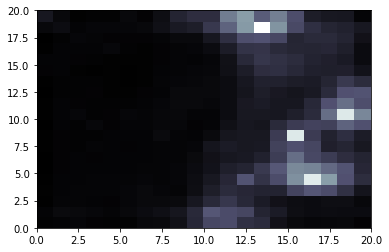

Still going... 200000


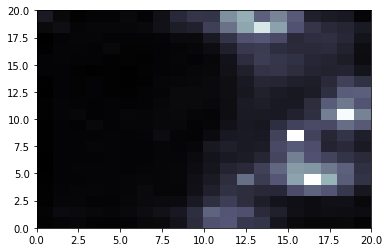

Still going... 300000


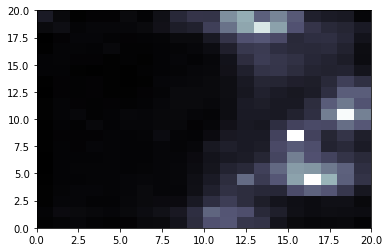

Still going... 400000
Previous decay:  7.888306072467206e-05
Updated decay:  2.743758633901637e-05
Previous decay:  0.0029975563075375386
Updated decay:  0.0010426282808826222
Cycle -  14  - Complete!!
Sliding Window Training AFTER SKIP Complete!

...ready!


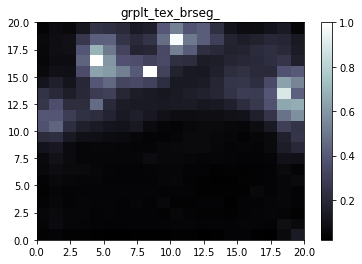

Mapping in progress... 1
Mapping in progress... 501
Mapping in progress... 1001
Mapping in progress... 1501
Mapping in progress... 2001
Mapping in progress... 2501
Mapping in progress... 3001
Mapping in progress... 3501
Mapping in progress... 4001
Mapping in progress... 4501
Mapping in progress... 5001
Mapping in progress... 5501
Mapping in progress... 6001
Mapping in progress... 6501
Mapping in progress... 7001
Mapping in progress... 7501
Mapping in progress... 8001
Mapping in progress... 8501
Mapping in progress... 9001
Mapping in progress... 9501
Mapping in progress... 10001
Mapping in progress... 10501
Mapping in progress... 11001
Mapping in progress... 11501
Mapping in progress... 12001
Mapping in progress... 12501
Mapping in progress... 13001
Mapping in progress... 13501
Mapping in progress... 14001
Mapping in progress... 14501
Mapping in progress... 15001
Mapping in progress... 15501
Mapping in progress... 16001
Mapping in progress... 16501
Mapping in progress... 17001
Mapping i

Mapping in progress... 140501
Mapping in progress... 141001
Mapping in progress... 141501
Mapping in progress... 142001
Mapping in progress... 142501
Mapping in progress... 143001
Mapping in progress... 143501
Mapping in progress... 144001
Mapping in progress... 144501
Mapping in progress... 145001
Mapping in progress... 145501
Mapping in progress... 146001
Mapping in progress... 146501
Mapping in progress... 147001
Mapping in progress... 147501
Mapping in progress... 148001
Mapping in progress... 148501
Mapping in progress... 149001
Mapping in progress... 149501
Mapping in progress... 150001
Mapping in progress... 150501
Mapping in progress... 151001
Mapping in progress... 151501
Mapping in progress... 152001
Mapping in progress... 152501
Mapping in progress... 153001
Mapping in progress... 153501
Mapping in progress... 154001
Mapping in progress... 154501
Mapping in progress... 155001
Mapping in progress... 155501
Mapping in progress... 156001
Mapping in progress... 156501
Mapping in

Mapping in progress... 277501
Mapping in progress... 278001
Mapping in progress... 278501
Mapping in progress... 279001
Mapping in progress... 279501
Mapping in progress... 280001
Mapping in progress... 280501
Mapping in progress... 281001
Mapping in progress... 281501
Mapping in progress... 282001
Mapping in progress... 282501
Mapping in progress... 283001
Mapping in progress... 283501
Mapping in progress... 284001
Mapping in progress... 284501
Mapping in progress... 285001
Mapping in progress... 285501
Mapping in progress... 286001
Mapping in progress... 286501
Mapping in progress... 287001
Mapping in progress... 287501
Mapping in progress... 288001
Mapping in progress... 288501
Mapping in progress... 289001
Mapping in progress... 289501
Mapping in progress... 290001
Mapping in progress... 290501
Mapping in progress... 291001
Mapping in progress... 291501
Mapping in progress... 292001
Mapping in progress... 292501
Mapping in progress... 293001
Mapping in progress... 293501
Mapping in

Mapping in progress... 414501
Mapping in progress... 415001
Mapping in progress... 415501
Mapping in progress... 416001
Mapping in progress... 416501
Mapping in progress... 417001
Mapping in progress... 417501
Mapping in progress... 418001
Mapping in progress... 418501
Mapping in progress... 419001
Mapping in progress... 419501
Mapping in progress... 420001
Mapping in progress... 420501
Mapping in progress... 421001
Mapping in progress... 421501
Mapping in progress... 422001
Mapping in progress... 422501
Mapping in progress... 423001
Mapping in progress... 423501
Mapping in progress... 424001
Mapping in progress... 424501
Mapping in progress... 425001
Mapping in progress... 425501
Mapping in progress... 426001
Mapping in progress... 426501
Mapping in progress... 427001
Mapping in progress... 427501
Mapping in progress... 428001
Mapping in progress... 428501
Mapping in progress... 429001
Mapping in progress... 429501
Mapping in progress... 430001
Mapping in progress... 430501
Mapping in

In [46]:
nind = all_skip(remap_data['te_drsegn_re'], target, f_wts['al_drsegn_re_init'][:20, :20, :], 15, 19, 0.5, True)

In [32]:
# running all the data
def all_rand(onedata, label, onewt, cycles, sig, lr, save):
    
    # set locations:
    d_loc = 'results'
    wt_loc = 'weights'
    name = "tex_brseg_"
    win, ind = slide_rand(onedata, label, onewt, cycles, sig, lr, d_loc, wt_loc, name, save)
    
    return ind

# running all the data
def all_rands(onedata, label, onewt, cycles, sig, lr, save):
    
    # set locations:
    d_loc = 'results'
    wt_loc = 'weights'
    name = "tex_brseg_"
    win, ind = slide_rands(onedata, label, onewt, cycles, sig, lr, d_loc, wt_loc, name, save)
    
    return ind

In [46]:
remap_data['hf_drsegn_re'].shape

(406236, 35)

Som of size:  (30, 30, 35)  has been initialized
Training begins...


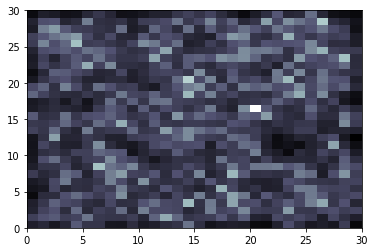

Still going... 0


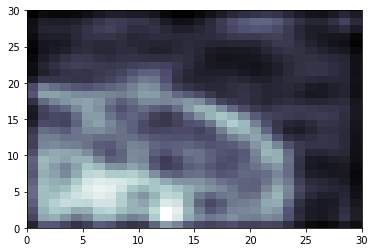

Still going... 100000


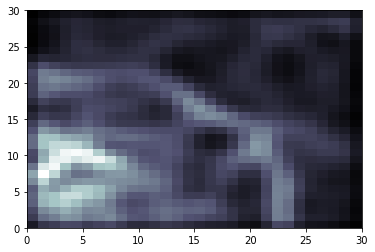

Still going... 200000


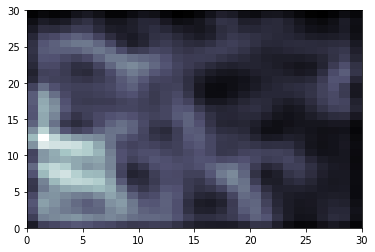

Still going... 300000


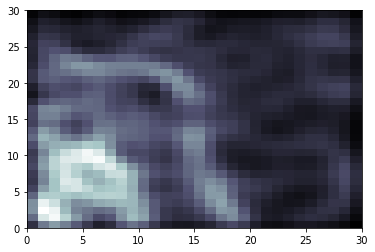

Still going... 400000
Previous decay:  0.5
Updated decay:  0.375
Previous decay:  1.0
Updated decay:  0.75
Cycle -  0  - Complete!!


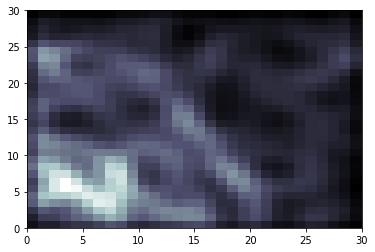

Still going... 0


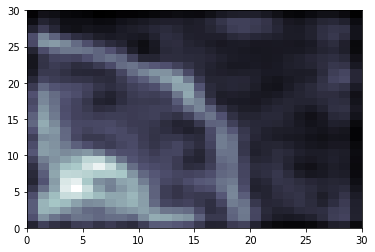

Still going... 100000


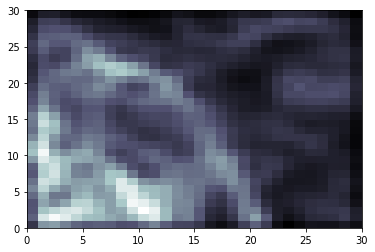

Still going... 200000


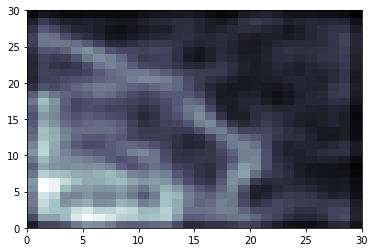

Still going... 300000


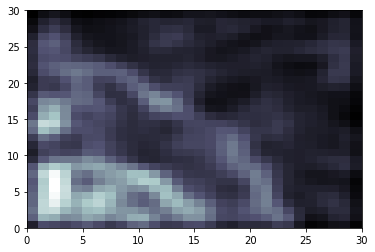

Still going... 400000
Previous decay:  0.375
Updated decay:  0.22500000000000003
Previous decay:  0.75
Updated decay:  0.45000000000000007
Cycle -  1  - Complete!!


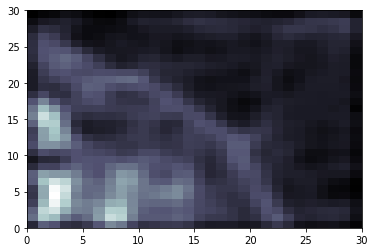

Still going... 0


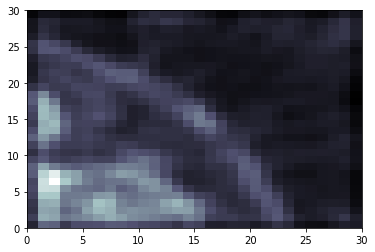

Still going... 100000


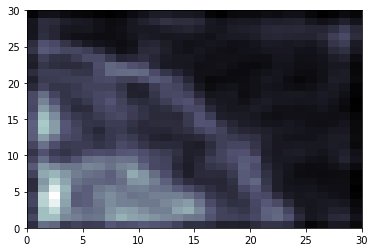

Still going... 200000


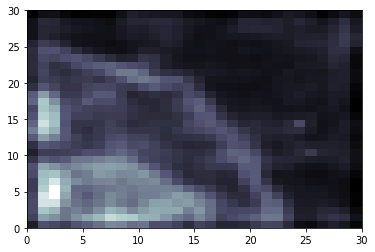

Still going... 300000


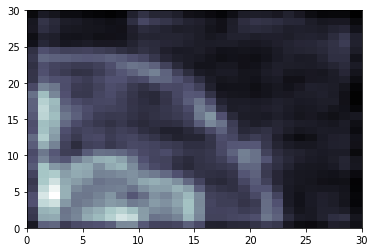

Still going... 400000
Previous decay:  0.22500000000000003
Updated decay:  0.11250000000000002
Previous decay:  0.45000000000000007
Updated decay:  0.22500000000000003
Cycle -  2  - Complete!!


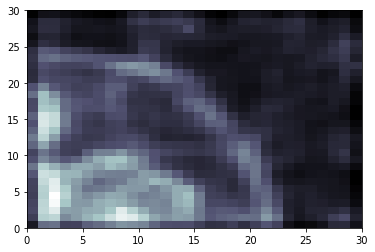

Still going... 0


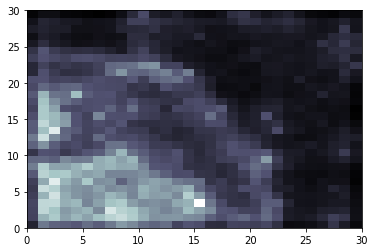

Still going... 100000


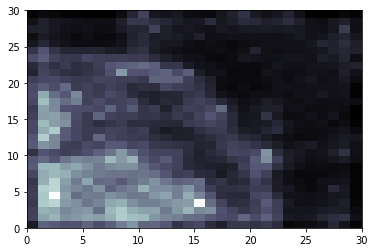

Still going... 200000


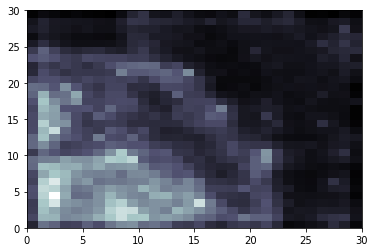

Still going... 300000


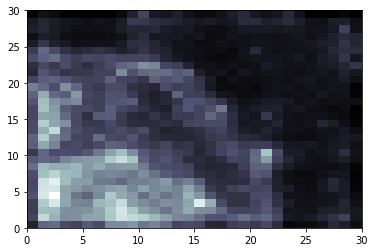

Still going... 400000
Previous decay:  0.11250000000000002
Updated decay:  0.04821428571428573
Previous decay:  0.22500000000000003
Updated decay:  0.09642857142857146
Cycle -  3  - Complete!!


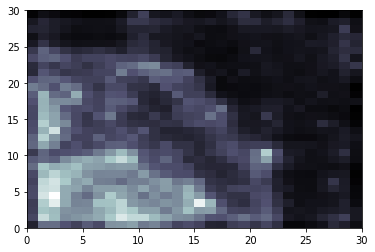

Still going... 0


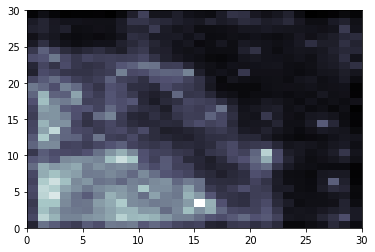

Still going... 100000


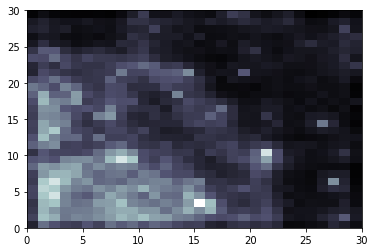

Still going... 200000


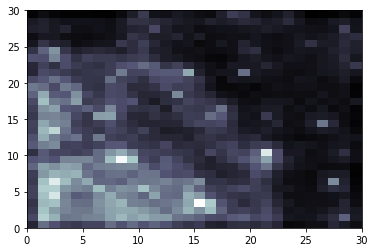

Still going... 300000


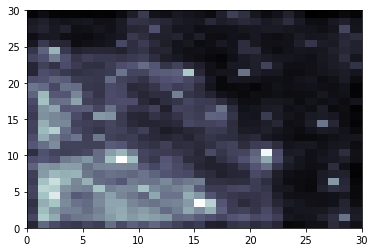

Still going... 400000
Previous decay:  0.04821428571428573
Updated decay:  0.018080357142857148
Previous decay:  0.09642857142857146
Updated decay:  0.036160714285714296
Cycle -  4  - Complete!!
Random Window Training Complete!

...ready!


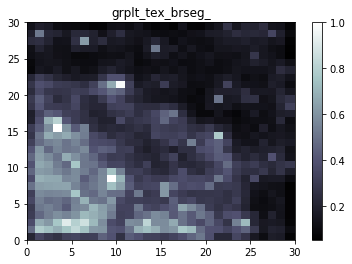

Mapping in progress... 1
Mapping in progress... 501
Mapping in progress... 1001
Mapping in progress... 1501
Mapping in progress... 2001
Mapping in progress... 2501
Mapping in progress... 3001
Mapping in progress... 3501
Mapping in progress... 4001
Mapping in progress... 4501
Mapping in progress... 5001
Mapping in progress... 5501
Mapping in progress... 6001
Mapping in progress... 6501
Mapping in progress... 7001
Mapping in progress... 7501
Mapping in progress... 8001
Mapping in progress... 8501
Mapping in progress... 9001
Mapping in progress... 9501
Mapping in progress... 10001
Mapping in progress... 10501
Mapping in progress... 11001
Mapping in progress... 11501
Mapping in progress... 12001
Mapping in progress... 12501
Mapping in progress... 13001
Mapping in progress... 13501
Mapping in progress... 14001
Mapping in progress... 14501
Mapping in progress... 15001
Mapping in progress... 15501
Mapping in progress... 16001
Mapping in progress... 16501
Mapping in progress... 17001
Mapping i

Mapping in progress... 140501
Mapping in progress... 141001
Mapping in progress... 141501
Mapping in progress... 142001
Mapping in progress... 142501
Mapping in progress... 143001
Mapping in progress... 143501
Mapping in progress... 144001
Mapping in progress... 144501
Mapping in progress... 145001
Mapping in progress... 145501
Mapping in progress... 146001
Mapping in progress... 146501
Mapping in progress... 147001
Mapping in progress... 147501
Mapping in progress... 148001
Mapping in progress... 148501
Mapping in progress... 149001
Mapping in progress... 149501
Mapping in progress... 150001
Mapping in progress... 150501
Mapping in progress... 151001
Mapping in progress... 151501
Mapping in progress... 152001
Mapping in progress... 152501
Mapping in progress... 153001
Mapping in progress... 153501
Mapping in progress... 154001
Mapping in progress... 154501
Mapping in progress... 155001
Mapping in progress... 155501
Mapping in progress... 156001
Mapping in progress... 156501
Mapping in

Mapping in progress... 277501
Mapping in progress... 278001
Mapping in progress... 278501
Mapping in progress... 279001
Mapping in progress... 279501
Mapping in progress... 280001
Mapping in progress... 280501
Mapping in progress... 281001
Mapping in progress... 281501
Mapping in progress... 282001
Mapping in progress... 282501
Mapping in progress... 283001
Mapping in progress... 283501
Mapping in progress... 284001
Mapping in progress... 284501
Mapping in progress... 285001
Mapping in progress... 285501
Mapping in progress... 286001
Mapping in progress... 286501
Mapping in progress... 287001
Mapping in progress... 287501
Mapping in progress... 288001
Mapping in progress... 288501
Mapping in progress... 289001
Mapping in progress... 289501
Mapping in progress... 290001
Mapping in progress... 290501
Mapping in progress... 291001
Mapping in progress... 291501
Mapping in progress... 292001
Mapping in progress... 292501
Mapping in progress... 293001
Mapping in progress... 293501
Mapping in

In [53]:
nhf = all_rand(remap_data['hf_drsegn_re'], target, f_wts['hf_drsegn_re_init'][:30, :30, :], 5, 1.0, 0.5, True)

Som of size:  (30, 30, 35)  has been initialized
Training begins...


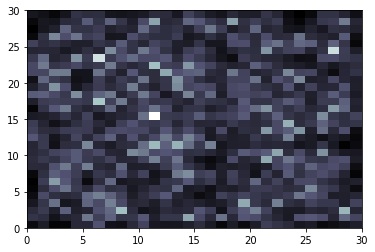

Still going... 0


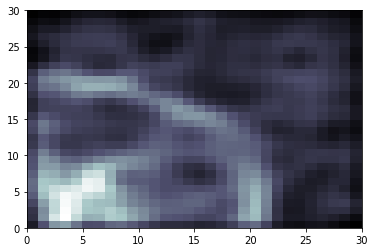

Still going... 100000


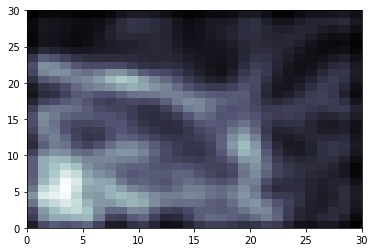

Still going... 200000


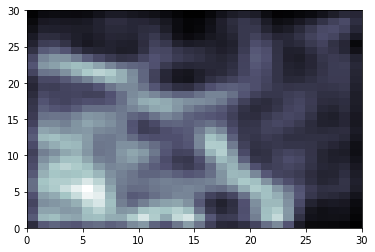

Still going... 300000


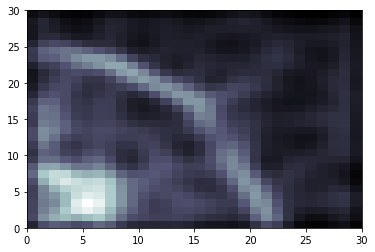

Still going... 400000
Previous decay:  0.5
Updated decay:  0.4230769230769231
Previous decay:  1.0
Updated decay:  0.8461538461538461
Cycle -  0  - Complete!!


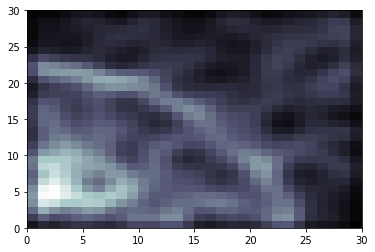

Still going... 0


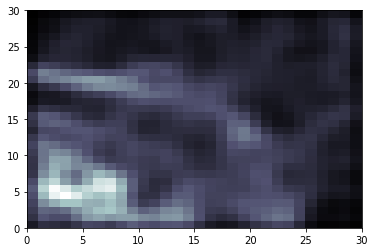

Still going... 100000


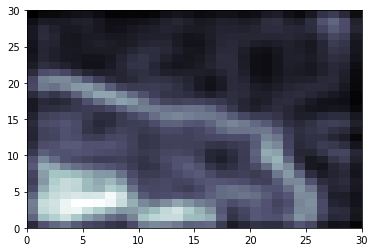

Still going... 200000


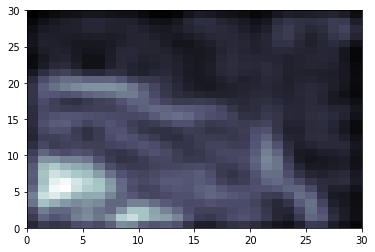

Still going... 300000


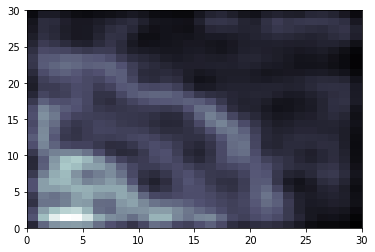

Still going... 400000
Previous decay:  0.4230769230769231
Updated decay:  0.3102564102564102
Previous decay:  0.8461538461538461
Updated decay:  0.6205128205128204
Cycle -  1  - Complete!!


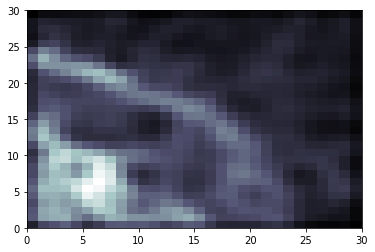

Still going... 0


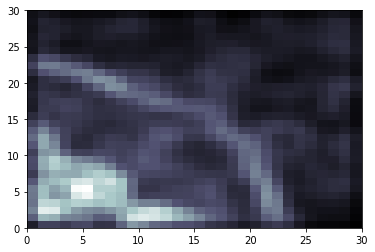

Still going... 100000


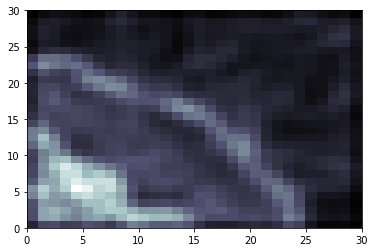

Still going... 200000


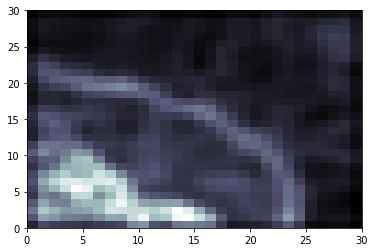

Still going... 300000


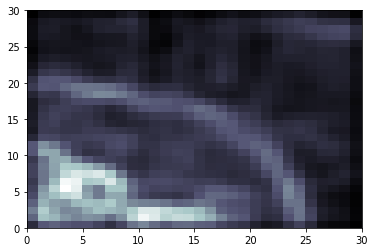

Still going... 400000
Previous decay:  0.3102564102564102
Updated decay:  0.20075414781297132
Previous decay:  0.6205128205128204
Updated decay:  0.40150829562594265
Cycle -  2  - Complete!!


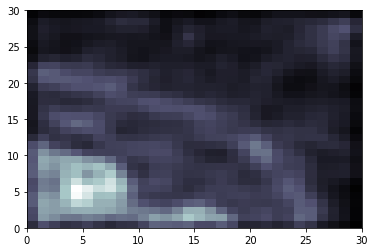

Still going... 0


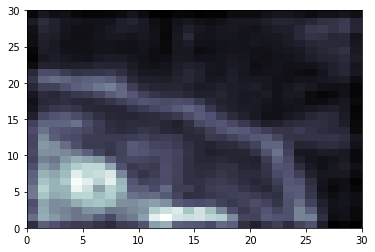

Still going... 100000


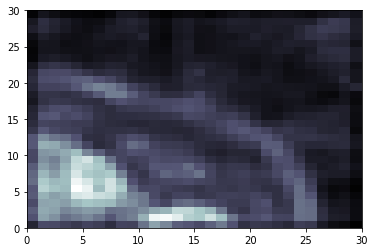

Still going... 200000


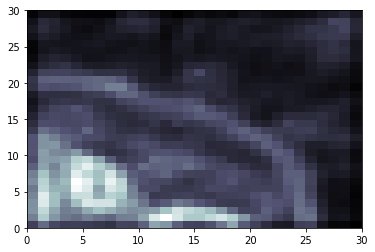

Still going... 300000


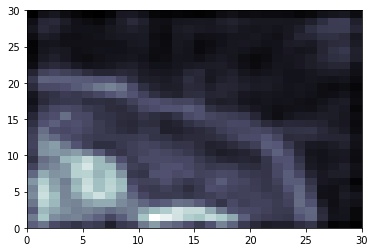

Still going... 400000
Previous decay:  0.20075414781297132
Updated decay:  0.11622608557593077
Previous decay:  0.40150829562594265
Updated decay:  0.23245217115186154
Cycle -  3  - Complete!!


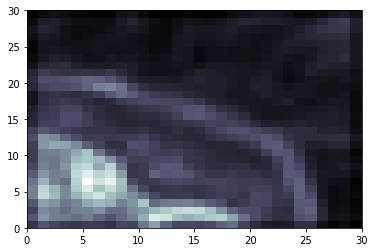

Still going... 0


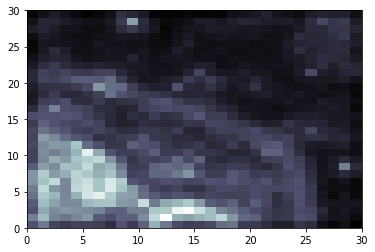

Still going... 100000


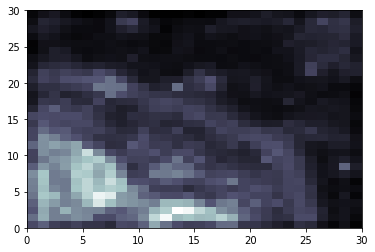

Still going... 200000


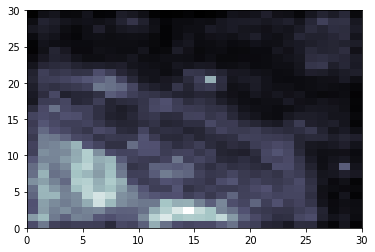

Still going... 300000


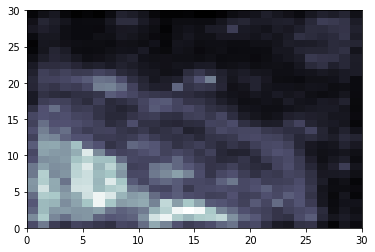

Still going... 400000
Previous decay:  0.11622608557593077
Updated decay:  0.06088033053977326
Previous decay:  0.23245217115186154
Updated decay:  0.12176066107954651
Cycle -  4  - Complete!!


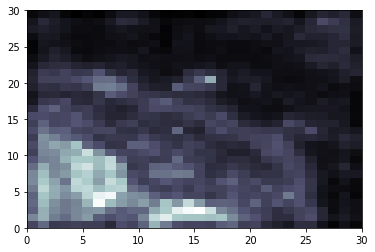

Still going... 0


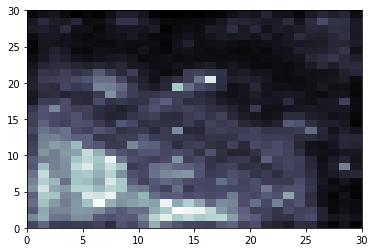

Still going... 100000


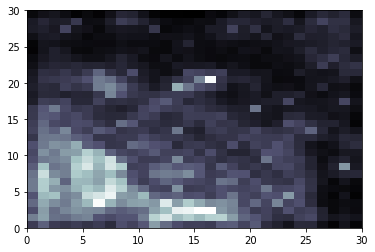

Still going... 200000


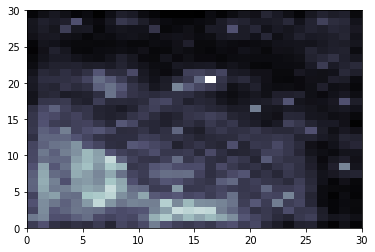

Still going... 300000


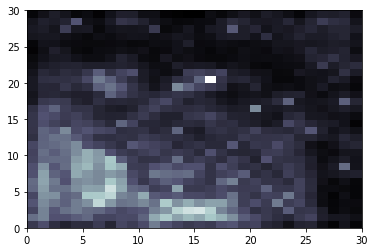

Still going... 400000
Previous decay:  0.06088033053977326
Updated decay:  0.02911667982336982
Previous decay:  0.12176066107954651
Updated decay:  0.05823335964673964
Cycle -  5  - Complete!!


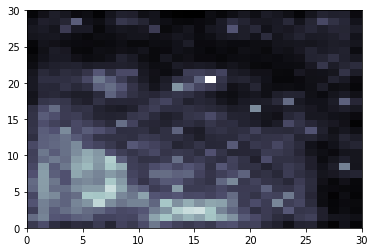

Still going... 0


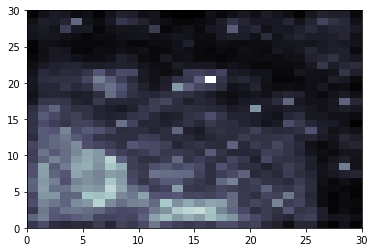

Still going... 100000


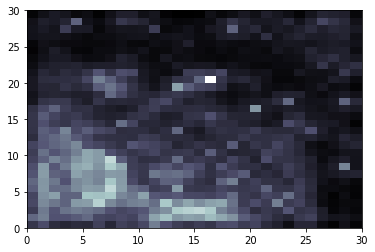

Still going... 200000


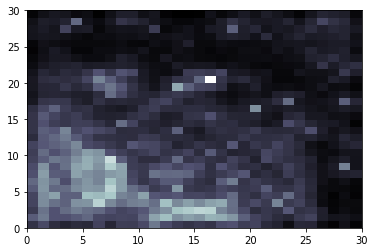

Still going... 300000


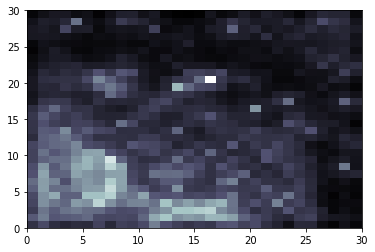

Still going... 400000
Previous decay:  0.02911667982336982
Updated decay:  0.012811339122282722
Previous decay:  0.05823335964673964
Updated decay:  0.025622678244565444
Cycle -  6  - Complete!!


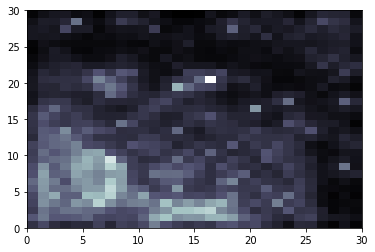

Still going... 0


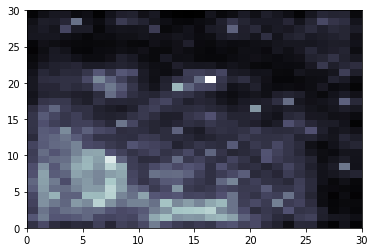

Still going... 100000


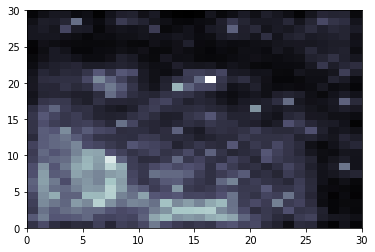

Still going... 200000


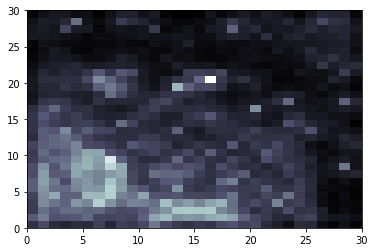

Still going... 300000


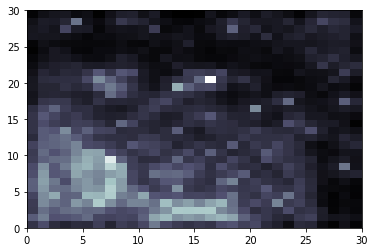

Still going... 400000
Previous decay:  0.012811339122282722
Updated decay:  0.005219434457226294
Previous decay:  0.025622678244565444
Updated decay:  0.010438868914452589
Cycle -  7  - Complete!!


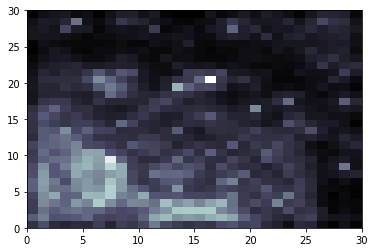

Still going... 0


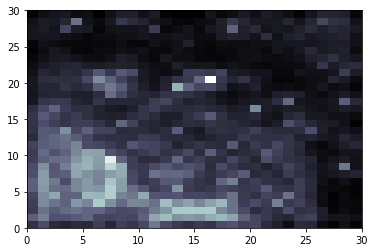

Still going... 100000


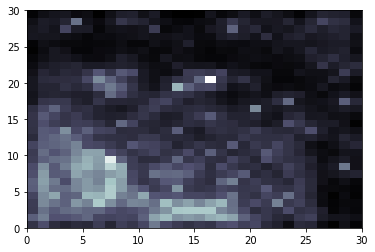

Still going... 200000


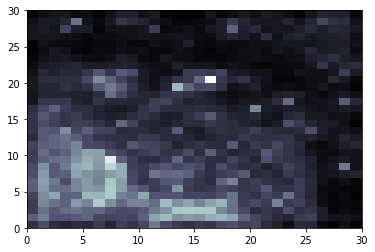

Still going... 300000


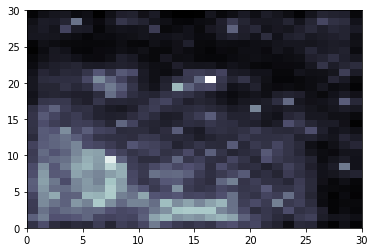

Still going... 400000
Previous decay:  0.005219434457226294
Updated decay:  0.0019797854837754906
Previous decay:  0.010438868914452589
Updated decay:  0.003959570967550981
Cycle -  8  - Complete!!


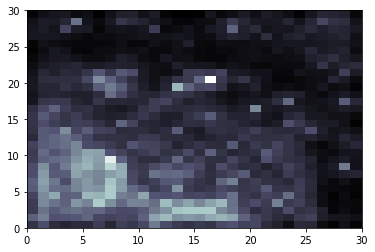

Still going... 0


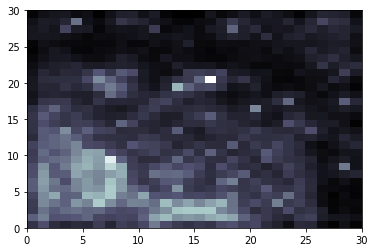

Still going... 100000


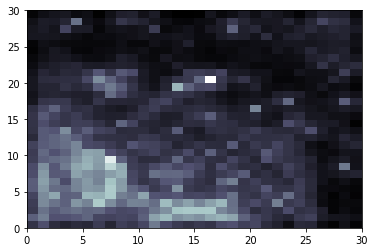

Still going... 200000


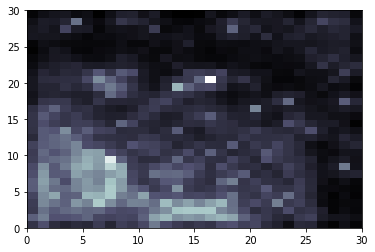

Still going... 300000


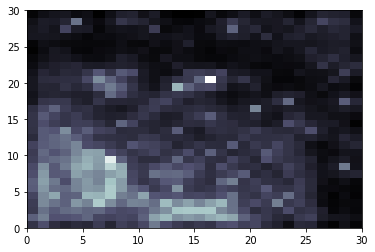

Still going... 400000
Previous decay:  0.0019797854837754906
Updated decay:  0.0007025045265009805
Previous decay:  0.003959570967550981
Updated decay:  0.001405009053001961
Cycle -  9  - Complete!!
Random Window Training Complete!

...ready!


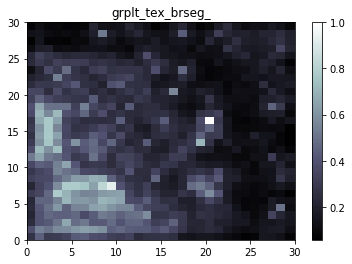

Mapping in progress... 1
Mapping in progress... 501
Mapping in progress... 1001
Mapping in progress... 1501
Mapping in progress... 2001
Mapping in progress... 2501
Mapping in progress... 3001
Mapping in progress... 3501
Mapping in progress... 4001
Mapping in progress... 4501
Mapping in progress... 5001
Mapping in progress... 5501
Mapping in progress... 6001
Mapping in progress... 6501
Mapping in progress... 7001
Mapping in progress... 7501
Mapping in progress... 8001
Mapping in progress... 8501
Mapping in progress... 9001
Mapping in progress... 9501
Mapping in progress... 10001
Mapping in progress... 10501
Mapping in progress... 11001
Mapping in progress... 11501
Mapping in progress... 12001
Mapping in progress... 12501
Mapping in progress... 13001
Mapping in progress... 13501
Mapping in progress... 14001
Mapping in progress... 14501
Mapping in progress... 15001
Mapping in progress... 15501
Mapping in progress... 16001
Mapping in progress... 16501
Mapping in progress... 17001
Mapping i

Mapping in progress... 140501
Mapping in progress... 141001
Mapping in progress... 141501
Mapping in progress... 142001
Mapping in progress... 142501
Mapping in progress... 143001
Mapping in progress... 143501
Mapping in progress... 144001
Mapping in progress... 144501
Mapping in progress... 145001
Mapping in progress... 145501
Mapping in progress... 146001
Mapping in progress... 146501
Mapping in progress... 147001
Mapping in progress... 147501
Mapping in progress... 148001
Mapping in progress... 148501
Mapping in progress... 149001
Mapping in progress... 149501
Mapping in progress... 150001
Mapping in progress... 150501
Mapping in progress... 151001
Mapping in progress... 151501
Mapping in progress... 152001
Mapping in progress... 152501
Mapping in progress... 153001
Mapping in progress... 153501
Mapping in progress... 154001
Mapping in progress... 154501
Mapping in progress... 155001
Mapping in progress... 155501
Mapping in progress... 156001
Mapping in progress... 156501
Mapping in

Mapping in progress... 277501
Mapping in progress... 278001
Mapping in progress... 278501
Mapping in progress... 279001
Mapping in progress... 279501
Mapping in progress... 280001
Mapping in progress... 280501
Mapping in progress... 281001
Mapping in progress... 281501
Mapping in progress... 282001
Mapping in progress... 282501
Mapping in progress... 283001
Mapping in progress... 283501
Mapping in progress... 284001
Mapping in progress... 284501
Mapping in progress... 285001
Mapping in progress... 285501
Mapping in progress... 286001
Mapping in progress... 286501
Mapping in progress... 287001
Mapping in progress... 287501
Mapping in progress... 288001
Mapping in progress... 288501
Mapping in progress... 289001
Mapping in progress... 289501
Mapping in progress... 290001
Mapping in progress... 290501
Mapping in progress... 291001
Mapping in progress... 291501
Mapping in progress... 292001
Mapping in progress... 292501
Mapping in progress... 293001
Mapping in progress... 293501
Mapping in

Mapping in progress... 414501
Mapping in progress... 415001
Mapping in progress... 415501
Mapping in progress... 416001
Mapping in progress... 416501
Mapping in progress... 417001
Mapping in progress... 417501
Mapping in progress... 418001
Mapping in progress... 418501
Mapping in progress... 419001
Mapping in progress... 419501
Mapping in progress... 420001
Mapping in progress... 420501
Mapping in progress... 421001
Mapping in progress... 421501
Mapping in progress... 422001
Mapping in progress... 422501
Mapping in progress... 423001
Mapping in progress... 423501
Mapping in progress... 424001
Mapping in progress... 424501
Mapping in progress... 425001
Mapping in progress... 425501
Mapping in progress... 426001
Mapping in progress... 426501
Mapping in progress... 427001
Mapping in progress... 427501
Mapping in progress... 428001
weights saved!!


In [34]:
nmu = all_rand(remap_data['mu_drsegn_re'], target, f_wts['mu_drsegn_re_init'][:30, :30, :], 10, 1.0, 0.5, True)

Som of size:  (30, 30, 35)  has been initialized
Training begins...


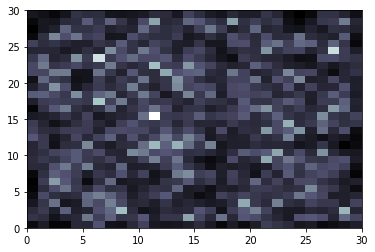

Still going... 0


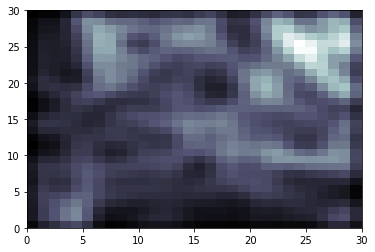

Still going... 100000


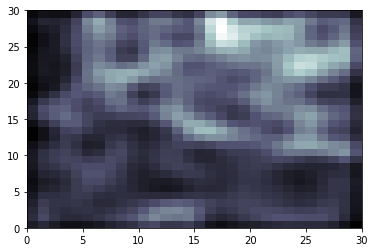

Still going... 200000


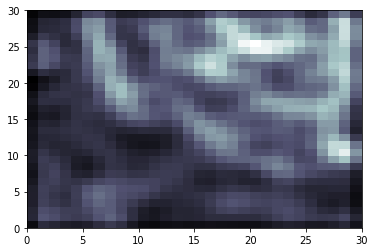

Still going... 300000


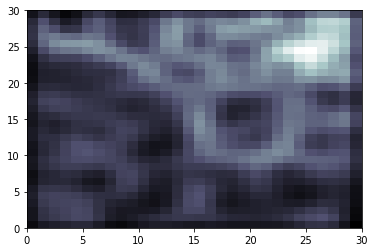

Still going... 400000
Previous decay:  0.5
Updated decay:  0.4230769230769231
Previous decay:  1.0
Updated decay:  0.8461538461538461
Cycle -  0  - Complete!!


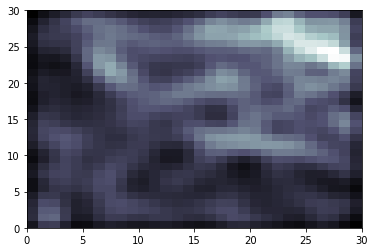

Still going... 0


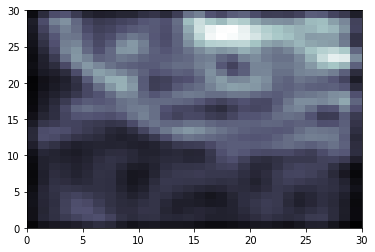

Still going... 100000


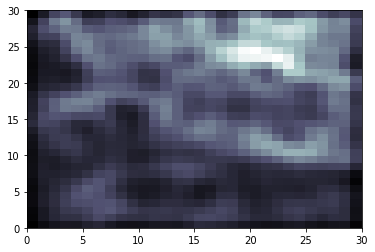

Still going... 200000


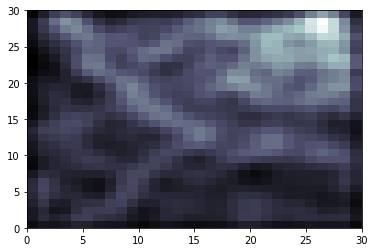

Still going... 300000


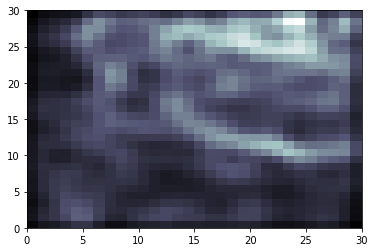

Still going... 400000
Previous decay:  0.4230769230769231
Updated decay:  0.3102564102564102
Previous decay:  0.8461538461538461
Updated decay:  0.6205128205128204
Cycle -  1  - Complete!!


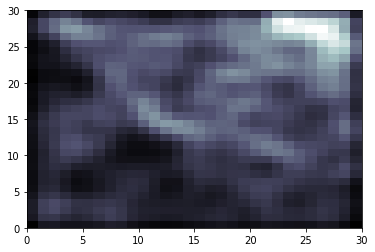

Still going... 0


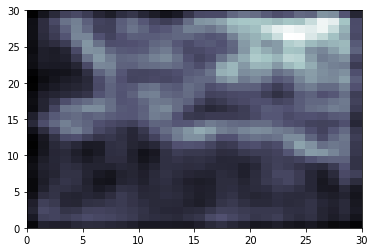

Still going... 100000


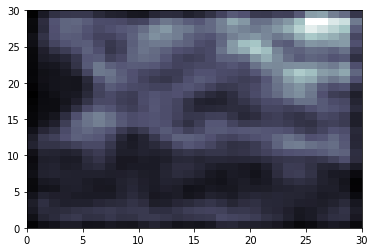

Still going... 200000


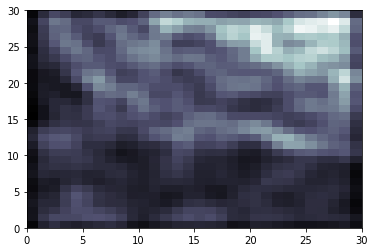

Still going... 300000


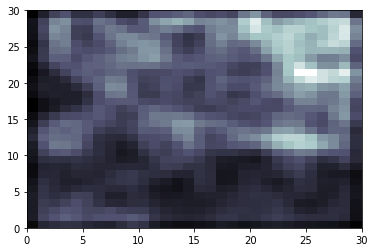

Still going... 400000
Previous decay:  0.3102564102564102
Updated decay:  0.20075414781297132
Previous decay:  0.6205128205128204
Updated decay:  0.40150829562594265
Cycle -  2  - Complete!!


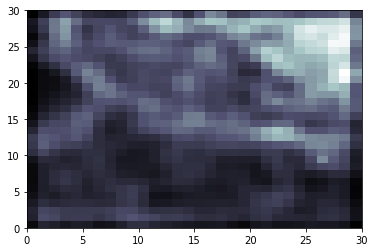

Still going... 0


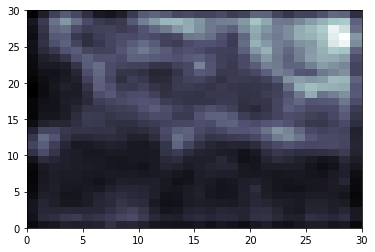

Still going... 100000


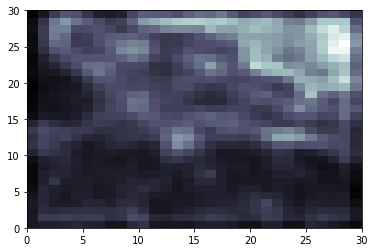

Still going... 200000


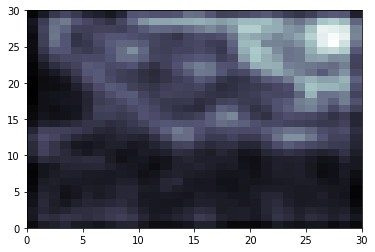

Still going... 300000


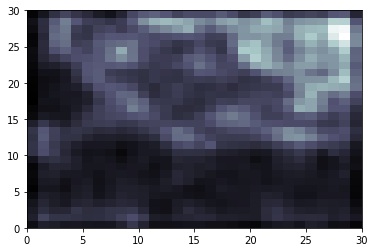

Still going... 400000
Previous decay:  0.20075414781297132
Updated decay:  0.11622608557593077
Previous decay:  0.40150829562594265
Updated decay:  0.23245217115186154
Cycle -  3  - Complete!!


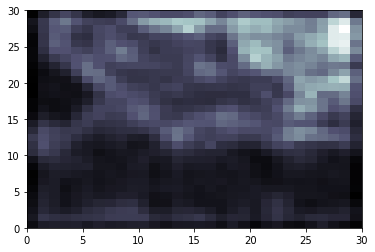

Still going... 0


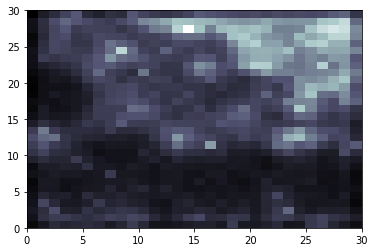

Still going... 100000


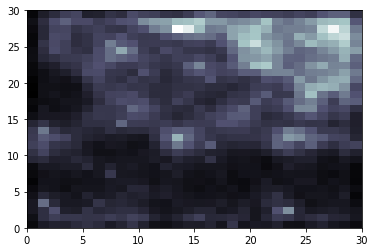

Still going... 200000


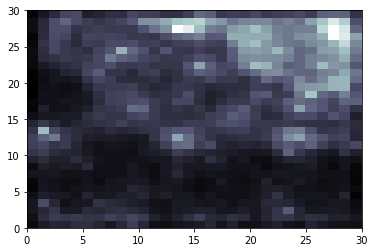

Still going... 300000


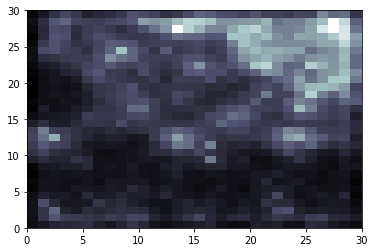

Still going... 400000
Previous decay:  0.11622608557593077
Updated decay:  0.06088033053977326
Previous decay:  0.23245217115186154
Updated decay:  0.12176066107954651
Cycle -  4  - Complete!!


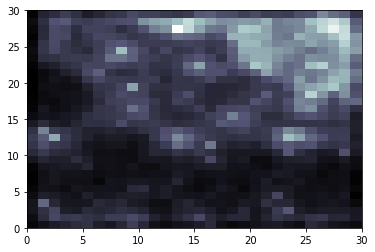

Still going... 0


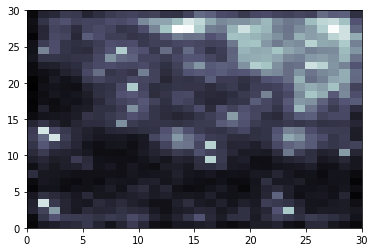

Still going... 100000


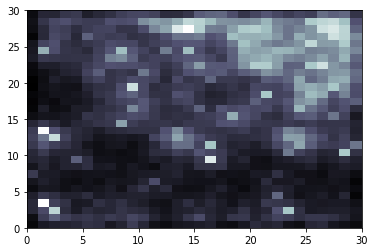

Still going... 200000


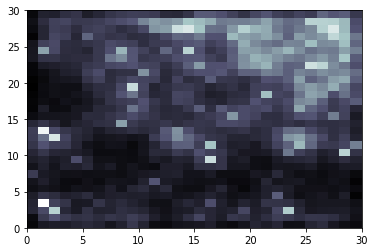

Still going... 300000


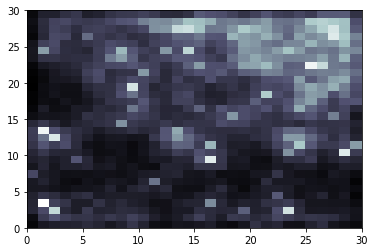

Still going... 400000
Previous decay:  0.06088033053977326
Updated decay:  0.02911667982336982
Previous decay:  0.12176066107954651
Updated decay:  0.05823335964673964
Cycle -  5  - Complete!!


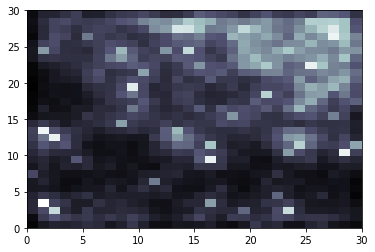

Still going... 0


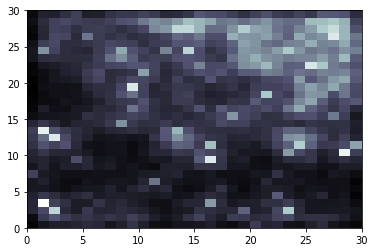

Still going... 100000


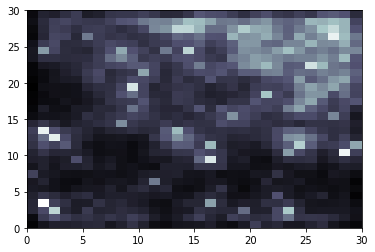

Still going... 200000


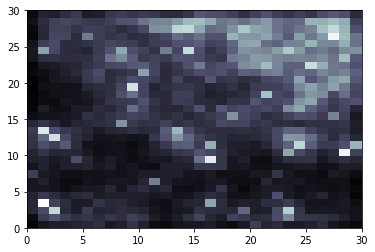

Still going... 300000


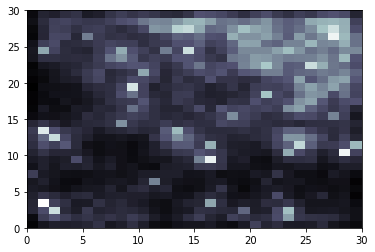

Still going... 400000
Previous decay:  0.02911667982336982
Updated decay:  0.012811339122282722
Previous decay:  0.05823335964673964
Updated decay:  0.025622678244565444
Cycle -  6  - Complete!!


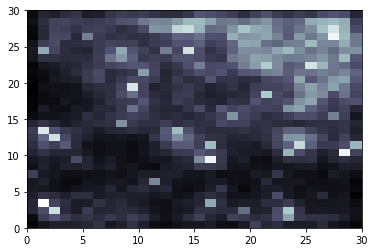

Still going... 0


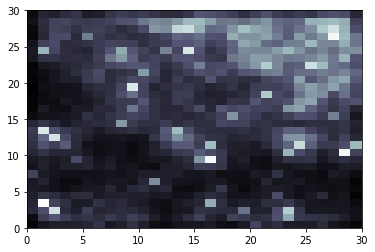

Still going... 100000


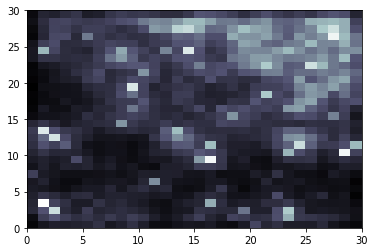

Still going... 200000


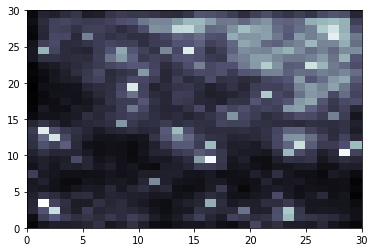

Still going... 300000


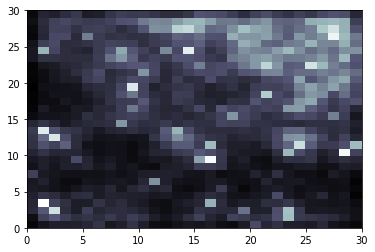

Still going... 400000
Previous decay:  0.012811339122282722
Updated decay:  0.005219434457226294
Previous decay:  0.025622678244565444
Updated decay:  0.010438868914452589
Cycle -  7  - Complete!!


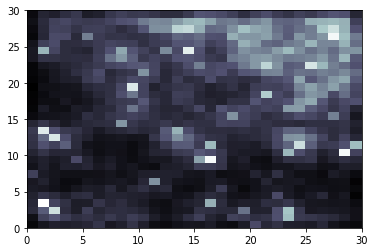

Still going... 0


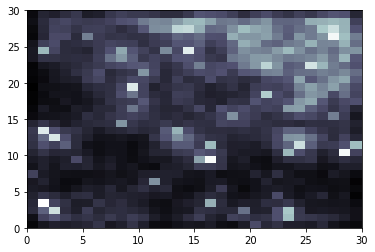

Still going... 100000


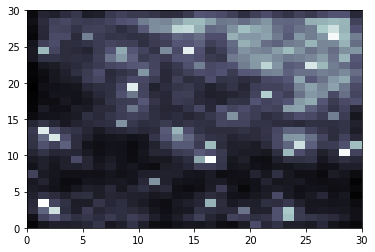

Still going... 200000


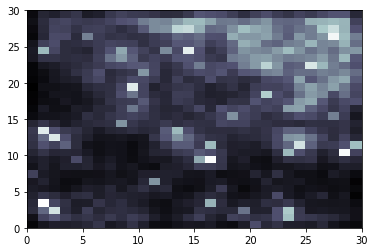

Still going... 300000


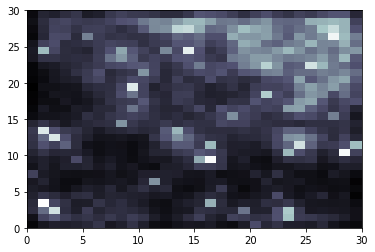

Still going... 400000
Previous decay:  0.005219434457226294
Updated decay:  0.0019797854837754906
Previous decay:  0.010438868914452589
Updated decay:  0.003959570967550981
Cycle -  8  - Complete!!


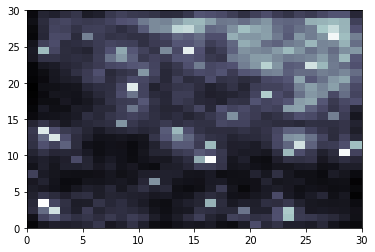

Still going... 0


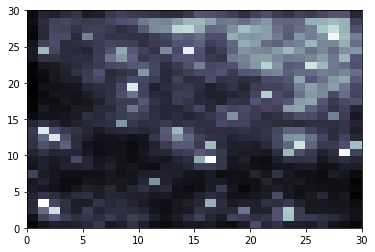

Still going... 100000


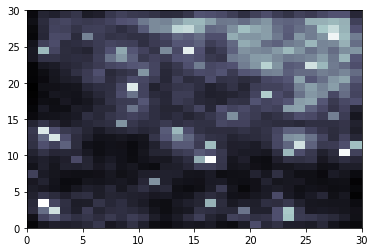

Still going... 200000


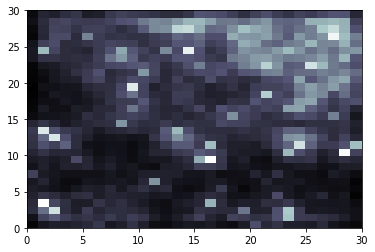

Still going... 300000


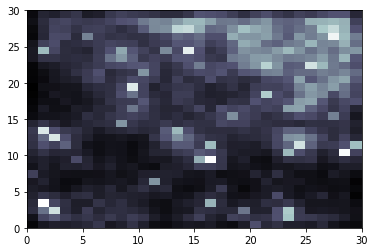

Still going... 400000
Previous decay:  0.0019797854837754906
Updated decay:  0.0007025045265009805
Previous decay:  0.003959570967550981
Updated decay:  0.001405009053001961
Cycle -  9  - Complete!!
Random Window Training Complete!

...ready!


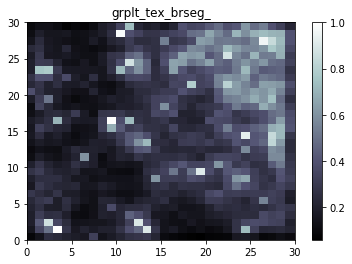

Mapping in progress... 1
Mapping in progress... 501
Mapping in progress... 1001
Mapping in progress... 1501
Mapping in progress... 2001
Mapping in progress... 2501
Mapping in progress... 3001
Mapping in progress... 3501
Mapping in progress... 4001
Mapping in progress... 4501
Mapping in progress... 5001
Mapping in progress... 5501
Mapping in progress... 6001
Mapping in progress... 6501
Mapping in progress... 7001
Mapping in progress... 7501
Mapping in progress... 8001
Mapping in progress... 8501
Mapping in progress... 9001
Mapping in progress... 9501
Mapping in progress... 10001
Mapping in progress... 10501
Mapping in progress... 11001
Mapping in progress... 11501
Mapping in progress... 12001
Mapping in progress... 12501
Mapping in progress... 13001
Mapping in progress... 13501
Mapping in progress... 14001
Mapping in progress... 14501
Mapping in progress... 15001
Mapping in progress... 15501
Mapping in progress... 16001
Mapping in progress... 16501
Mapping in progress... 17001
Mapping i

Mapping in progress... 140501
Mapping in progress... 141001
Mapping in progress... 141501
Mapping in progress... 142001
Mapping in progress... 142501
Mapping in progress... 143001
Mapping in progress... 143501
Mapping in progress... 144001
Mapping in progress... 144501
Mapping in progress... 145001
Mapping in progress... 145501
Mapping in progress... 146001
Mapping in progress... 146501
Mapping in progress... 147001
Mapping in progress... 147501
Mapping in progress... 148001
Mapping in progress... 148501
Mapping in progress... 149001
Mapping in progress... 149501
Mapping in progress... 150001
Mapping in progress... 150501
Mapping in progress... 151001
Mapping in progress... 151501
Mapping in progress... 152001
Mapping in progress... 152501
Mapping in progress... 153001
Mapping in progress... 153501
Mapping in progress... 154001
Mapping in progress... 154501
Mapping in progress... 155001
Mapping in progress... 155501
Mapping in progress... 156001
Mapping in progress... 156501
Mapping in

Mapping in progress... 277501
Mapping in progress... 278001
Mapping in progress... 278501
Mapping in progress... 279001
Mapping in progress... 279501
Mapping in progress... 280001
Mapping in progress... 280501
Mapping in progress... 281001
Mapping in progress... 281501
Mapping in progress... 282001
Mapping in progress... 282501
Mapping in progress... 283001
Mapping in progress... 283501
Mapping in progress... 284001
Mapping in progress... 284501
Mapping in progress... 285001
Mapping in progress... 285501
Mapping in progress... 286001
Mapping in progress... 286501
Mapping in progress... 287001
Mapping in progress... 287501
Mapping in progress... 288001
Mapping in progress... 288501
Mapping in progress... 289001
Mapping in progress... 289501
Mapping in progress... 290001
Mapping in progress... 290501
Mapping in progress... 291001
Mapping in progress... 291501
Mapping in progress... 292001
Mapping in progress... 292501
Mapping in progress... 293001
Mapping in progress... 293501
Mapping in

Mapping in progress... 414501
Mapping in progress... 415001
Mapping in progress... 415501
Mapping in progress... 416001
Mapping in progress... 416501
Mapping in progress... 417001
Mapping in progress... 417501
Mapping in progress... 418001
Mapping in progress... 418501
Mapping in progress... 419001
Mapping in progress... 419501
Mapping in progress... 420001
Mapping in progress... 420501
Mapping in progress... 421001
Mapping in progress... 421501
Mapping in progress... 422001
Mapping in progress... 422501
Mapping in progress... 423001
Mapping in progress... 423501
Mapping in progress... 424001
Mapping in progress... 424501
Mapping in progress... 425001
Mapping in progress... 425501
Mapping in progress... 426001
Mapping in progress... 426501
Mapping in progress... 427001
Mapping in progress... 427501
Mapping in progress... 428001
Mapping in progress... 428501
Mapping in progress... 429001
Mapping in progress... 429501
Mapping in progress... 430001
Mapping in progress... 430501
Mapping in

In [37]:
nte = all_rand(remap_data['te_drsegn_re'], target, f_wts['te_drsegn_re_init'][:30, :30, :], 10, 1.0, 0.5, True)

Som of size:  (40, 40, 35)  has been initialized
Training begins...


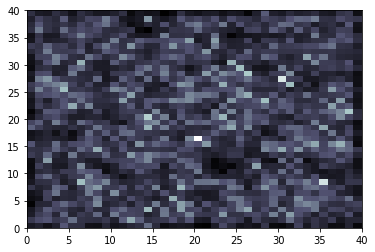

Still going... 0


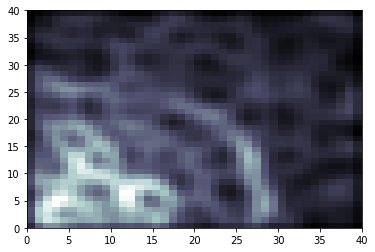

Still going... 100000


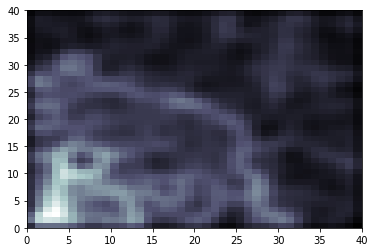

Still going... 200000


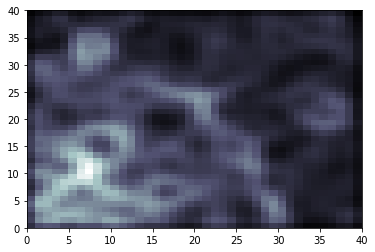

Still going... 300000


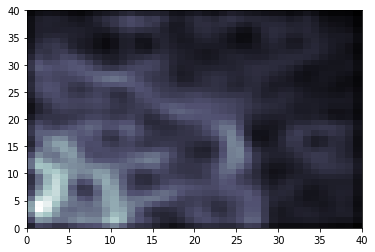

Still going... 400000


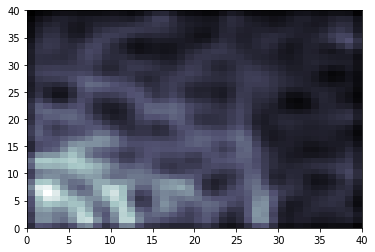

Still going... 500000


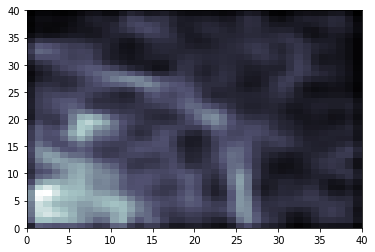

Still going... 600000


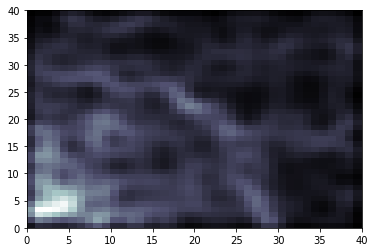

Still going... 700000


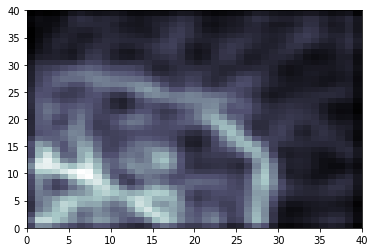

Still going... 800000


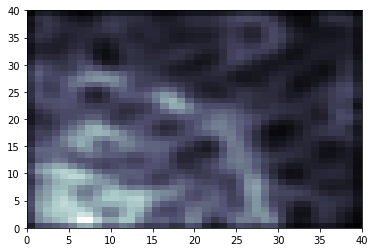

Still going... 900000


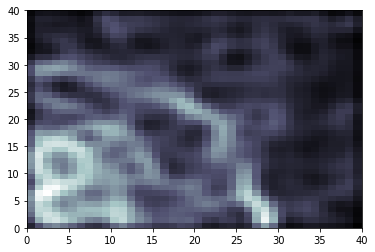

Still going... 1000000


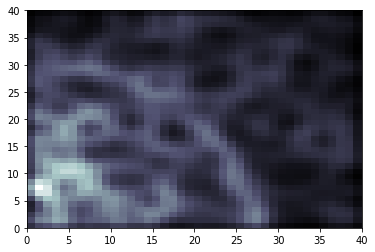

Still going... 1100000


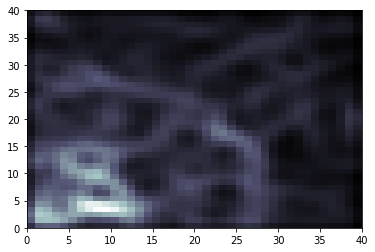

Still going... 1200000
Previous decay:  0.5
Updated decay:  0.40909090909090906
Previous decay:  1.0
Updated decay:  0.8181818181818181
Cycle -  0  - Complete!!


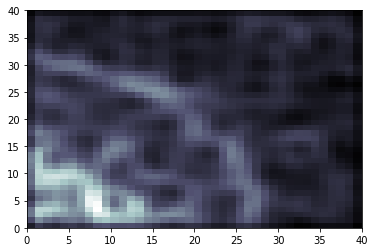

Still going... 0


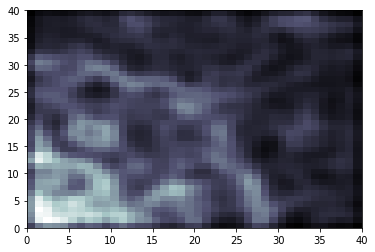

Still going... 100000


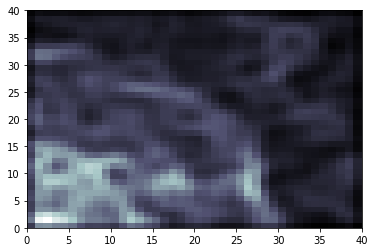

Still going... 200000


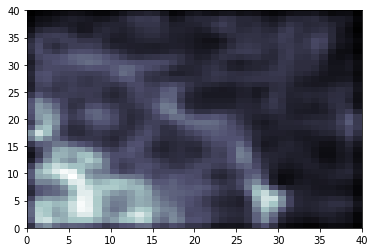

Still going... 300000


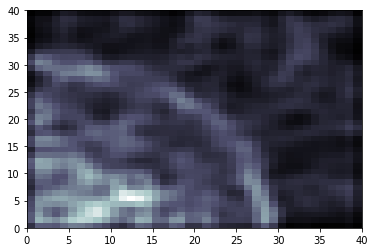

Still going... 400000


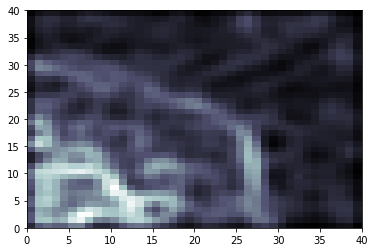

Still going... 500000


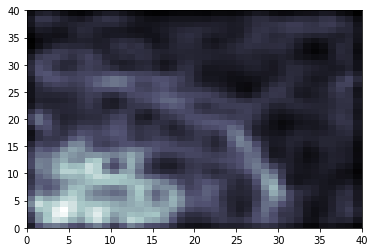

Still going... 600000


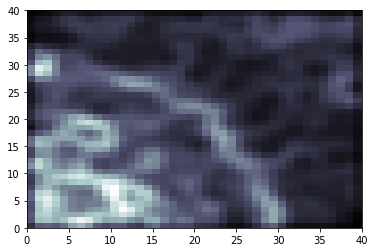

Still going... 700000


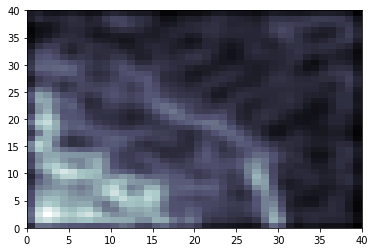

Still going... 800000


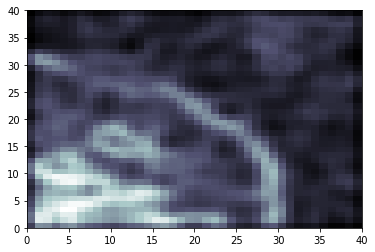

Still going... 900000


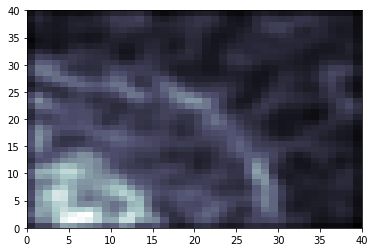

Still going... 1000000


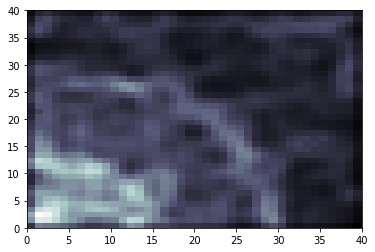

Still going... 1100000


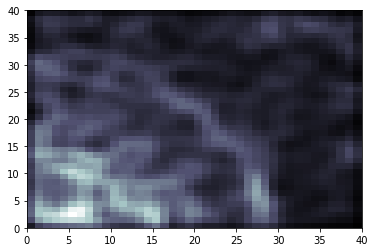

Still going... 1200000
Previous decay:  0.40909090909090906
Updated decay:  0.2832167832167832
Previous decay:  0.8181818181818181
Updated decay:  0.5664335664335663
Cycle -  1  - Complete!!


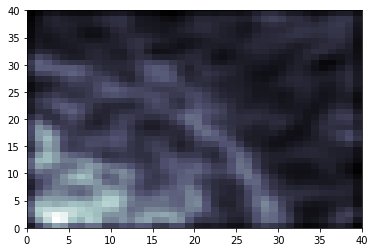

Still going... 0


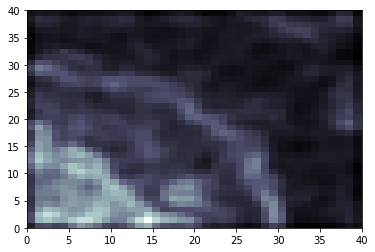

Still going... 100000


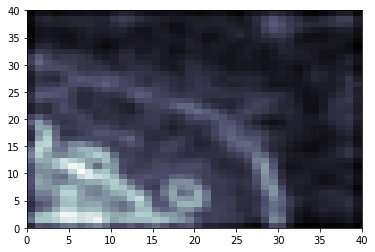

Still going... 200000


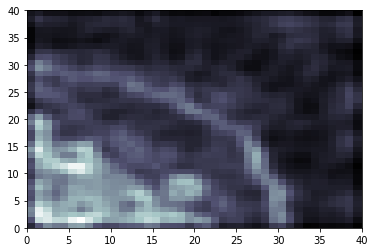

Still going... 300000


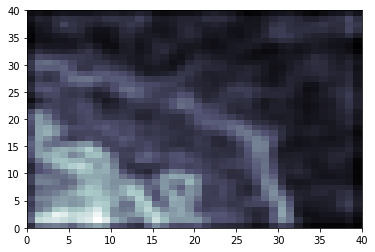

Still going... 400000


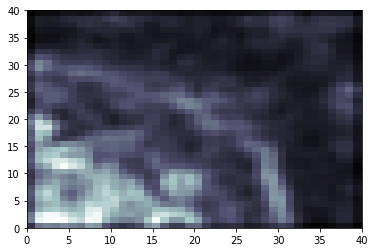

Still going... 500000


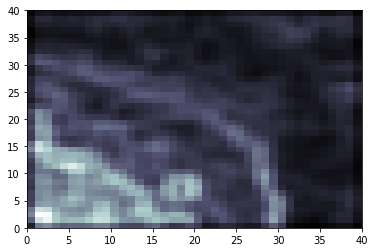

Still going... 600000


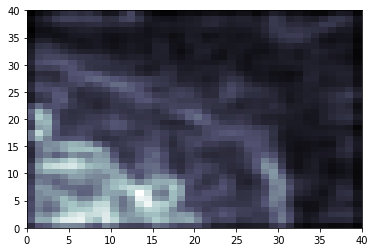

Still going... 700000


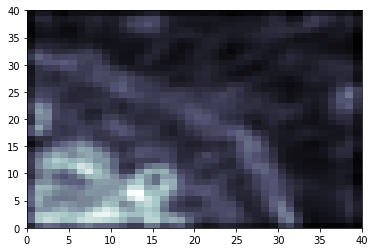

Still going... 800000


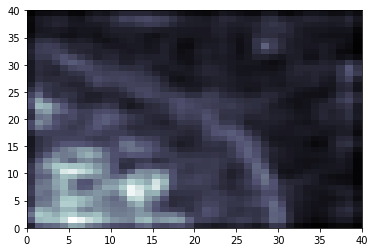

Still going... 900000


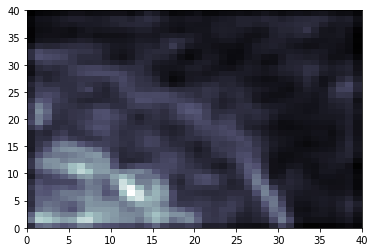

Still going... 1000000


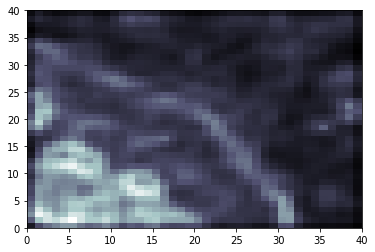

Still going... 1100000


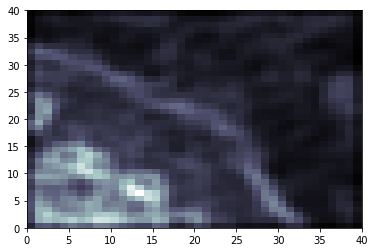

Still going... 1200000
Previous decay:  0.2832167832167832
Updated decay:  0.16993006993006993
Previous decay:  0.5664335664335663
Updated decay:  0.33986013986013985
Cycle -  2  - Complete!!


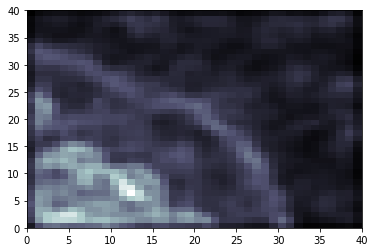

Still going... 0


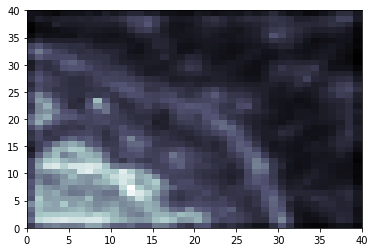

Still going... 100000


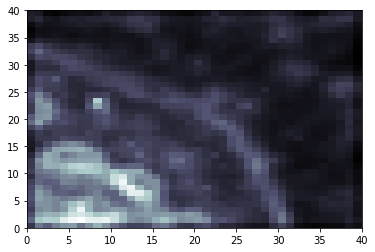

Still going... 200000


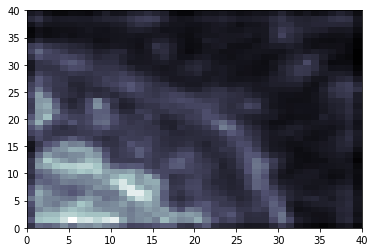

Still going... 300000


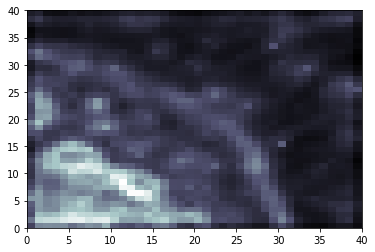

Still going... 400000


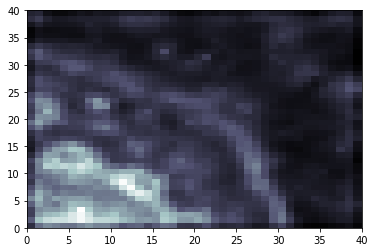

Still going... 500000


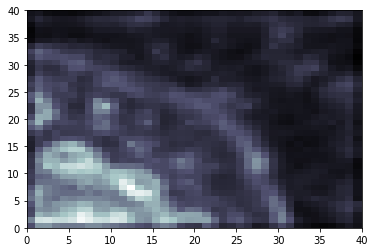

Still going... 600000


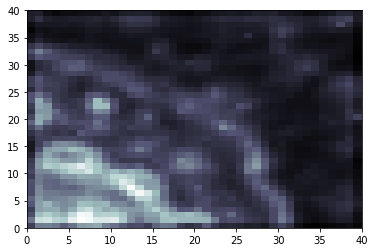

Still going... 700000


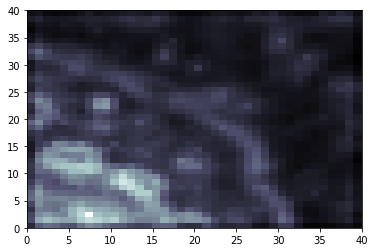

Still going... 800000


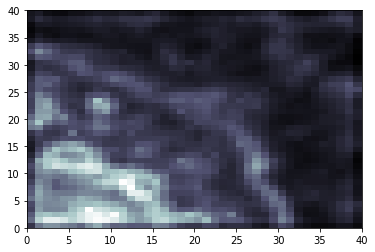

Still going... 900000


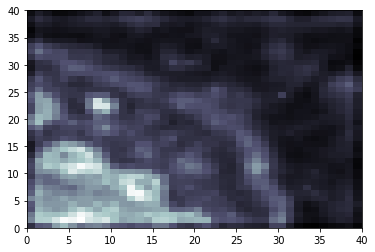

Still going... 1000000


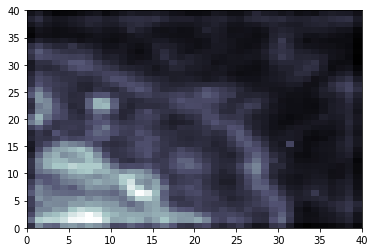

Still going... 1100000


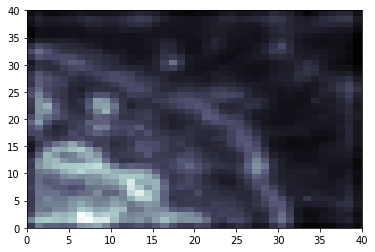

Still going... 1200000
Previous decay:  0.16993006993006993
Updated decay:  0.08996297819827231
Previous decay:  0.33986013986013985
Updated decay:  0.17992595639654463
Cycle -  3  - Complete!!


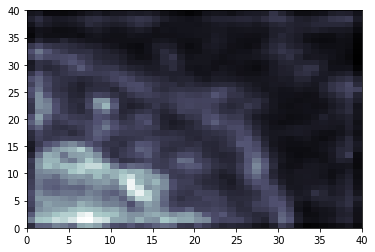

Still going... 0


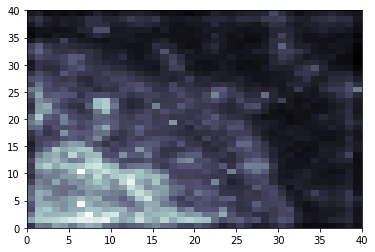

Still going... 100000


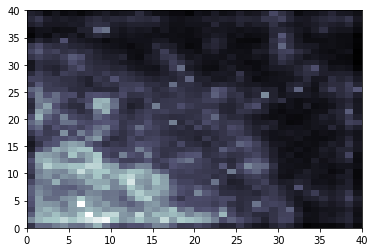

Still going... 200000


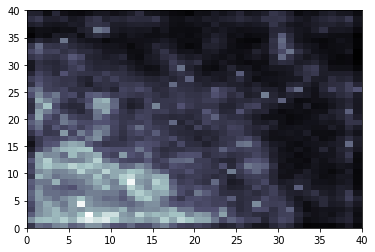

Still going... 300000


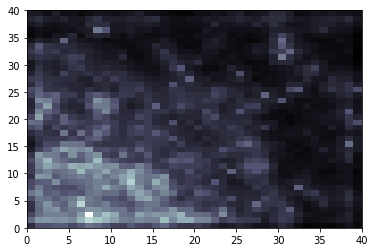

Still going... 400000


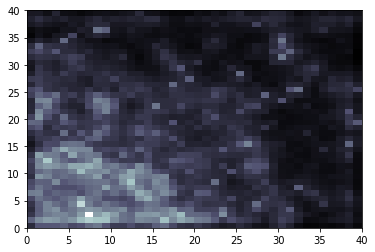

Still going... 500000


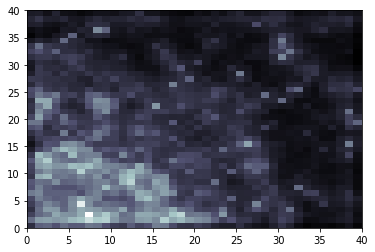

Still going... 600000


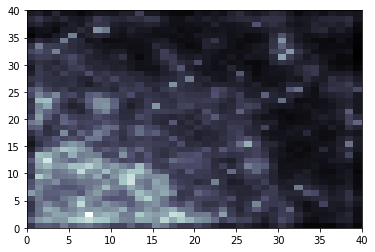

Still going... 700000


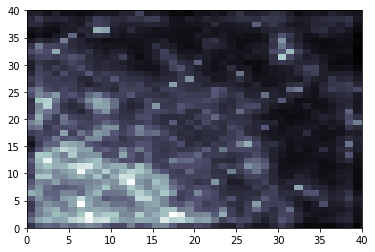

Still going... 800000


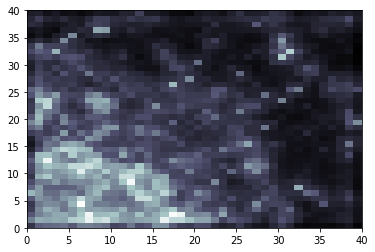

Still going... 900000


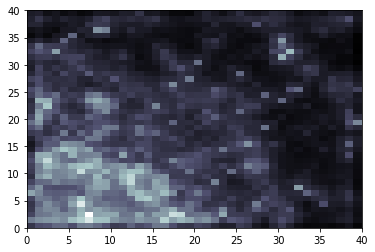

Still going... 1000000


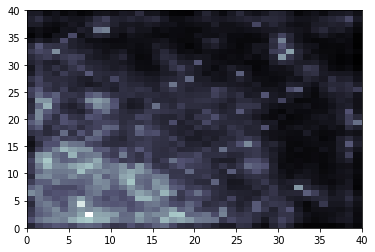

Still going... 1100000


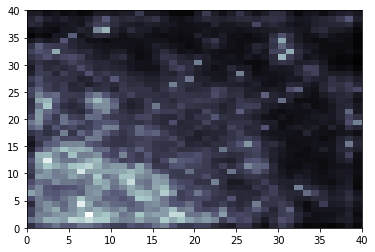

Still going... 1200000
Previous decay:  0.08996297819827231
Updated decay:  0.04261404230444478
Previous decay:  0.17992595639654463
Updated decay:  0.08522808460888956
Cycle -  4  - Complete!!


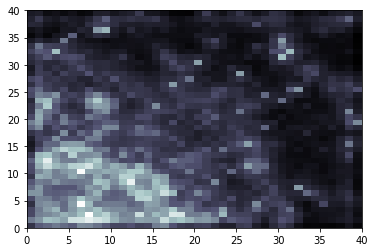

Still going... 0


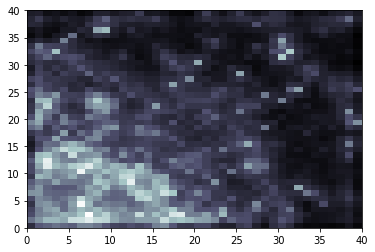

Still going... 100000


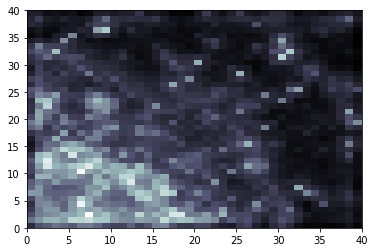

Still going... 200000


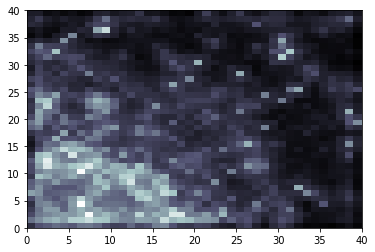

Still going... 300000


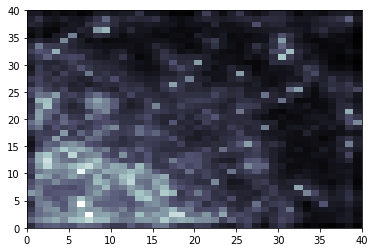

Still going... 400000


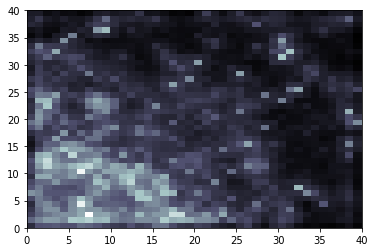

Still going... 500000


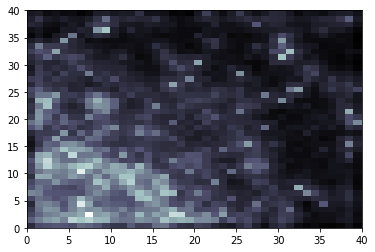

Still going... 600000


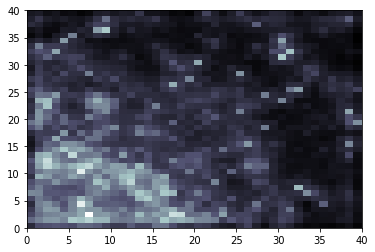

Still going... 700000


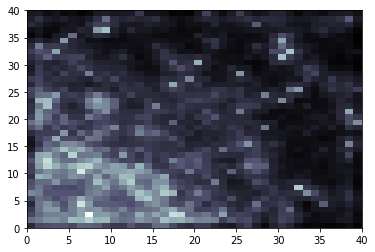

Still going... 800000


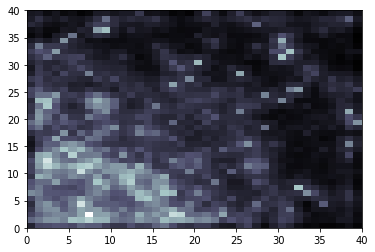

Still going... 900000


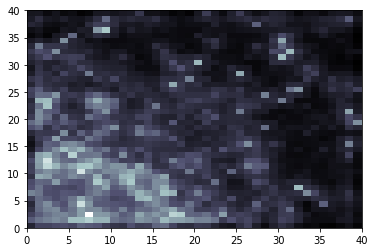

Still going... 1000000


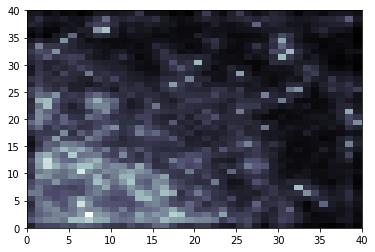

Still going... 1100000


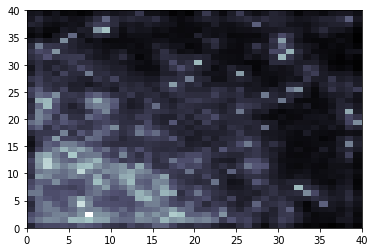

Still going... 1200000
Previous decay:  0.04261404230444478
Updated decay:  0.018263160987619195
Previous decay:  0.08522808460888956
Updated decay:  0.03652632197523839
Cycle -  5  - Complete!!


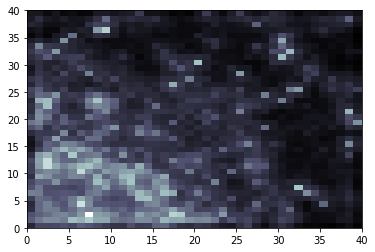

Still going... 0


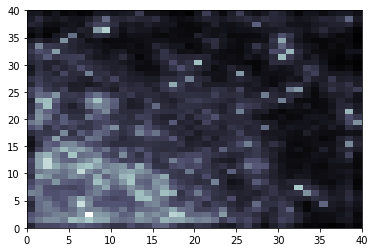

Still going... 100000


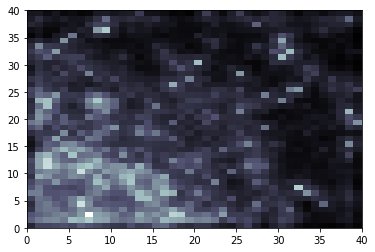

Still going... 200000


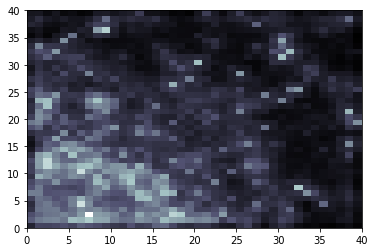

Still going... 300000


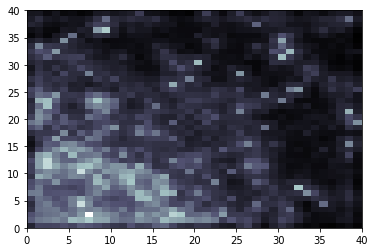

Still going... 400000


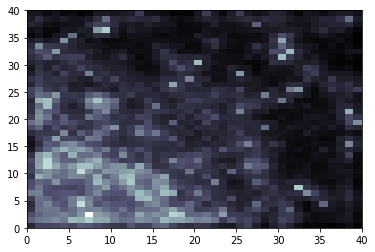

Still going... 500000


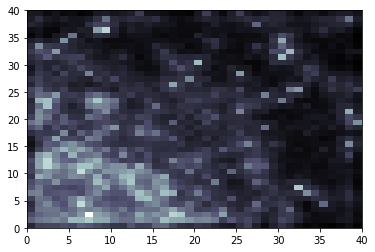

Still going... 600000


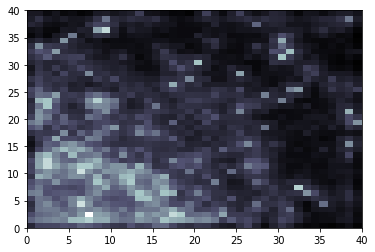

Still going... 700000


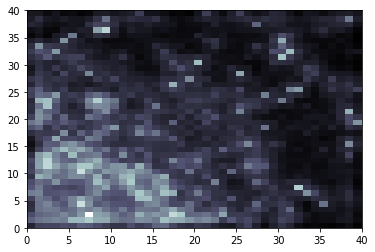

Still going... 800000


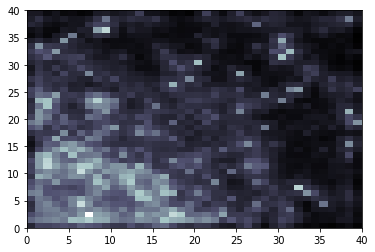

Still going... 900000


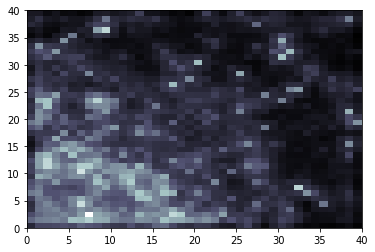

Still going... 1000000


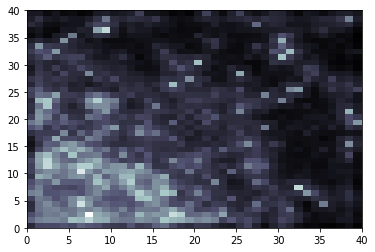

Still going... 1100000


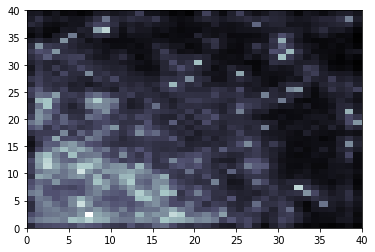

Still going... 1200000
Previous decay:  0.018263160987619195
Updated decay:  0.007146454299503164
Previous decay:  0.03652632197523839
Updated decay:  0.014292908599006327
Cycle -  6  - Complete!!


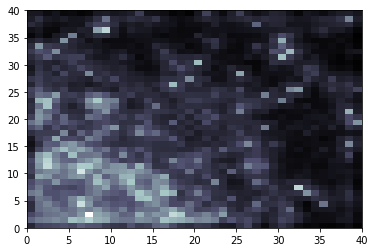

Still going... 0


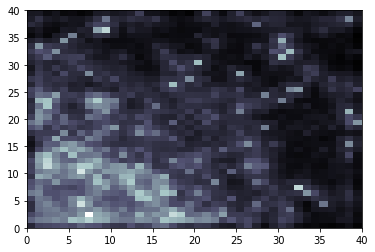

Still going... 100000


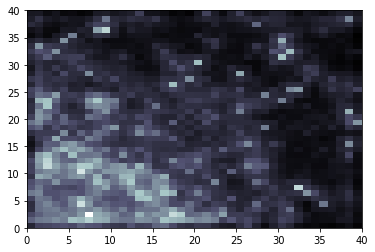

Still going... 200000


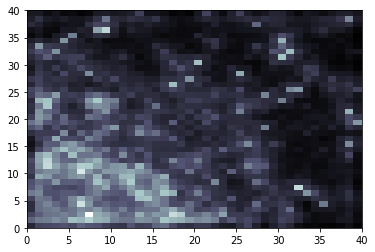

Still going... 300000


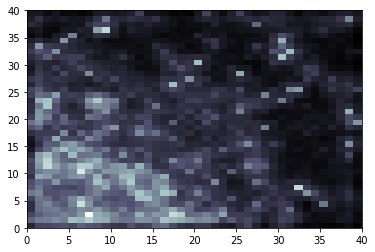

Still going... 400000


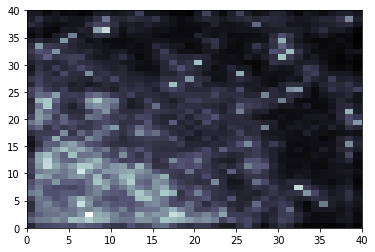

Still going... 500000


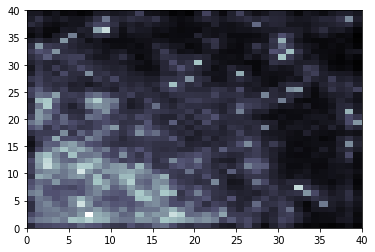

Still going... 600000


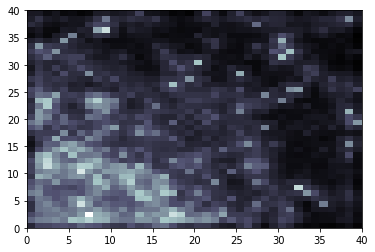

Still going... 700000


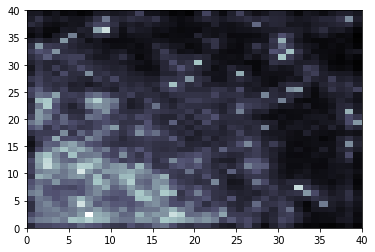

Still going... 800000


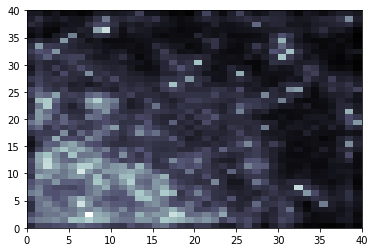

Still going... 900000


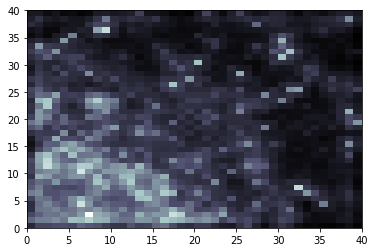

Still going... 1000000


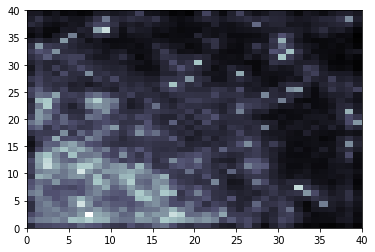

Still going... 1100000


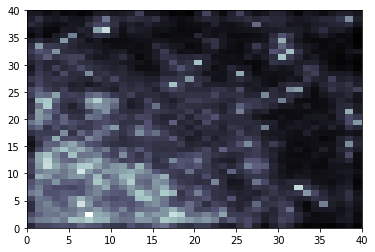

Still going... 1200000
Previous decay:  0.007146454299503164
Updated decay:  0.002572723547821139
Previous decay:  0.014292908599006327
Updated decay:  0.005145447095642278
Cycle -  7  - Complete!!
Random Window Training Complete!

...ready!


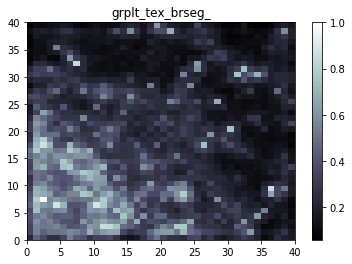

Mapping in progress... 1
Mapping in progress... 501
Mapping in progress... 1001
Mapping in progress... 1501
Mapping in progress... 2001
Mapping in progress... 2501
Mapping in progress... 3001
Mapping in progress... 3501
Mapping in progress... 4001
Mapping in progress... 4501
Mapping in progress... 5001
Mapping in progress... 5501
Mapping in progress... 6001
Mapping in progress... 6501
Mapping in progress... 7001
Mapping in progress... 7501
Mapping in progress... 8001
Mapping in progress... 8501
Mapping in progress... 9001
Mapping in progress... 9501
Mapping in progress... 10001
Mapping in progress... 10501
Mapping in progress... 11001
Mapping in progress... 11501
Mapping in progress... 12001
Mapping in progress... 12501
Mapping in progress... 13001
Mapping in progress... 13501
Mapping in progress... 14001
Mapping in progress... 14501
Mapping in progress... 15001
Mapping in progress... 15501
Mapping in progress... 16001
Mapping in progress... 16501
Mapping in progress... 17001
Mapping i

Mapping in progress... 140501
Mapping in progress... 141001
Mapping in progress... 141501
Mapping in progress... 142001
Mapping in progress... 142501
Mapping in progress... 143001
Mapping in progress... 143501
Mapping in progress... 144001
Mapping in progress... 144501
Mapping in progress... 145001
Mapping in progress... 145501
Mapping in progress... 146001
Mapping in progress... 146501
Mapping in progress... 147001
Mapping in progress... 147501
Mapping in progress... 148001
Mapping in progress... 148501
Mapping in progress... 149001
Mapping in progress... 149501
Mapping in progress... 150001
Mapping in progress... 150501
Mapping in progress... 151001
Mapping in progress... 151501
Mapping in progress... 152001
Mapping in progress... 152501
Mapping in progress... 153001
Mapping in progress... 153501
Mapping in progress... 154001
Mapping in progress... 154501
Mapping in progress... 155001
Mapping in progress... 155501
Mapping in progress... 156001
Mapping in progress... 156501
Mapping in

Mapping in progress... 277501
Mapping in progress... 278001
Mapping in progress... 278501
Mapping in progress... 279001
Mapping in progress... 279501
Mapping in progress... 280001
Mapping in progress... 280501
Mapping in progress... 281001
Mapping in progress... 281501
Mapping in progress... 282001
Mapping in progress... 282501
Mapping in progress... 283001
Mapping in progress... 283501
Mapping in progress... 284001
Mapping in progress... 284501
Mapping in progress... 285001
Mapping in progress... 285501
Mapping in progress... 286001
Mapping in progress... 286501
Mapping in progress... 287001
Mapping in progress... 287501
Mapping in progress... 288001
Mapping in progress... 288501
Mapping in progress... 289001
Mapping in progress... 289501
Mapping in progress... 290001
Mapping in progress... 290501
Mapping in progress... 291001
Mapping in progress... 291501
Mapping in progress... 292001
Mapping in progress... 292501
Mapping in progress... 293001
Mapping in progress... 293501
Mapping in

Mapping in progress... 414501
Mapping in progress... 415001
Mapping in progress... 415501
Mapping in progress... 416001
Mapping in progress... 416501
Mapping in progress... 417001
Mapping in progress... 417501
Mapping in progress... 418001
Mapping in progress... 418501
Mapping in progress... 419001
Mapping in progress... 419501
Mapping in progress... 420001
Mapping in progress... 420501
Mapping in progress... 421001
Mapping in progress... 421501
Mapping in progress... 422001
Mapping in progress... 422501
Mapping in progress... 423001
Mapping in progress... 423501
Mapping in progress... 424001
Mapping in progress... 424501
Mapping in progress... 425001
Mapping in progress... 425501
Mapping in progress... 426001
Mapping in progress... 426501
Mapping in progress... 427001
Mapping in progress... 427501
Mapping in progress... 428001
Mapping in progress... 428501
Mapping in progress... 429001
Mapping in progress... 429501
Mapping in progress... 430001
Mapping in progress... 430501
Mapping in

Mapping in progress... 551501
Mapping in progress... 552001
Mapping in progress... 552501
Mapping in progress... 553001
Mapping in progress... 553501
Mapping in progress... 554001
Mapping in progress... 554501
Mapping in progress... 555001
Mapping in progress... 555501
Mapping in progress... 556001
Mapping in progress... 556501
Mapping in progress... 557001
Mapping in progress... 557501
Mapping in progress... 558001
Mapping in progress... 558501
Mapping in progress... 559001
Mapping in progress... 559501
Mapping in progress... 560001
Mapping in progress... 560501
Mapping in progress... 561001
Mapping in progress... 561501
Mapping in progress... 562001
Mapping in progress... 562501
Mapping in progress... 563001
Mapping in progress... 563501
Mapping in progress... 564001
Mapping in progress... 564501
Mapping in progress... 565001
Mapping in progress... 565501
Mapping in progress... 566001
Mapping in progress... 566501
Mapping in progress... 567001
Mapping in progress... 567501
Mapping in

Mapping in progress... 688501
Mapping in progress... 689001
Mapping in progress... 689501
Mapping in progress... 690001
Mapping in progress... 690501
Mapping in progress... 691001
Mapping in progress... 691501
Mapping in progress... 692001
Mapping in progress... 692501
Mapping in progress... 693001
Mapping in progress... 693501
Mapping in progress... 694001
Mapping in progress... 694501
Mapping in progress... 695001
Mapping in progress... 695501
Mapping in progress... 696001
Mapping in progress... 696501
Mapping in progress... 697001
Mapping in progress... 697501
Mapping in progress... 698001
Mapping in progress... 698501
Mapping in progress... 699001
Mapping in progress... 699501
Mapping in progress... 700001
Mapping in progress... 700501
Mapping in progress... 701001
Mapping in progress... 701501
Mapping in progress... 702001
Mapping in progress... 702501
Mapping in progress... 703001
Mapping in progress... 703501
Mapping in progress... 704001
Mapping in progress... 704501
Mapping in

Mapping in progress... 825501
Mapping in progress... 826001
Mapping in progress... 826501
Mapping in progress... 827001
Mapping in progress... 827501
Mapping in progress... 828001
Mapping in progress... 828501
Mapping in progress... 829001
Mapping in progress... 829501
Mapping in progress... 830001
Mapping in progress... 830501
Mapping in progress... 831001
Mapping in progress... 831501
Mapping in progress... 832001
Mapping in progress... 832501
Mapping in progress... 833001
Mapping in progress... 833501
Mapping in progress... 834001
Mapping in progress... 834501
Mapping in progress... 835001
Mapping in progress... 835501
Mapping in progress... 836001
Mapping in progress... 836501
Mapping in progress... 837001
Mapping in progress... 837501
Mapping in progress... 838001
Mapping in progress... 838501
Mapping in progress... 839001
Mapping in progress... 839501
Mapping in progress... 840001
Mapping in progress... 840501
Mapping in progress... 841001
Mapping in progress... 841501
Mapping in

Mapping in progress... 962501
Mapping in progress... 963001
Mapping in progress... 963501
Mapping in progress... 964001
Mapping in progress... 964501
Mapping in progress... 965001
Mapping in progress... 965501
Mapping in progress... 966001
Mapping in progress... 966501
Mapping in progress... 967001
Mapping in progress... 967501
Mapping in progress... 968001
Mapping in progress... 968501
Mapping in progress... 969001
Mapping in progress... 969501
Mapping in progress... 970001
Mapping in progress... 970501
Mapping in progress... 971001
Mapping in progress... 971501
Mapping in progress... 972001
Mapping in progress... 972501
Mapping in progress... 973001
Mapping in progress... 973501
Mapping in progress... 974001
Mapping in progress... 974501
Mapping in progress... 975001
Mapping in progress... 975501
Mapping in progress... 976001
Mapping in progress... 976501
Mapping in progress... 977001
Mapping in progress... 977501
Mapping in progress... 978001
Mapping in progress... 978501
Mapping in

Mapping in progress... 1096001
Mapping in progress... 1096501
Mapping in progress... 1097001
Mapping in progress... 1097501
Mapping in progress... 1098001
Mapping in progress... 1098501
Mapping in progress... 1099001
Mapping in progress... 1099501
Mapping in progress... 1100001
Mapping in progress... 1100501
Mapping in progress... 1101001
Mapping in progress... 1101501
Mapping in progress... 1102001
Mapping in progress... 1102501
Mapping in progress... 1103001
Mapping in progress... 1103501
Mapping in progress... 1104001
Mapping in progress... 1104501
Mapping in progress... 1105001
Mapping in progress... 1105501
Mapping in progress... 1106001
Mapping in progress... 1106501
Mapping in progress... 1107001
Mapping in progress... 1107501
Mapping in progress... 1108001
Mapping in progress... 1108501
Mapping in progress... 1109001
Mapping in progress... 1109501
Mapping in progress... 1110001
Mapping in progress... 1110501
Mapping in progress... 1111001
Mapping in progress... 1111501
Mapping 

Mapping in progress... 1228501
Mapping in progress... 1229001
Mapping in progress... 1229501
Mapping in progress... 1230001
Mapping in progress... 1230501
Mapping in progress... 1231001
Mapping in progress... 1231501
Mapping in progress... 1232001
Mapping in progress... 1232501
Mapping in progress... 1233001
Mapping in progress... 1233501
Mapping in progress... 1234001
Mapping in progress... 1234501
Mapping in progress... 1235001
Mapping in progress... 1235501
Mapping in progress... 1236001
Mapping in progress... 1236501
Mapping in progress... 1237001
Mapping in progress... 1237501
Mapping in progress... 1238001
Mapping in progress... 1238501
Mapping in progress... 1239001
Mapping in progress... 1239501
Mapping in progress... 1240001
Mapping in progress... 1240501
Mapping in progress... 1241001
Mapping in progress... 1241501
Mapping in progress... 1242001
Mapping in progress... 1242501
Mapping in progress... 1243001
Mapping in progress... 1243501
Mapping in progress... 1244001
Mapping 

In [68]:
nal = all_rand(remap_data['al_drsegn_re'], target, f_wts['al_drsegn_re_init'][:40, :40, :], 8, 1.0, 0.5, True)

# Looking into the map...

In [41]:
tar_li = list(target)
lis = len(set(tar_li))

In [42]:
# examine how well the SOM generalizes
def examine(ob):
    flid = [0] * lis
    for i in ob.keys():
        #print(i, " --> ", nind[i])
        print(len(ob[i]))

        lid = [0] * lis
        print(i, " --> ")
        for v in ob[i]:
            la = target[v]
            lid[la] = lid[la] + 1
        print(lid)
        print(max(lid))
        for x in range(len(lid)):
            if lid[x] == max(lid):
                flid[x] = flid[x] + 1
                print("Max label....", x)
                print("updated...", flid)
                break
        print("*****************************************************\n\n\n\n")

In [54]:
examine(nhf)

958
(0, 16)  --> 
[302, 118, 529, 9, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
529
Max label.... 2
updated... [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




165
(5, 14)  --> 
[15, 11, 28, 12, 23, 31, 21, 14, 7, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
31
Max label.... 5
updated... [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




259
(1, 15)  --> 
[147, 26, 81, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
147
Max label.... 0
updated... [1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

[2, 22, 107, 2, 74, 48, 12, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
107
Max label.... 2
updated... [9, 3, 9, 0, 2, 9, 2, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




254
(3, 13)  --> 
[11, 78, 33, 67, 25, 21, 16, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
78
Max label.... 1
updated... [9, 4, 9, 0, 2, 9, 2, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




299
(3, 18)  --> 
[29, 167, 39, 64, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
167
Max label.... 1
updated... [9, 5, 9, 0, 2, 9, 2, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
************

[4, 36, 39, 156, 55, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
156
Max label.... 3
updated... [22, 10, 11, 1, 2, 10, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




419
(7, 21)  --> 
[2, 333, 84, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
333
Max label.... 1
updated... [22, 11, 11, 1, 2, 10, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




285
(4, 22)  --> 
[259, 26, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
259
Max label.... 0
updated... [23, 11, 11, 1, 2, 10, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
******

[0, 0, 3, 5, 75, 133, 160, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
160
Max label.... 6
updated... [26, 21, 17, 7, 4, 16, 6, 3, 2, 3, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




640
(2, 20)  --> 
[0, 0, 13, 195, 281, 148, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
281
Max label.... 4
updated... [26, 21, 17, 7, 5, 16, 6, 3, 2, 3, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




224
(5, 17)  --> 
[0, 0, 9, 6, 43, 79, 58, 29, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
79
Max label.... 5
updated... [26, 21, 17, 7, 5, 17, 6, 3, 2, 3, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*

554
(10, 1)  --> 
[0, 0, 0, 4, 19, 73, 301, 146, 11, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
301
Max label.... 6
updated... [26, 21, 19, 13, 13, 21, 8, 4, 2, 3, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




279
(6, 10)  --> 
[0, 0, 0, 0, 11, 6, 39, 64, 55, 41, 49, 11, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
64
Max label.... 7
updated... [26, 21, 19, 13, 13, 21, 8, 5, 2, 3, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




397
(1, 20)  --> 
[0, 0, 0, 0, 44, 124, 146, 72, 11, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
146
Max label.... 6
updated... [26, 21, 19, 13, 13, 21, 9, 5, 2, 3, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

*****************************************************




1108
(9, 26)  --> 
[0, 0, 0, 0, 0, 0, 806, 302, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
806
Max label.... 6
updated... [26, 21, 19, 13, 17, 31, 24, 14, 5, 6, 2, 3, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




711
(8, 28)  --> 
[0, 0, 0, 0, 0, 0, 22, 547, 142, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
547
Max label.... 7
updated... [26, 21, 19, 13, 17, 31, 24, 15, 5, 6, 2, 3, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




632
(6, 29)  --> 
[0, 0, 0, 0, 0, 0, 24, 543, 65, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
543
Max label.... 7
updated... [26, 21, 19, 13, 17, 31, 24, 16, 5, 6, 2, 3,

[0, 0, 0, 0, 0, 0, 0, 49, 378, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
378
Max label.... 8
updated... [26, 21, 19, 13, 17, 31, 24, 26, 14, 11, 4, 3, 2, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




535
(3, 29)  --> 
[0, 0, 0, 0, 0, 0, 0, 115, 420, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
420
Max label.... 8
updated... [26, 21, 19, 13, 17, 31, 24, 26, 15, 11, 4, 3, 2, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




7
(8, 27)  --> 
[0, 0, 0, 0, 0, 0, 0, 3, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
4
Max label.... 8
updated... [26, 21, 19, 13, 17, 31, 24, 26, 16, 11, 4, 3, 2, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

[0, 0, 0, 0, 0, 0, 0, 0, 103, 240, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
240
Max label.... 9
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 27, 8, 6, 5, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




60
(9, 8)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 41, 5, 0, 10, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
41
Max label.... 15
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 27, 8, 6, 5, 1, 1, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




124
(5, 1)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 10, 11, 6, 14, 18, 12, 13, 9, 11, 9, 3, 5, 0, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
18
Max label.... 12
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 27, 8, 6, 6, 1, 1, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 17, 15, 10, 2, 1, 4, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




586
(13, 26)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 189, 397, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
397
Max label.... 11
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 17, 16, 10, 2, 1, 4, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




944
(15, 27)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 421, 523, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
523
Max label.... 11
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 17, 17, 10, 2, 1, 4, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




91
(11, 21)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 22, 47, 22, 

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 30, 18, 5, 119, 13, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
119
Max label.... 14
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 25, 17, 8, 6, 7, 1, 3, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




25
(15, 17)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 0, 1, 1, 1, 1, 1, 5, 2, 1, 1, 1, 1, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
5
Max label.... 21
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 25, 17, 8, 6, 7, 1, 3, 1, 2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




760
(14, 24)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 377, 338, 45, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
377
Max label.... 11
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 17, 8, 6, 7, 1, 3, 1, 2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 12, 8, 10, 10, 6, 14, 11, 9, 14, 10, 10, 6, 5, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
14
Max label.... 19
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 21, 17, 11, 6, 4, 2, 3, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




284
(11, 17)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 81, 87, 99, 0, 17, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
99
Max label.... 15
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 21, 17, 12, 6, 4, 2, 3, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




491
(11, 13)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 14, 122, 192, 62, 97, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
192
Max label.... 15
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 21, 17, 13, 6, 4, 2, 3, 0, 1, 0, 0, 0, 0, 0

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 9, 627, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
627
Max label.... 16
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 18, 11, 6, 5, 1, 4, 0, 2, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




283
(21, 26)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 258, 24, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
258
Max label.... 16
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 19, 11, 6, 5, 1, 4, 0, 2, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




783
(21, 23)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 607, 176, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
607
Max label.... 16
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 20, 11, 6, 5, 1, 4, 0, 2, 1, 0, 0, 

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 123, 104, 192, 95, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
192
Max label.... 19
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 20, 13, 7, 3, 4, 0, 2, 3, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




344
(13, 8)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 73, 100, 147, 16, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
147
Max label.... 20
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 20, 13, 7, 4, 4, 0, 2, 3, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




355
(5, 7)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 72, 26, 32, 97, 14, 41, 69, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
97
Max label.... 21
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 20, 13, 7, 4, 5, 0, 2,

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 13, 23, 59, 90, 84, 31, 23, 11, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
90
Max label.... 23
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 20, 11, 13, 4, 4, 5, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




538
(13, 9)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 315, 211, 10, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
315
Max label.... 21
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 20, 11, 14, 4, 4, 5, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




965
(19, 20)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 965, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
965
Max label.... 19
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 21, 11, 14,

936
(22, 20)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 912, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
912
Max label.... 22
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 22, 21, 28, 18, 9, 13, 1, 2, 3, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




598
(4, 6)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 11, 38, 45, 144, 122, 220, 11, 3, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
220
Max label.... 26
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 22, 21, 28, 18, 9, 13, 1, 3, 3, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




794
(14, 6)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 29, 104, 185, 378, 76, 22, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
378
Max label.... 24
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 44, 96, 264, 99, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
264
Max label.... 26
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 22, 21, 28, 18, 22, 28, 5, 9, 6, 1, 6, 0, 3, 2, 0, 0, 0, 1, 0, 0, 0]
*****************************************************




489
(25, 20)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 184, 305, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
305
Max label.... 25
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 22, 21, 28, 18, 22, 28, 6, 9, 6, 1, 6, 0, 3, 2, 0, 0, 0, 1, 0, 0, 0]
*****************************************************




293
(29, 28)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 89, 204, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
204
Max label.... 25
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 22, 21

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 66, 116, 127, 9, 45, 0, 0, 0, 0, 0, 0, 0, 0, 0]
127
Max label.... 28
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 22, 21, 28, 18, 22, 31, 15, 18, 13, 4, 11, 2, 7, 3, 0, 0, 0, 2, 0, 0, 0]
*****************************************************




125
(18, 4)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 9, 3, 11, 15, 10, 16, 20, 16, 11, 11, 0, 0, 0]
20
Max label.... 33
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 22, 21, 28, 18, 22, 31, 15, 18, 13, 4, 11, 2, 7, 3, 1, 0, 0, 2, 0, 0, 0]
*****************************************************




283
(17, 8)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 54, 13, 112, 43, 43, 15, 0, 0, 0, 0, 0, 0, 0]
112
Max label.... 29
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 2, 7, 28, 6, 80, 92, 0, 11, 0, 0, 0]
92
Max label.... 34
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 22, 21, 28, 18, 22, 31, 15, 25, 28, 18, 16, 6, 11, 3, 3, 2, 0, 3, 0, 0, 0]
*****************************************************




388
(23, 13)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 25, 363, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
363
Max label.... 28
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 22, 21, 28, 18, 22, 31, 15, 25, 28, 19, 16, 6, 11, 3, 3, 2, 0, 3, 0, 0, 0]
*****************************************************




762
(23, 14)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 42, 515, 205, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
515
Max label.... 28
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25,

updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 22, 21, 28, 18, 22, 31, 15, 25, 28, 21, 23, 25, 21, 8, 8, 3, 2, 10, 0, 0, 0]
*****************************************************




126
(26, 13)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 28, 94, 0, 0, 0, 0, 0, 0, 0]
94
Max label.... 32
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 22, 21, 28, 18, 22, 31, 15, 25, 28, 21, 23, 25, 21, 9, 8, 3, 2, 10, 0, 0, 0]
*****************************************************




1094
(26, 12)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 77, 803, 214, 0, 0, 0, 0, 0, 0, 0]
803
Max label.... 31
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 22, 21, 28, 18, 22, 31, 15, 25, 28, 21, 23, 25, 22, 9, 8, 3, 2, 10, 0, 0, 0]
*****************************************************




73

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 325, 699, 42, 0, 0, 0, 0, 0]
699
Max label.... 33
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 22, 21, 28, 18, 22, 31, 15, 25, 28, 21, 23, 25, 32, 17, 18, 9, 2, 16, 1, 0, 0]
*****************************************************




804
(28, 2)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 103, 690, 10, 0, 0, 0, 0]
690
Max label.... 34
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 22, 21, 28, 18, 22, 31, 15, 25, 28, 21, 23, 25, 32, 17, 18, 10, 2, 16, 1, 0, 0]
*****************************************************




768
(21, 4)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 333, 392, 41, 2, 0, 0, 0, 0]
392
Max label.... 33
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 354, 473, 46, 0, 0, 0]
473
Max label.... 35
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 22, 21, 28, 18, 22, 31, 15, 25, 28, 21, 23, 25, 32, 18, 23, 17, 5, 26, 1, 0, 0]
*****************************************************




180
(27, 3)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 18, 58, 98, 6, 0, 0]
98
Max label.... 36
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 22, 21, 28, 18, 22, 31, 15, 25, 28, 21, 23, 25, 32, 18, 23, 17, 5, 27, 1, 0, 0]
*****************************************************




497
(23, 6)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 49, 185, 263, 0, 0, 0]
263
Max label.... 36
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25

updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 22, 21, 28, 18, 22, 31, 15, 25, 28, 21, 23, 25, 32, 18, 23, 21, 17, 37, 4, 0, 0]
*****************************************************




147
(26, 9)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 145, 0, 0, 0]
145
Max label.... 36
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 22, 21, 28, 18, 22, 31, 15, 25, 28, 21, 23, 25, 32, 18, 23, 21, 17, 38, 4, 0, 0]
*****************************************************




698
(24, 3)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 376, 322, 0, 0]
376
Max label.... 36
updated... [26, 21, 19, 13, 17, 31, 24, 27, 21, 31, 19, 26, 24, 23, 29, 25, 23, 25, 25, 22, 21, 28, 18, 22, 31, 15, 25, 28, 21, 23, 25, 32, 18, 23, 21, 17, 39, 4, 0, 0]
***************************************************

In [44]:
examine(nmu)

650
(13, 2)  --> 
[153, 186, 216, 95, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
216
Max label.... 2
updated... [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




344
(13, 0)  --> 
[69, 96, 55, 86, 37, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
96
Max label.... 1
updated... [0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




416
(12, 0)  --> 
[14, 66, 96, 59, 90, 45, 46, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
96
Max label.... 2
updated... [0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

updated... [15, 8, 8, 2, 2, 0, 2, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




161
(6, 1)  --> 
[15, 1, 7, 17, 10, 24, 16, 11, 21, 33, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
33
Max label.... 9
updated... [15, 8, 8, 2, 2, 0, 2, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




231
(9, 2)  --> 
[42, 17, 21, 50, 26, 32, 18, 15, 7, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
50
Max label.... 3
updated... [15, 8, 8, 3, 2, 0, 2, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




237
(10, 3)  --> 
[82, 31, 48, 41, 30, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

[0, 28, 1513, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
1513
Max label.... 2
updated... [18, 14, 15, 4, 9, 2, 3, 3, 1, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




1459
(28, 3)  --> 
[0, 75, 1384, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
1384
Max label.... 2
updated... [18, 14, 16, 4, 9, 2, 3, 3, 1, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




1173
(29, 4)  --> 
[0, 83, 1090, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
1090
Max label.... 2
updated... [18, 14, 17, 4, 9, 2, 3, 3, 1, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
***

[0, 0, 22, 334, 257, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
334
Max label.... 3
updated... [18, 26, 23, 11, 12, 6, 3, 3, 1, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




401
(22, 2)  --> 
[0, 0, 21, 302, 78, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
302
Max label.... 3
updated... [18, 26, 23, 12, 12, 6, 3, 3, 1, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




586
(19, 2)  --> 
[0, 0, 145, 361, 80, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
361
Max label.... 3
updated... [18, 26, 23, 13, 12, 6, 3, 3, 1, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


[0, 0, 0, 0, 812, 10, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
812
Max label.... 4
updated... [18, 26, 23, 19, 23, 8, 5, 4, 1, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




458
(24, 4)  --> 
[0, 0, 0, 0, 456, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
456
Max label.... 4
updated... [18, 26, 23, 19, 24, 8, 5, 4, 1, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




971
(23, 5)  --> 
[0, 0, 0, 0, 58, 913, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
913
Max label.... 5
updated... [18, 26, 23, 19, 24, 9, 5, 4, 1, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
******

[0, 0, 0, 0, 0, 406, 15, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
406
Max label.... 5
updated... [18, 26, 23, 19, 25, 19, 14, 11, 4, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




75
(23, 8)  --> 
[0, 0, 0, 0, 0, 75, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
75
Max label.... 5
updated... [18, 26, 23, 19, 25, 20, 14, 11, 4, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




346
(22, 8)  --> 
[0, 0, 0, 0, 0, 2, 61, 234, 49, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
234
Max label.... 7
updated... [18, 26, 23, 19, 25, 20, 14, 12, 4, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

updated... [18, 26, 23, 19, 25, 20, 20, 30, 15, 9, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




258
(14, 8)  --> 
[0, 0, 0, 0, 0, 0, 0, 1, 4, 32, 0, 25, 65, 49, 31, 41, 5, 4, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
65
Max label.... 12
updated... [18, 26, 23, 19, 25, 20, 20, 30, 15, 9, 0, 0, 2, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




533
(15, 9)  --> 
[0, 0, 0, 0, 0, 0, 0, 29, 104, 44, 28, 328, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
328
Max label.... 11
updated... [18, 26, 23, 19, 25, 20, 20, 30, 15, 9, 0, 1, 2, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




505
(16, 6)  --> 
[0, 0, 0, 0, 0, 0, 0, 350, 155, 0, 0, 0, 0, 0, 0, 0, 

[0, 0, 0, 0, 0, 0, 0, 0, 348, 355, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
355
Max label.... 9
updated... [18, 26, 23, 19, 25, 20, 20, 33, 22, 15, 5, 4, 4, 2, 0, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




278
(23, 12)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 105, 101, 72, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
105
Max label.... 8
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 15, 5, 4, 4, 2, 0, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




700
(13, 9)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 11, 61, 111, 279, 167, 71, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
279
Max label.... 11
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 15, 5, 5, 4, 2, 0, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

(27, 13)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 507, 785, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
785
Max label.... 10
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 15, 11, 6, 4, 2, 1, 0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




1285
(24, 12)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 341, 944, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
944
Max label.... 10
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 16, 11, 6, 4, 2, 1, 0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




723
(29, 13)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 243, 467, 13, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
467
Max label.... 10
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 17, 11, 6, 4, 2, 1, 0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 19, 13, 0, 111, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
111
Max label.... 15
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 13, 9, 4, 4, 2, 1, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




69
(15, 16)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 4, 11, 3, 7, 2, 9, 0, 21, 3, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
21
Max label.... 20
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 13, 9, 4, 4, 2, 1, 4, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




278
(7, 3)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 11, 31, 83, 71, 67, 10, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
83
Max label.... 13
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 13, 10, 4, 4, 2, 1, 4, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 74, 331, 247, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
331
Max label.... 14
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 22, 10, 13, 2, 7, 6, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




348
(17, 14)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 29, 106, 163, 50, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
163
Max label.... 15
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 22, 10, 14, 2, 7, 6, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




691
(18, 12)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 676, 15, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
676
Max label.... 13
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 23, 10, 14, 2, 7, 6, 1, 1, 0, 0, 0, 0, 0, 0, 0

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 41, 189, 227, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
227
Max label.... 17
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 16, 15, 8, 3, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




273
(17, 15)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 97, 146, 30, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
146
Max label.... 16
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 17, 15, 8, 3, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




510
(22, 17)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 101, 409, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
409
Max label.... 16
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 18, 15, 8, 3, 1, 0, 0, 0, 0, 0,

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 9, 177, 448, 181, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
448
Max label.... 19
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 17, 7, 6, 2, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




590
(6, 9)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 101, 178, 195, 79, 29, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
195
Max label.... 20
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 17, 7, 7, 2, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




303
(8, 12)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 75, 61, 114, 4, 38, 11, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
114
Max label.... 20
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 17, 7, 8, 2, 4, 2

updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 13, 13, 3, 5, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




801
(27, 24)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 114, 632, 55, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
632
Max label.... 19
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 14, 13, 3, 5, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




823
(22, 19)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 88, 733, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
733
Max label.... 19
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 15, 13, 3, 5, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




409
(21, 19)  --> 
[0, 0, 0, 0, 0, 0,

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 38, 37, 119, 55, 78, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
119
Max label.... 22
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 23, 5, 15, 4, 2, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




189
(4, 9)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 15, 18, 30, 32, 35, 25, 15, 8, 8, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0]
35
Max label.... 25
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 23, 5, 15, 4, 2, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




147
(7, 12)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 22, 61, 27, 22, 1, 14, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
61
Max label.... 21
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 23, 6, 

updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 26, 14, 33, 17, 9, 5, 2, 5, 1, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




1076
(21, 22)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 1069, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
1069
Max label.... 23
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 26, 14, 33, 18, 9, 5, 2, 5, 1, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




51
(14, 23)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 15, 11, 2, 2, 19, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
19
Max label.... 26
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 26, 14, 33, 18, 9, 5, 3, 5, 1, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




804
(16, 19)  --> 
[0, 0, 0, 0

Max label.... 36
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 26, 14, 33, 23, 20, 16, 11, 8, 1, 4, 3, 1, 0, 0, 0, 0, 5, 0, 0, 0]
*****************************************************




731
(8, 16)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 76, 71, 311, 245, 28, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
311
Max label.... 27
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 26, 14, 33, 23, 20, 16, 11, 9, 1, 4, 3, 1, 0, 0, 0, 0, 5, 0, 0, 0]
*****************************************************




93
(3, 14)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 10, 8, 8, 7, 7, 5, 7, 7, 3, 7, 14, 2, 0, 0]
14
Max label.... 36
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 26, 14, 33, 23, 20, 16, 11, 9, 1, 4, 3, 1, 0, 0, 0, 0, 6, 0, 0, 0]
*****************************************************




313
(

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 0, 4, 7, 11, 6, 2, 8, 2, 0, 0, 0, 0, 0]
11
Max label.... 30
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 26, 14, 33, 23, 20, 21, 22, 14, 3, 8, 6, 2, 0, 0, 0, 0, 7, 0, 0, 0]
*****************************************************




145
(3, 0)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 7, 16, 17, 13, 10, 19, 39, 11, 6, 2, 3, 0]
39
Max label.... 34
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 26, 14, 33, 23, 20, 21, 22, 14, 3, 8, 6, 2, 0, 0, 1, 0, 7, 0, 0, 0]
*****************************************************




148
(0, 1)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 6, 15, 25, 0, 64, 11, 22, 0, 0, 0, 0, 0]
64
Max label.... 32
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 26

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 337, 197, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
337
Max label.... 28
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 26, 14, 33, 23, 20, 21, 22, 19, 16, 20, 15, 10, 2, 2, 2, 0, 7, 0, 0, 0]
*****************************************************




423
(26, 28)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 308, 115, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
308
Max label.... 28
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 26, 14, 33, 23, 20, 21, 22, 19, 17, 20, 15, 10, 2, 2, 2, 0, 7, 0, 0, 0]
*****************************************************




405
(26, 29)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 276, 129, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
276
Max label.... 28
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 


612
(16, 26)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 10, 384, 194, 24, 0, 0, 0, 0, 0, 0]
384
Max label.... 31
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 26, 14, 33, 23, 20, 21, 22, 19, 18, 23, 24, 19, 10, 7, 9, 0, 11, 1, 0, 0]
*****************************************************




702
(22, 28)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 325, 222, 152, 3, 0, 0, 0, 0, 0, 0]
325
Max label.... 30
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 26, 14, 33, 23, 20, 21, 22, 19, 18, 23, 25, 19, 10, 7, 9, 0, 11, 1, 0, 0]
*****************************************************




367
(7, 18)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 50, 41, 176, 90, 10, 0, 0, 0, 0]
176
Max label.... 33
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16,

(0, 25)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 231, 91, 17, 0, 0, 0]
231
Max label.... 34
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 26, 14, 33, 23, 20, 21, 22, 19, 18, 23, 25, 23, 21, 18, 25, 9, 21, 1, 1, 1]
*****************************************************




372
(2, 2)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 50, 64, 87, 105, 46]
105
Max label.... 38
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 26, 14, 33, 23, 20, 21, 22, 19, 18, 23, 25, 23, 21, 18, 25, 9, 21, 1, 2, 1]
*****************************************************




212
(0, 21)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 35, 39, 57, 32, 46]
57
Max label.... 37
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19

(7, 28)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 109, 183, 20, 0]
183
Max label.... 37
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 26, 14, 33, 23, 20, 21, 22, 19, 18, 23, 25, 23, 21, 18, 28, 20, 48, 5, 6, 2]
*****************************************************




383
(3, 24)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 245, 136]
245
Max label.... 38
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 19, 23, 27, 19, 29, 20, 26, 24, 21, 26, 14, 33, 23, 20, 21, 22, 19, 18, 23, 25, 23, 21, 18, 28, 20, 48, 5, 7, 2]
*****************************************************




293
(2, 24)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 60, 145, 76, 12]
145
Max label.... 37
updated... [18, 26, 23, 19, 25, 20, 20, 33, 23, 16, 18, 

In [45]:
examine(nte)

407
(17, 27)  --> 
[342, 36, 29, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
342
Max label.... 0
updated... [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




219
(20, 27)  --> 
[33, 17, 45, 17, 39, 35, 28, 4, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
45
Max label.... 2
updated... [1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




412
(19, 26)  --> 
[164, 60, 31, 24, 85, 47, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
164
Max label.... 0
updated... [2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

[36, 270, 149, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
270
Max label.... 1
updated... [14, 5, 6, 3, 6, 1, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




84
(0, 26)  --> 
[9, 62, 5, 6, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
62
Max label.... 1
updated... [14, 6, 6, 3, 6, 1, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




44
(1, 23)  --> 
[2, 7, 1, 1, 1, 1, 2, 2, 5, 2, 1, 2, 1, 1, 2, 5, 2, 1, 1, 1, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
7
Max label.... 1
updated... [14, 7, 6, 3, 6, 1, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*************************

[56, 463, 67, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
463
Max label.... 1
updated... [23, 16, 9, 3, 7, 1, 2, 3, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




744
(9, 28)  --> 
[4, 200, 540, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
540
Max label.... 2
updated... [23, 16, 10, 3, 7, 1, 2, 3, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




482
(11, 26)  --> 
[2, 152, 328, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
328
Max label.... 2
updated... [23, 16, 11, 3, 7, 1, 2, 3, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
********

[0, 13, 7, 8, 7, 12, 19, 21, 13, 11, 2, 0, 13, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
21
Max label.... 7
updated... [23, 30, 17, 5, 8, 4, 4, 4, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




836
(5, 27)  --> 
[0, 1, 625, 210, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
625
Max label.... 2
updated... [23, 30, 18, 5, 8, 4, 4, 4, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




427
(10, 25)  --> 
[0, 1, 0, 5, 421, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
421
Max label.... 4
updated... [23, 30, 18, 5, 9, 4, 4, 4, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*******

[0, 0, 0, 0, 5, 70, 269, 87, 40, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
269
Max label.... 6
updated... [23, 30, 19, 15, 16, 12, 7, 4, 4, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




480
(17, 22)  --> 
[0, 0, 0, 0, 92, 149, 161, 78, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
161
Max label.... 6
updated... [23, 30, 19, 15, 16, 12, 8, 4, 4, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




590
(19, 23)  --> 
[0, 0, 0, 0, 2, 87, 228, 230, 43, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
230
Max label.... 7
updated... [23, 30, 19, 15, 16, 12, 8, 5, 4, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

[0, 0, 0, 0, 0, 366, 702, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
702
Max label.... 6
updated... [23, 30, 19, 15, 19, 22, 17, 9, 10, 2, 4, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




894
(8, 24)  --> 
[0, 0, 0, 0, 0, 39, 426, 428, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
428
Max label.... 7
updated... [23, 30, 19, 15, 19, 22, 17, 10, 10, 2, 4, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




895
(5, 23)  --> 
[0, 0, 0, 0, 0, 101, 432, 362, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
432
Max label.... 6
updated... [23, 30, 19, 15, 19, 22, 18, 10, 10, 2, 4, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

[0, 0, 0, 0, 0, 0, 4, 133, 168, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
168
Max label.... 8
updated... [23, 30, 19, 15, 19, 23, 23, 20, 15, 3, 7, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




19
(9, 15)  --> 
[0, 0, 0, 0, 0, 0, 1, 1, 4, 1, 0, 1, 1, 0, 1, 4, 1, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
4
Max label.... 8
updated... [23, 30, 19, 15, 19, 23, 23, 20, 16, 3, 7, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




184
(28, 16)  --> 
[0, 0, 0, 0, 0, 0, 0, 3, 33, 18, 30, 24, 12, 12, 23, 16, 11, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
33
Max label.... 8
updated... [23, 30, 19, 15, 19, 23, 23, 20, 17, 3, 7, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

[0, 0, 0, 0, 0, 0, 0, 0, 54, 209, 361, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
361
Max label.... 10
updated... [23, 30, 19, 15, 19, 23, 23, 21, 29, 9, 14, 4, 1, 1, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




785
(10, 19)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 92, 527, 166, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
527
Max label.... 9
updated... [23, 30, 19, 15, 19, 23, 23, 21, 29, 10, 14, 4, 1, 1, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




1042
(10, 20)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 164, 799, 79, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
799
Max label.... 9
updated... [23, 30, 19, 15, 19, 23, 23, 21, 29, 11, 14, 4, 1, 1, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

[0, 0, 0, 0, 0, 0, 0, 0, 0, 77, 1058, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
1058
Max label.... 10
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 19, 10, 2, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




418
(10, 22)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 53, 340, 25, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
340
Max label.... 10
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 20, 10, 2, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




191
(11, 16)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 39, 12, 29, 7, 73, 2, 8, 19, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
73
Max label.... 14
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 20, 10, 2, 1, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1059, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
1059
Max label.... 11
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 20, 6, 3, 6, 2, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




444
(1, 21)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 428, 16, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
428
Max label.... 11
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 21, 6, 3, 6, 2, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




672
(6, 20)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 672, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
672
Max label.... 11
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 6, 3, 6, 2, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

*****************************************************




593
(29, 13)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 120, 164, 163, 145, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
164
Max label.... 14
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 13, 10, 10, 4, 3, 2, 4, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




288
(27, 16)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 15, 170, 66, 33, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
170
Max label.... 15
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 13, 10, 10, 5, 3, 2, 4, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




761
(18, 17)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 284, 398, 74, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
398
Max label.... 14
updated... [23, 30, 19, 15, 19,

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 853, 191, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
853
Max label.... 13
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 17, 22, 11, 3, 3, 4, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




579
(3, 18)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 340, 239, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
340
Max label.... 13
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 18, 22, 11, 3, 3, 4, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




587
(9, 18)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 304, 281, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
304
Max label.... 13
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 22, 11, 3, 3, 4, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 108, 97, 55, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
108
Max label.... 16
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 18, 6, 7, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




306
(25, 26)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 26, 12, 73, 30, 70, 58, 23, 3, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
73
Max label.... 19
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 18, 6, 7, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




106
(24, 23)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 0, 0, 0, 53, 0, 34, 0, 0, 0, 11, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
53
Max label.... 19
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 18, 6, 7, 5, 2, 0, 0, 0, 0, 0, 0, 

updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 13, 12, 9, 2, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




357
(2, 15)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 59, 298, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
298
Max label.... 17
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 14, 12, 9, 2, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




198
(28, 28)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 5, 3, 24, 11, 34, 7, 28, 19, 30, 12, 20, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
34
Max label.... 21
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 14, 12, 9, 2, 1, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




1230
(7, 14)  --> 
[0, 0, 0, 0, 0, 0, 0, 0

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 18, 30, 33, 34, 29, 37, 43, 20, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
43
Max label.... 24
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 15, 14, 6, 3, 5, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




426
(17, 14)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 34, 188, 67, 137, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
188
Max label.... 19
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 15, 15, 6, 3, 5, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




163
(21, 15)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 17, 23, 12, 42, 39, 3, 27, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
42
Max label.... 21
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 15, 15, 6, 4, 

Max label.... 22
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 23, 10, 6, 9, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




605
(20, 14)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 88, 482, 32, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
482
Max label.... 21
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 23, 10, 7, 9, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




270
(25, 24)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 32, 61, 26, 108, 35, 0, 7, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
108
Max label.... 22
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 23, 10, 7, 10, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




462
(16, 11)  -->

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 152, 133, 119, 16, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
152
Max label.... 21
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 18, 15, 14, 1, 2, 2, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




289
(13, 11)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 140, 121, 23, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
140
Max label.... 21
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 18, 16, 14, 1, 2, 2, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




627
(7, 11)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 316, 311, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
316
Max label.... 20
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19,

(2, 9)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 254, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
254
Max label.... 22
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19, 25, 29, 8, 7, 6, 2, 2, 0, 1, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




200
(0, 10)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 200, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
200
Max label.... 22
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19, 25, 30, 8, 7, 6, 2, 2, 0, 1, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




109
(29, 28)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 9, 0, 0, 13, 2, 0, 35, 10, 32, 0, 4, 0, 0, 0, 0]
35
Max label.... 31
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27,

updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19, 25, 31, 16, 19, 18, 12, 2, 3, 4, 0, 7, 1, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




254
(28, 20)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 10, 10, 16, 26, 23, 39, 30, 35, 10, 40, 14, 0, 1, 0, 0]
40
Max label.... 34
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19, 25, 31, 16, 19, 18, 12, 2, 3, 4, 0, 7, 1, 0, 1, 0, 0, 0, 0, 0]
*****************************************************




793
(22, 12)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 76, 395, 318, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
395
Max label.... 26
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19, 25, 31, 16, 19, 18, 13, 2, 3, 4, 0, 7, 1, 0, 1, 0, 0, 0, 0, 0]
*****************************************************




241
(26, 24)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 64, 27, 124, 35, 117, 54, 4, 0, 0, 0, 0, 0]
124
Max label.... 30
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19, 25, 31, 16, 19, 28, 22, 18, 7, 9, 4, 12, 1, 0, 1, 0, 0, 0, 0, 0]
*****************************************************




264
(24, 9)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 14, 0, 62, 0, 152, 0, 36, 0, 0, 0, 0, 0, 0]
152
Max label.... 31
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19, 25, 31, 16, 19, 28, 22, 18, 7, 9, 4, 13, 1, 0, 1, 0, 0, 0, 0, 0]
*****************************************************




556
(29, 19)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 11, 39, 59, 64, 162, 148, 70, 3, 0, 0, 0, 0, 0]
162
Max label.... 31
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 408, 64, 0, 0, 0, 0, 0, 0, 0, 0]
408
Max label.... 30
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19, 25, 31, 16, 19, 28, 22, 21, 25, 18, 14, 18, 1, 1, 1, 0, 0, 0, 0, 0]
*****************************************************




278
(22, 8)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 110, 6, 97, 4, 61, 0, 0, 0, 0, 0, 0]
110
Max label.... 29
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19, 25, 31, 16, 19, 28, 22, 21, 25, 19, 14, 18, 1, 1, 1, 0, 0, 0, 0, 0]
*****************************************************




93
(23, 7)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 23, 7, 0, 4, 21, 0, 9, 29, 0, 0, 0]
29
Max label.... 36
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 74, 773, 281, 0, 0, 0, 0, 0, 0]
773
Max label.... 32
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19, 25, 31, 16, 19, 28, 22, 21, 25, 25, 21, 34, 11, 7, 7, 2, 2, 3, 3, 1]
*****************************************************




542
(8, 2)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 161, 381, 0, 0, 0, 0, 0, 0, 0]
381
Max label.... 32
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19, 25, 31, 16, 19, 28, 22, 21, 25, 25, 21, 34, 12, 7, 7, 2, 2, 3, 3, 1]
*****************************************************




571
(7, 2)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 200, 371, 0, 0, 0, 0, 0, 0, 0]
371
Max label.... 32
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 1

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 46, 284, 0, 0, 0, 0, 0, 0]
284
Max label.... 33
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19, 25, 31, 16, 19, 28, 22, 21, 25, 25, 21, 36, 14, 19, 10, 7, 3, 4, 4, 1]
*****************************************************




278
(18, 6)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 26, 221, 31, 0, 0, 0, 0, 0]
221
Max label.... 33
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19, 25, 31, 16, 19, 28, 22, 21, 25, 25, 21, 36, 14, 20, 10, 7, 3, 4, 4, 1]
*****************************************************




703
(28, 6)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 17, 250, 208, 223, 5, 0, 0]
250
Max label.... 34
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29

740
(18, 5)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 38, 525, 177, 0, 0, 0, 0]
525
Max label.... 34
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19, 25, 31, 16, 19, 28, 22, 21, 25, 25, 21, 36, 14, 23, 18, 13, 6, 6, 5, 1]
*****************************************************




952
(19, 5)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 686, 264, 0, 0, 0, 0]
686
Max label.... 34
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19, 25, 31, 16, 19, 28, 22, 21, 25, 25, 21, 36, 14, 23, 19, 13, 6, 6, 5, 1]
*****************************************************




1167
(17, 4)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 187, 968, 12, 0, 0, 0, 0]
968
Max label.... 34
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 2

*****************************************************




812
(15, 2)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 702, 110, 0, 0]
702
Max label.... 36
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19, 25, 31, 16, 19, 28, 22, 21, 25, 25, 21, 36, 14, 23, 24, 27, 24, 11, 9, 2]
*****************************************************




1144
(20, 3)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 770, 374, 0, 0]
770
Max label.... 36
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19, 25, 31, 16, 19, 28, 22, 21, 25, 25, 21, 36, 14, 23, 24, 27, 25, 11, 9, 2]
*****************************************************




793
(25, 1)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 313, 480, 0, 0]
480
Max label.

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 946, 491]
946
Max label.... 38
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19, 25, 31, 16, 19, 28, 22, 21, 25, 25, 21, 36, 14, 23, 24, 27, 26, 17, 19, 15]
*****************************************************




851
(22, 1)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 411, 440]
440
Max label.... 39
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19, 23, 29, 19, 16, 23, 27, 19, 25, 31, 16, 19, 28, 22, 21, 25, 25, 21, 36, 14, 23, 24, 27, 26, 17, 19, 16]
*****************************************************




466
(22, 3)  --> 
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 154, 312]
312
Max label.... 39
updated... [23, 30, 19, 15, 19, 23, 23, 21, 31, 17, 23, 22, 16, 19

In [57]:
def convnp(alab):
    nplab = np.zeros(alab.shape).reshape(-1, 1)
    for i in range(alab.shape[0]):
        nplab[i] = alab.iloc[i]
    return nplab

targhf = dr_seg['hf_drseg'].iloc[:, 7]
targmu = dr_seg['mu_drseg'].iloc[:, 7]
targte = dr_seg['te_drseg'].iloc[:, 7]

hftar = convnp(targhf)
mutar = convnp(targmu)
tetar = convnp(targte)

hfre = remap(hftar, 5)
mure = remap(mutar, 5)
tere = remap(tetar, 5)

hfre.shape, mure.shape, tere.shape

Label shape after window:  (406236, 5)
Label shape after window:  (428226, 5)
Label shape after window:  (433032, 5)


((406236, 5), (428226, 5), (433032, 5))

legend: 
Lab:  0  Color:  #02b058
Lab:  1  Color:  #042333
Lab:  2  Color:  #0841fa
Lab:  3  Color:  #11fd99
Lab:  4  Color:  #28f934
Lab:  5  Color:  #3636ee
Lab:  6  Color:  #3c91a7
Lab:  7  Color:  #3e3986
Lab:  8  Color:  #3e8ae0
Lab:  9  Color:  #419b63
Lab:  10  Color:  #427b34
Lab:  11  Color:  #5c1c3a
Lab:  12  Color:  #649b7c
Lab:  13  Color:  #65eb69
Lab:  14  Color:  #74470b
Lab:  15  Color:  #77793c
Lab:  16  Color:  #7fbfd4
Lab:  17  Color:  #806be1
Lab:  18  Color:  #820022
Lab:  19  Color:  #a07475
Lab:  20  Color:  #a0f8fb
Lab:  21  Color:  #a3f96c
Lab:  22  Color:  #a4c00f
Lab:  23  Color:  #acf837
Lab:  24  Color:  #bd25f4
Lab:  25  Color:  #c27495
Lab:  26  Color:  #c55a2d
Lab:  27  Color:  #c5c8fc
Lab:  28  Color:  #c9dc9b
Lab:  29  Color:  #d18b2c
Lab:  30  Color:  #dcd6e7
Lab:  31  Color:  #e2fa2b
Lab:  32  Color:  #e8390a
Lab:  33  Color:  #edda36
Lab:  34  Color:  #ee5b21
Lab:  35  Color:  #f06752
Lab:  36  Color:  #f28cf0
Lab:  37  Color:  #f68e2f
Lab:  38  Col

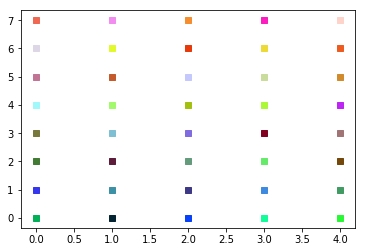

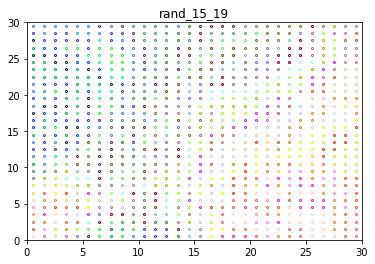

In [58]:
plot_thresh(hfre[:, 2], nhf, (30, 30, 35), "rand_15_19", "results", False)

legend: 
Lab:  0  Color:  #02b058
Lab:  1  Color:  #042333
Lab:  2  Color:  #0841fa
Lab:  3  Color:  #11fd99
Lab:  4  Color:  #28f934
Lab:  5  Color:  #3636ee
Lab:  6  Color:  #3c91a7
Lab:  7  Color:  #3e3986
Lab:  8  Color:  #3e8ae0
Lab:  9  Color:  #419b63
Lab:  10  Color:  #427b34
Lab:  11  Color:  #5c1c3a
Lab:  12  Color:  #649b7c
Lab:  13  Color:  #65eb69
Lab:  14  Color:  #74470b
Lab:  15  Color:  #77793c
Lab:  16  Color:  #7fbfd4
Lab:  17  Color:  #806be1
Lab:  18  Color:  #820022
Lab:  19  Color:  #a07475
Lab:  20  Color:  #a0f8fb
Lab:  21  Color:  #a3f96c
Lab:  22  Color:  #a4c00f
Lab:  23  Color:  #acf837
Lab:  24  Color:  #bd25f4
Lab:  25  Color:  #c27495
Lab:  26  Color:  #c55a2d
Lab:  27  Color:  #c5c8fc
Lab:  28  Color:  #c9dc9b
Lab:  29  Color:  #d18b2c
Lab:  30  Color:  #dcd6e7
Lab:  31  Color:  #e2fa2b
Lab:  32  Color:  #e8390a
Lab:  33  Color:  #edda36
Lab:  34  Color:  #ee5b21
Lab:  35  Color:  #f06752
Lab:  36  Color:  #f28cf0
Lab:  37  Color:  #f68e2f
Lab:  38  Col

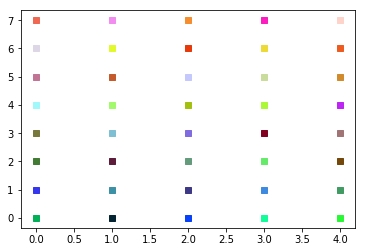

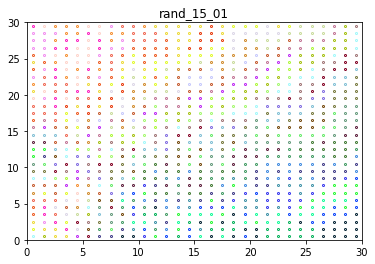

In [59]:
plot_thresh(mure[:, 2], nmu, (30, 30, 35), "rand_15_01", "results", False)

legend: 
Lab:  0  Color:  #02b058
Lab:  1  Color:  #042333
Lab:  2  Color:  #0841fa
Lab:  3  Color:  #11fd99
Lab:  4  Color:  #28f934
Lab:  5  Color:  #3636ee
Lab:  6  Color:  #3c91a7
Lab:  7  Color:  #3e3986
Lab:  8  Color:  #3e8ae0
Lab:  9  Color:  #419b63
Lab:  10  Color:  #427b34
Lab:  11  Color:  #5c1c3a
Lab:  12  Color:  #649b7c
Lab:  13  Color:  #65eb69
Lab:  14  Color:  #74470b
Lab:  15  Color:  #77793c
Lab:  16  Color:  #7fbfd4
Lab:  17  Color:  #806be1
Lab:  18  Color:  #820022
Lab:  19  Color:  #a07475
Lab:  20  Color:  #a0f8fb
Lab:  21  Color:  #a3f96c
Lab:  22  Color:  #a4c00f
Lab:  23  Color:  #acf837
Lab:  24  Color:  #bd25f4
Lab:  25  Color:  #c27495
Lab:  26  Color:  #c55a2d
Lab:  27  Color:  #c5c8fc
Lab:  28  Color:  #c9dc9b
Lab:  29  Color:  #d18b2c
Lab:  30  Color:  #dcd6e7
Lab:  31  Color:  #e2fa2b
Lab:  32  Color:  #e8390a
Lab:  33  Color:  #edda36
Lab:  34  Color:  #ee5b21
Lab:  35  Color:  #f06752
Lab:  36  Color:  #f28cf0
Lab:  37  Color:  #f68e2f
Lab:  38  Col

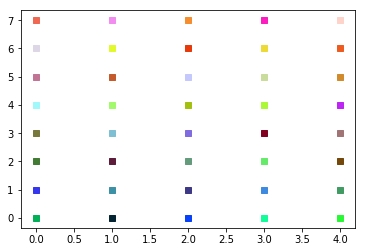

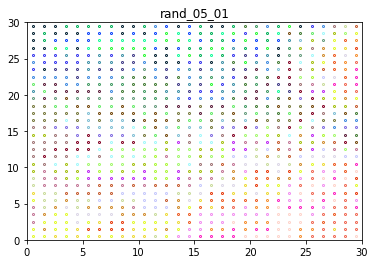

In [60]:
plot_thresh(tere[:, 2], nte, (30, 30, 35), "rand_05_01", "results", False)

legend: 
Lab:  0  Color:  #02b058
Lab:  1  Color:  #042333
Lab:  2  Color:  #0841fa
Lab:  3  Color:  #11fd99
Lab:  4  Color:  #28f934
Lab:  5  Color:  #3636ee
Lab:  6  Color:  #3c91a7
Lab:  7  Color:  #3e3986
Lab:  8  Color:  #3e8ae0
Lab:  9  Color:  #419b63
Lab:  10  Color:  #427b34
Lab:  11  Color:  #5c1c3a
Lab:  12  Color:  #649b7c
Lab:  13  Color:  #65eb69
Lab:  14  Color:  #74470b
Lab:  15  Color:  #77793c
Lab:  16  Color:  #7fbfd4
Lab:  17  Color:  #806be1
Lab:  18  Color:  #820022
Lab:  19  Color:  #a07475
Lab:  20  Color:  #a0f8fb
Lab:  21  Color:  #a3f96c
Lab:  22  Color:  #a4c00f
Lab:  23  Color:  #acf837
Lab:  24  Color:  #bd25f4
Lab:  25  Color:  #c27495
Lab:  26  Color:  #c55a2d
Lab:  27  Color:  #c5c8fc
Lab:  28  Color:  #c9dc9b
Lab:  29  Color:  #d18b2c
Lab:  30  Color:  #dcd6e7
Lab:  31  Color:  #e2fa2b
Lab:  32  Color:  #e8390a
Lab:  33  Color:  #edda36
Lab:  34  Color:  #ee5b21
Lab:  35  Color:  #f06752
Lab:  36  Color:  #f28cf0
Lab:  37  Color:  #f68e2f
Lab:  38  Col

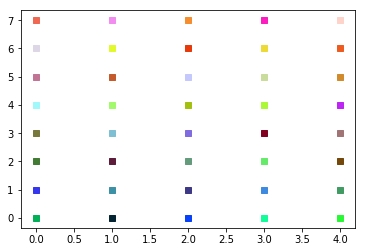

map saved!!


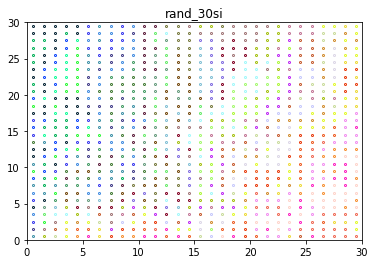

In [163]:
plot_thresh(retar[:, 2], n7, (30, 30, 35), "rand_30si", "results", True)

legend: 
Lab:  0  Color:  #02b058
Lab:  1  Color:  #042333
Lab:  2  Color:  #0841fa
Lab:  3  Color:  #11fd99
Lab:  4  Color:  #28f934
Lab:  5  Color:  #3636ee
Lab:  6  Color:  #3c91a7
Lab:  7  Color:  #3e3986
Lab:  8  Color:  #3e8ae0
Lab:  9  Color:  #419b63
Lab:  10  Color:  #427b34
Lab:  11  Color:  #5c1c3a
Lab:  12  Color:  #649b7c
Lab:  13  Color:  #65eb69
Lab:  14  Color:  #74470b
Lab:  15  Color:  #77793c
Lab:  16  Color:  #7fbfd4
Lab:  17  Color:  #806be1
Lab:  18  Color:  #820022
Lab:  19  Color:  #a07475
Lab:  20  Color:  #a0f8fb
Lab:  21  Color:  #a3f96c
Lab:  22  Color:  #a4c00f
Lab:  23  Color:  #acf837
Lab:  24  Color:  #bd25f4
Lab:  25  Color:  #c27495
Lab:  26  Color:  #c55a2d
Lab:  27  Color:  #c5c8fc
Lab:  28  Color:  #c9dc9b
Lab:  29  Color:  #d18b2c
Lab:  30  Color:  #dcd6e7
Lab:  31  Color:  #e2fa2b
Lab:  32  Color:  #e8390a
Lab:  33  Color:  #edda36
Lab:  34  Color:  #ee5b21
Lab:  35  Color:  #f06752
Lab:  36  Color:  #f28cf0
Lab:  37  Color:  #f68e2f
Lab:  38  Col

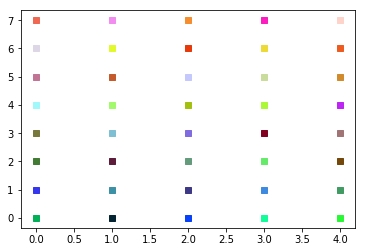

map saved!!


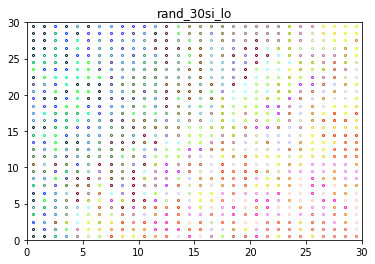

In [167]:
plot_thresh(retar[:, 2], n8, (30, 30, 35), "rand_30si_lo", "results", True)

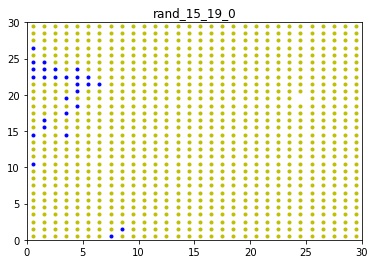

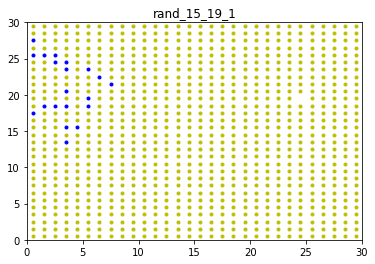

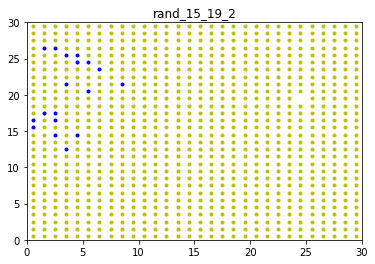

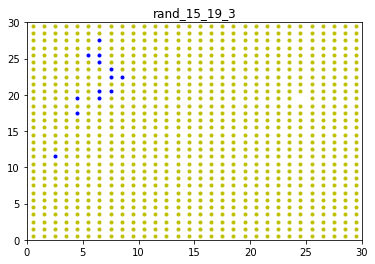

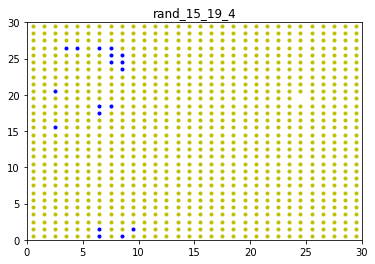

...

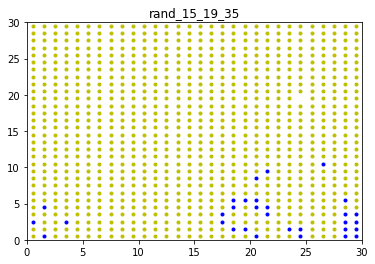

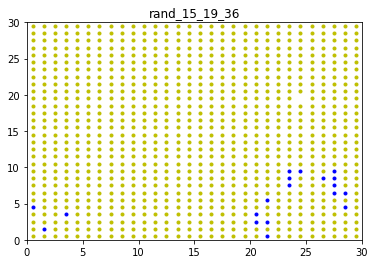

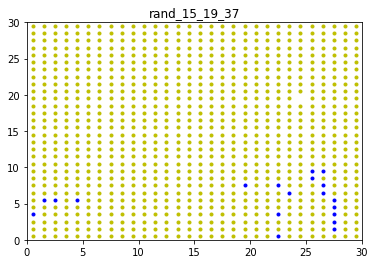

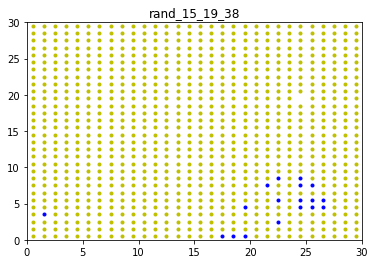

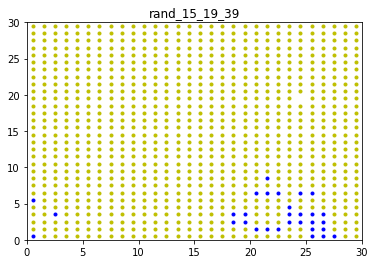

In [61]:
plot_thresh_onev(hfre[:, 2], nhf, (30, 30, 35), "rand_15_19", "results", False)

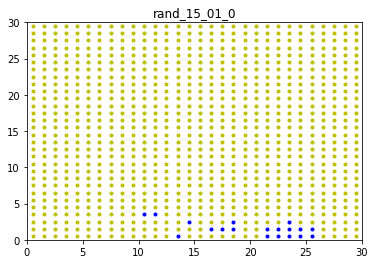

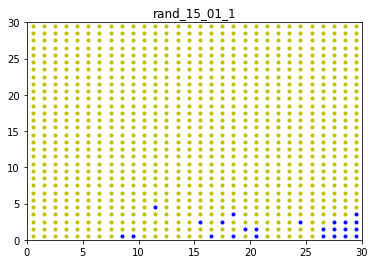

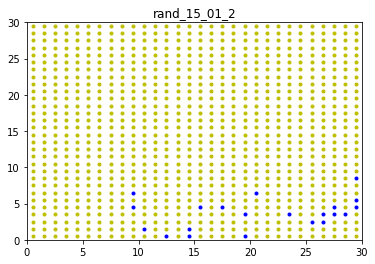

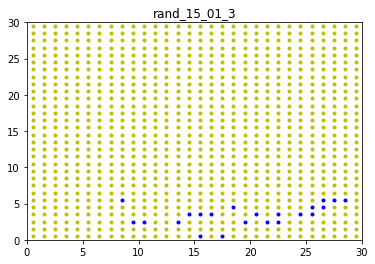

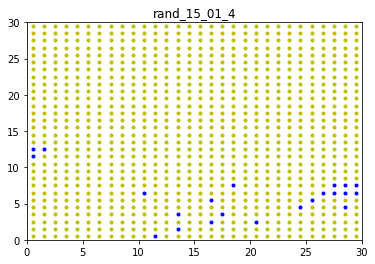

...

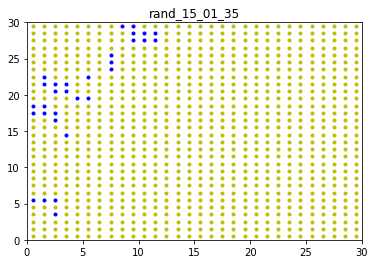

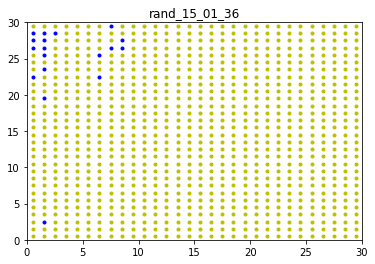

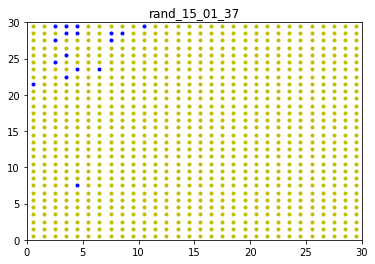

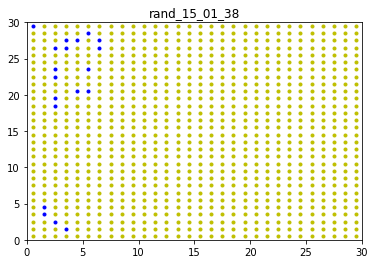

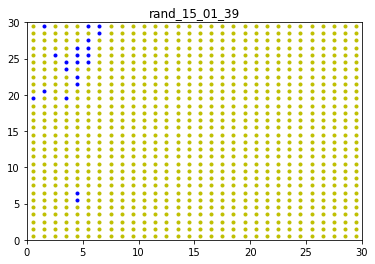

In [62]:
plot_thresh_onev(mure[:, 2], nmu, (30, 30, 35), "rand_15_01", "results", False)

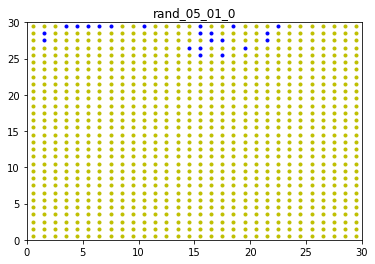

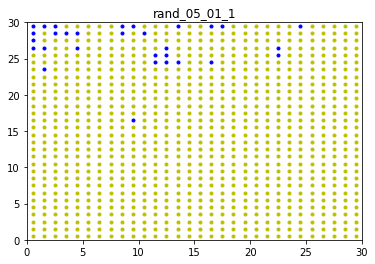

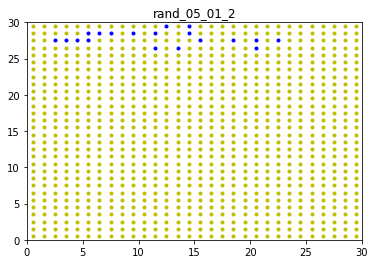

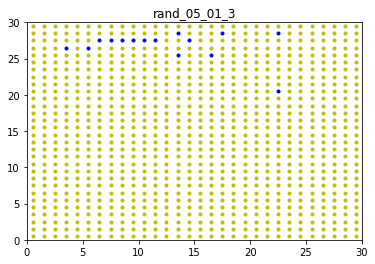

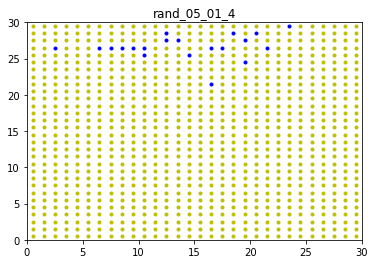

...

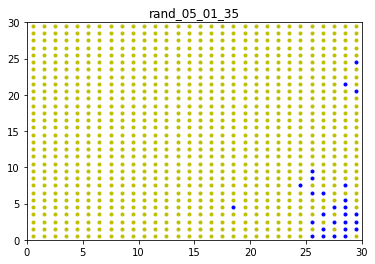

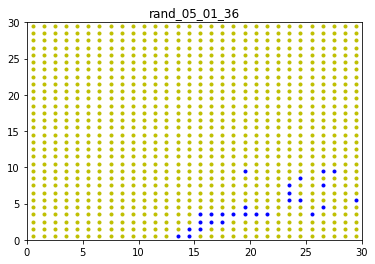

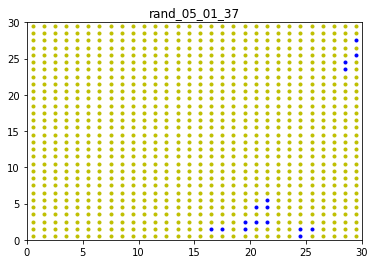

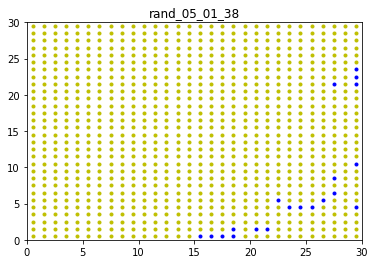

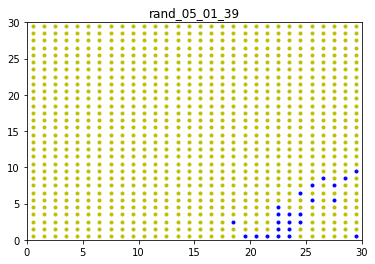

In [63]:
plot_thresh_onev(tere[:, 2], nte, (30, 30, 35), "rand_05_01", "results", False)

map saved!!


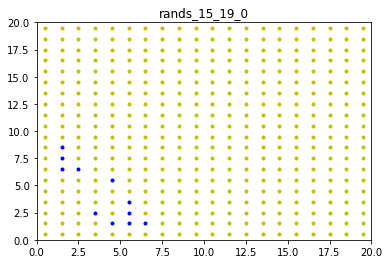

map saved!!


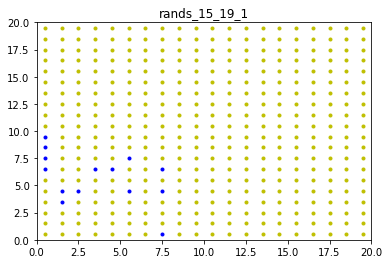

map saved!!


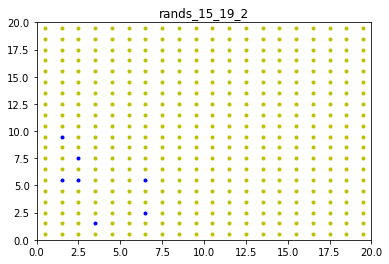

map saved!!


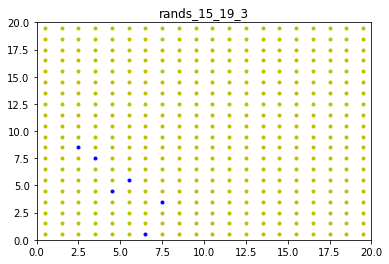

map saved!!


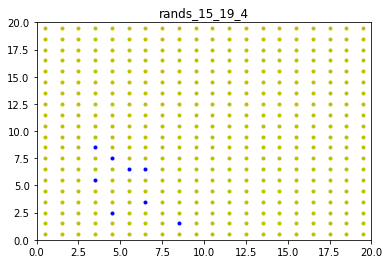

map saved!!


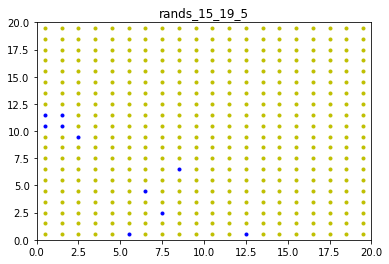

map saved!!


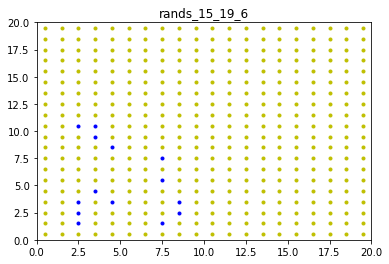

map saved!!


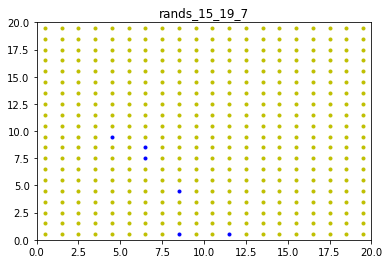

map saved!!


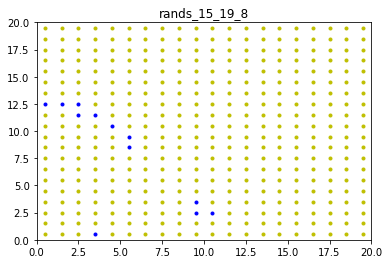

map saved!!


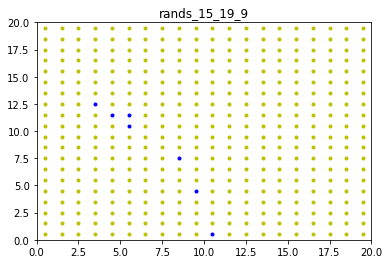

map saved!!


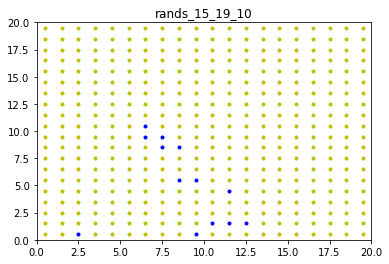

map saved!!


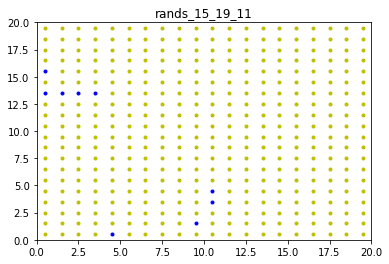

map saved!!


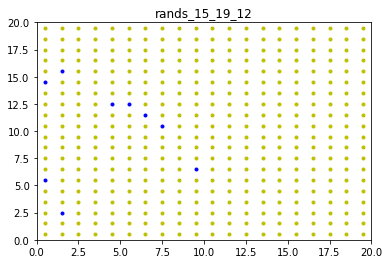

map saved!!


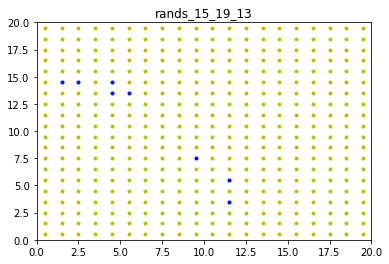

map saved!!


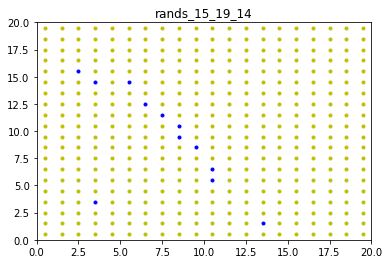

map saved!!


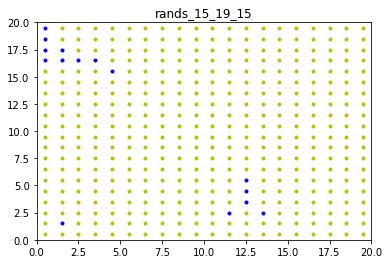

map saved!!


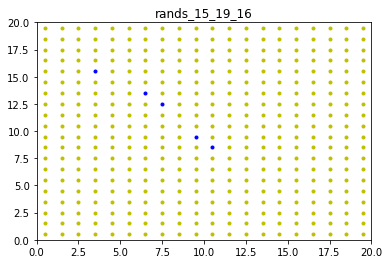

map saved!!


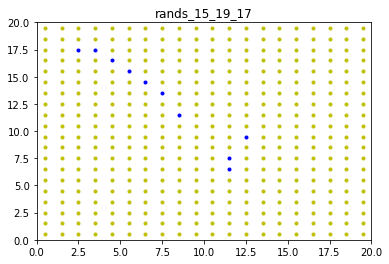

map saved!!


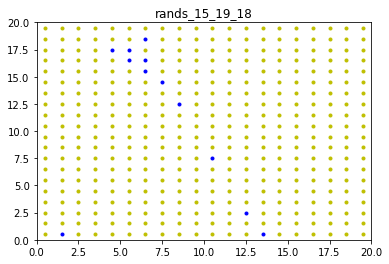

map saved!!


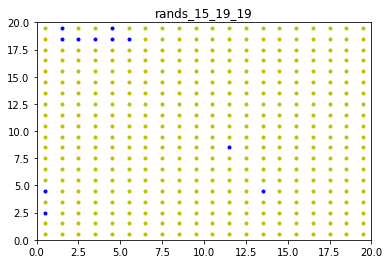

map saved!!


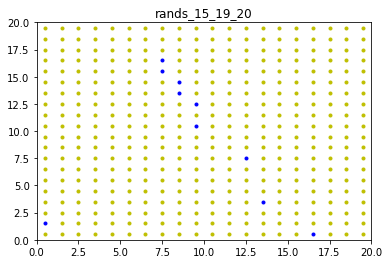

map saved!!


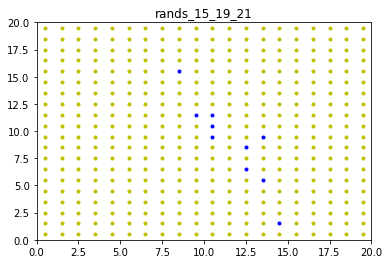

map saved!!


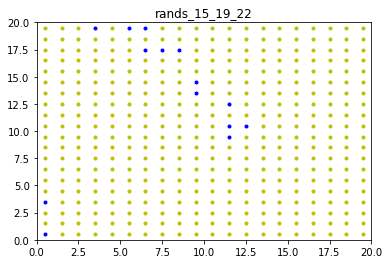

map saved!!


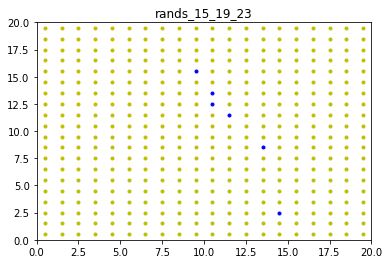

map saved!!


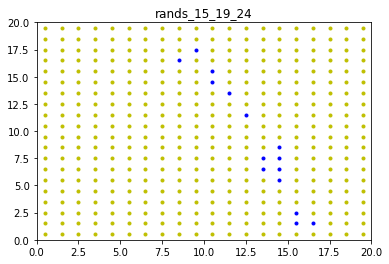

map saved!!


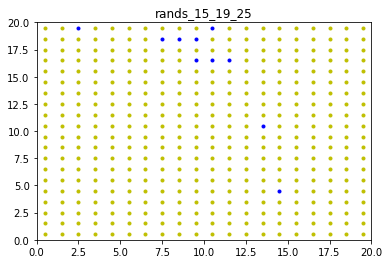

map saved!!


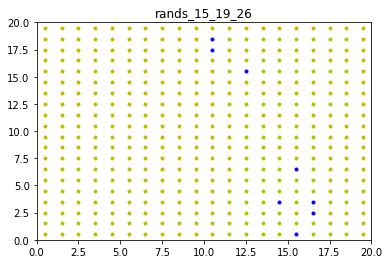

map saved!!


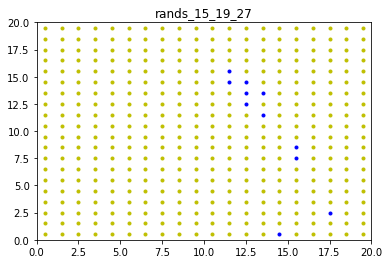

map saved!!


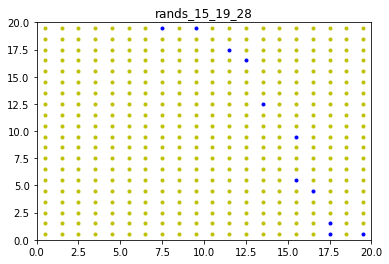

map saved!!


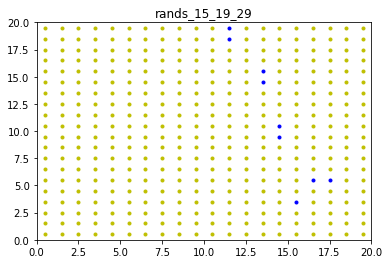

map saved!!


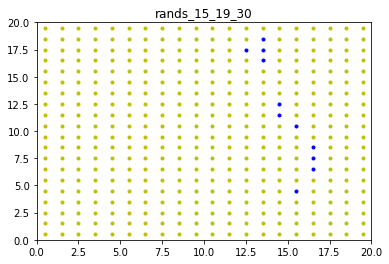

map saved!!


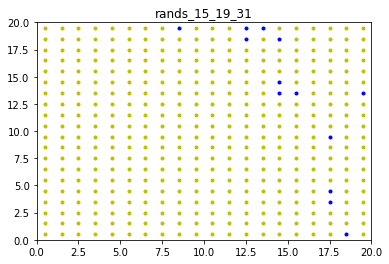

map saved!!


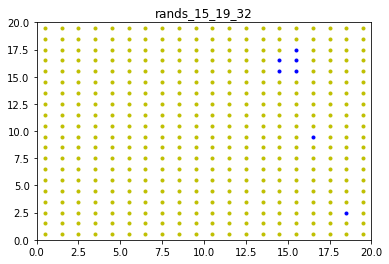

map saved!!


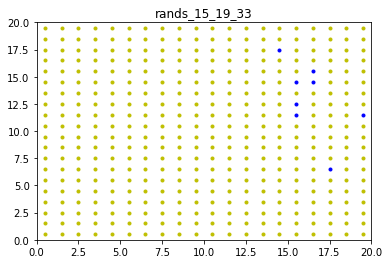

map saved!!


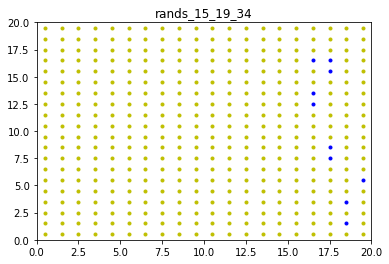

map saved!!


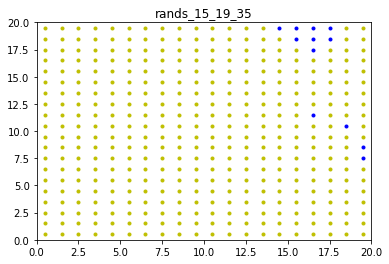

map saved!!


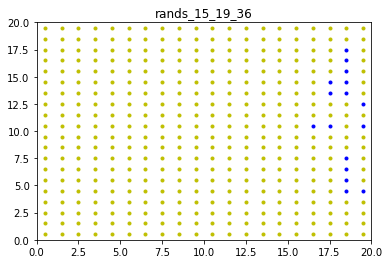

map saved!!


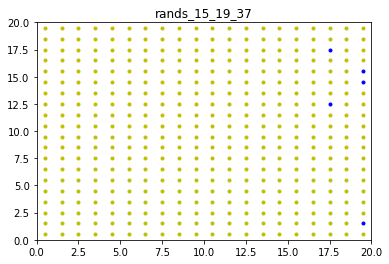

map saved!!


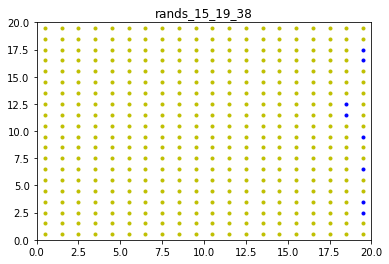

map saved!!


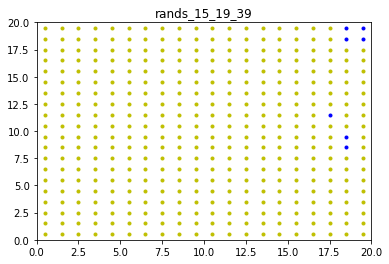

In [157]:
plot_thresh_onev(retar[:, 2], n4, (20, 20, 35), "rands_15_19", "results", True)

map saved!!


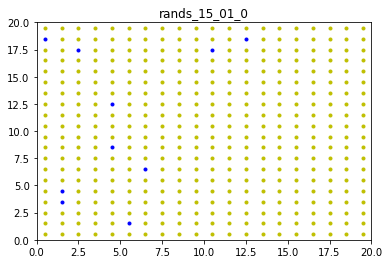

map saved!!


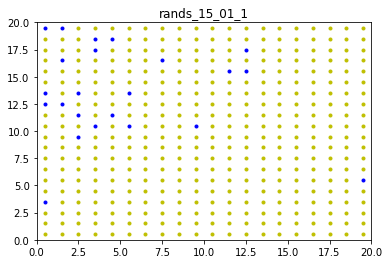

map saved!!


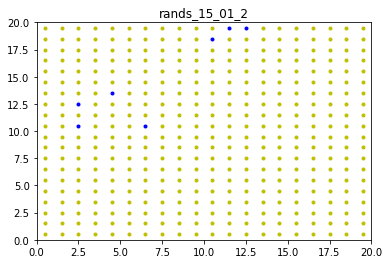

map saved!!


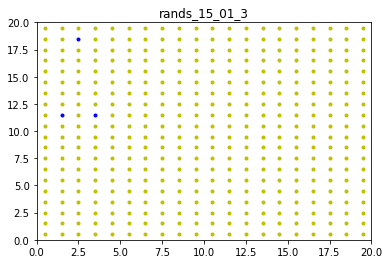

map saved!!


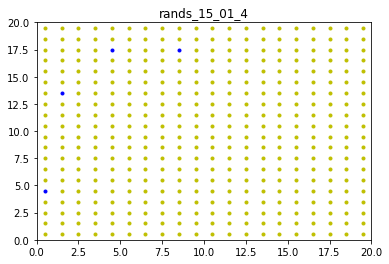

map saved!!


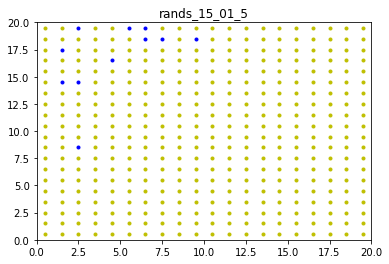

map saved!!


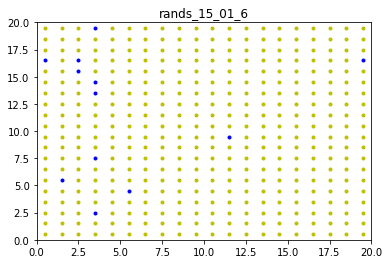

map saved!!


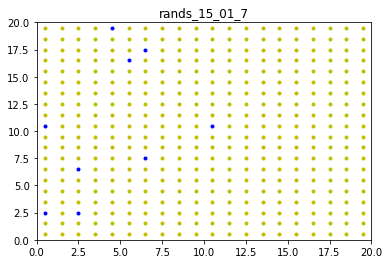

map saved!!


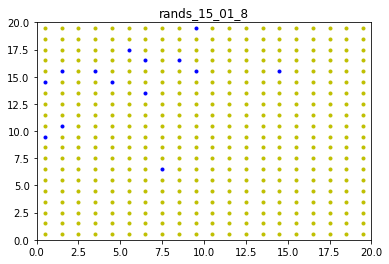

map saved!!


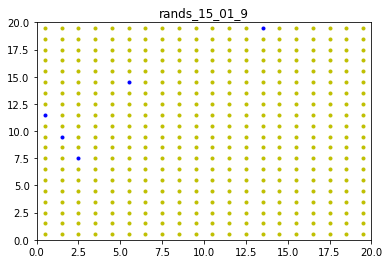

map saved!!


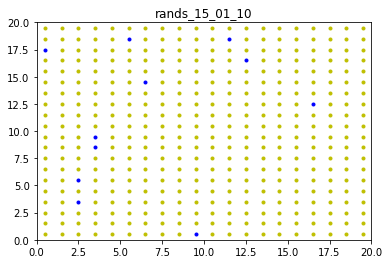

map saved!!


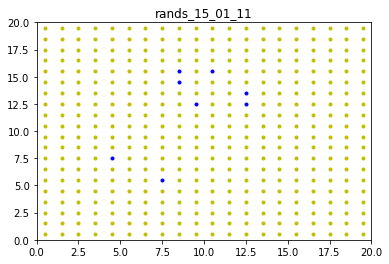

map saved!!


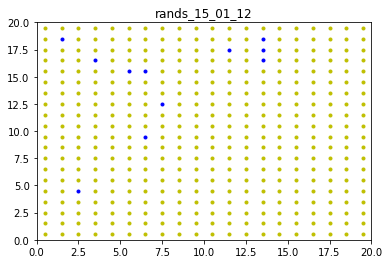

map saved!!


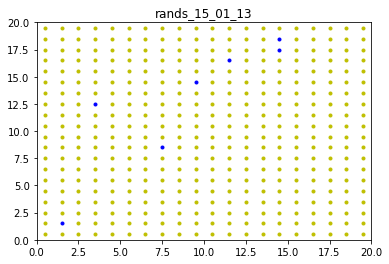

map saved!!


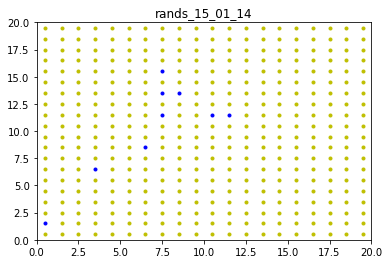

map saved!!


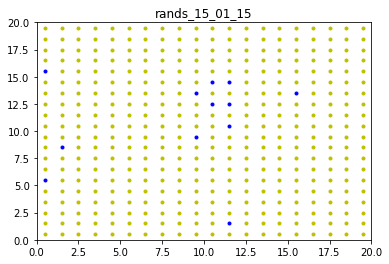

map saved!!


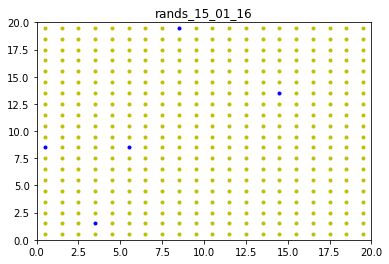

map saved!!


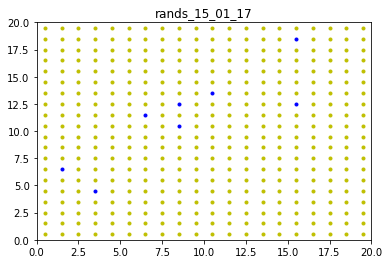

map saved!!


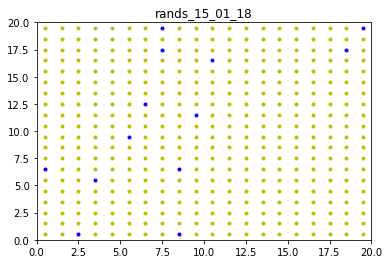

map saved!!


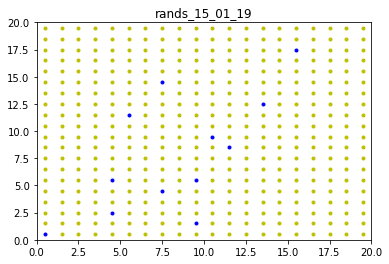

map saved!!


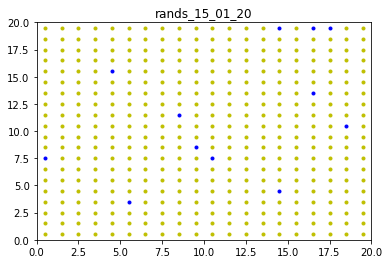

map saved!!


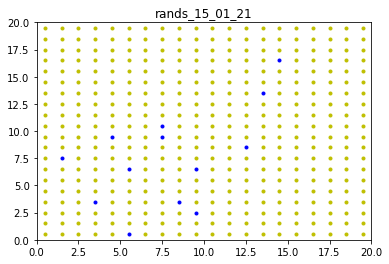

map saved!!


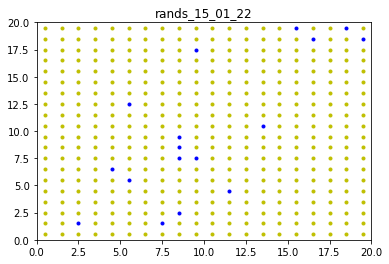

map saved!!


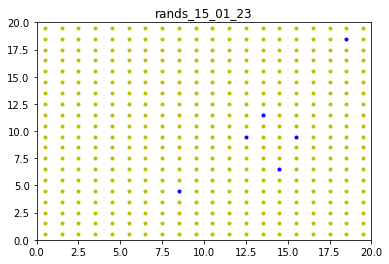

map saved!!


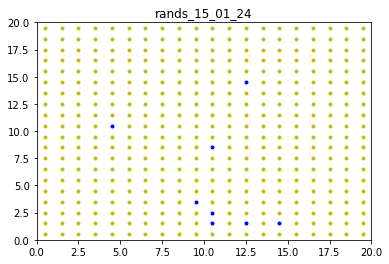

map saved!!


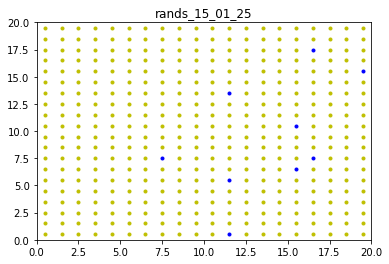

map saved!!


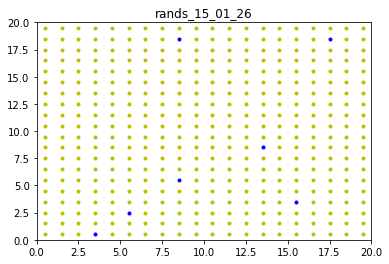

map saved!!


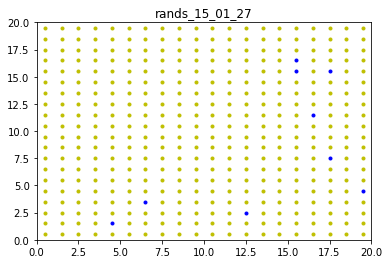

map saved!!


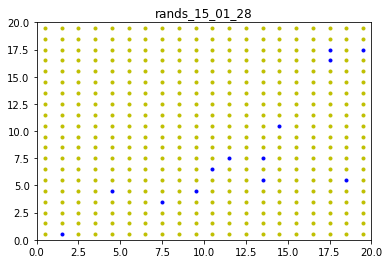

map saved!!


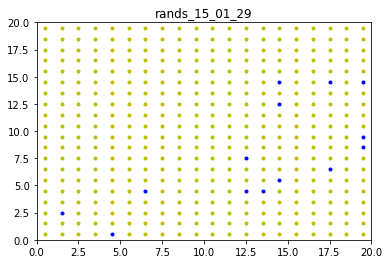

map saved!!


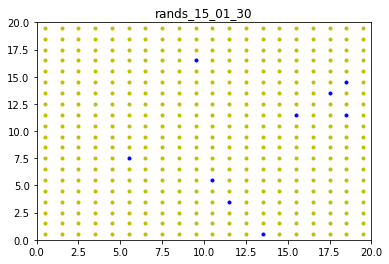

map saved!!


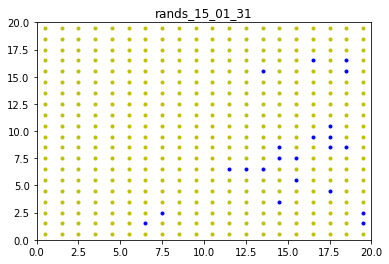

map saved!!


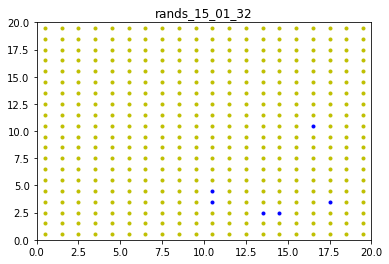

map saved!!


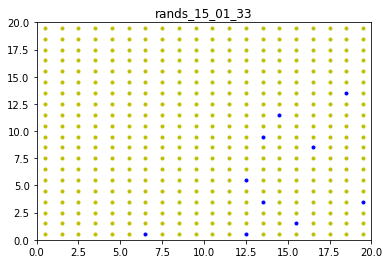

map saved!!


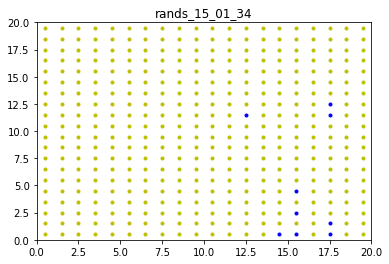

map saved!!


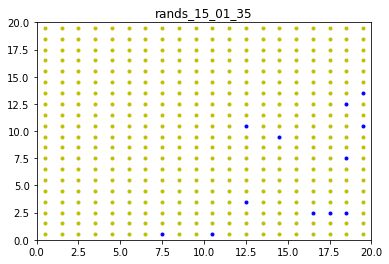

map saved!!


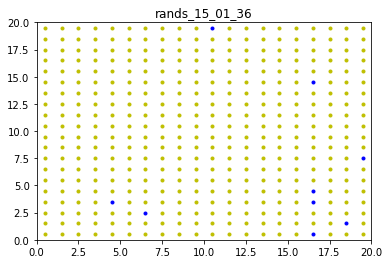

map saved!!


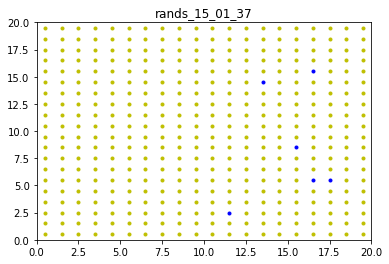

map saved!!


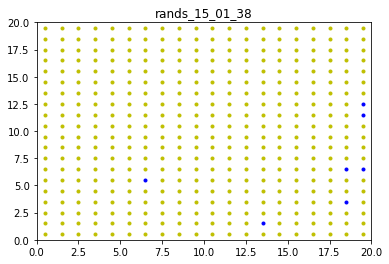

map saved!!


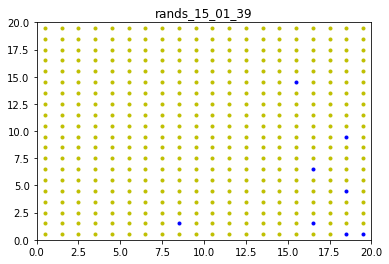

In [158]:
plot_thresh_onev(retar[:, 2], n5, (20, 20, 35), "rands_15_01", "results", True)

map saved!!


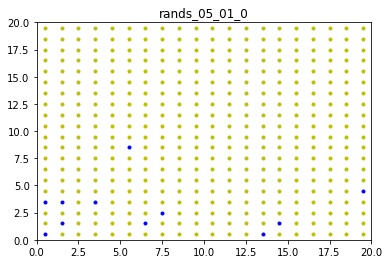

map saved!!


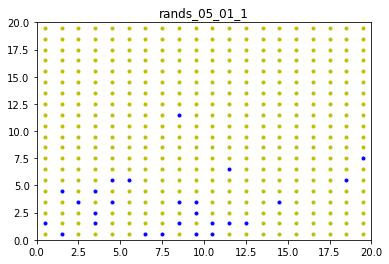

map saved!!


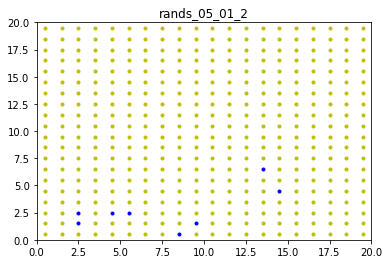

map saved!!


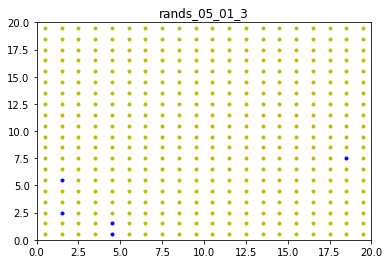

map saved!!


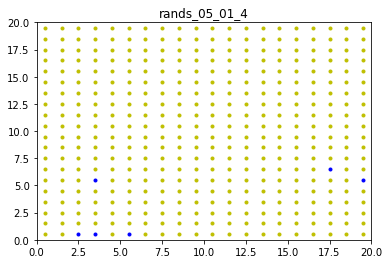

map saved!!


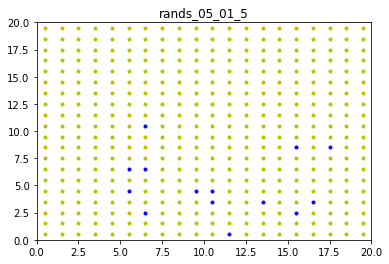

map saved!!


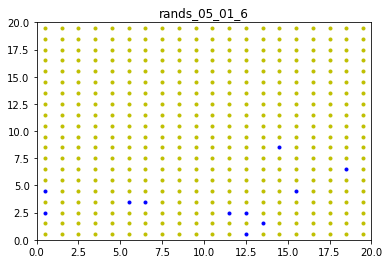

map saved!!


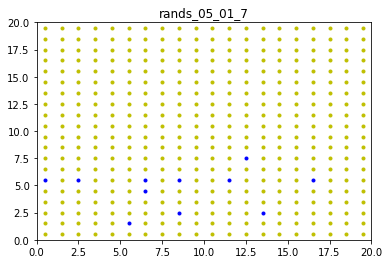

map saved!!


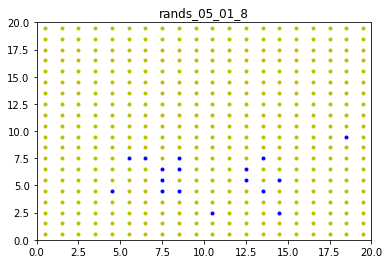

map saved!!


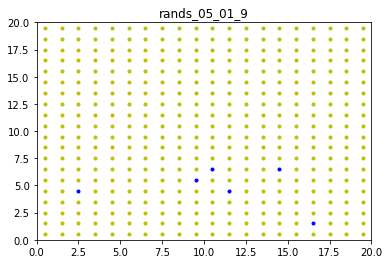

map saved!!


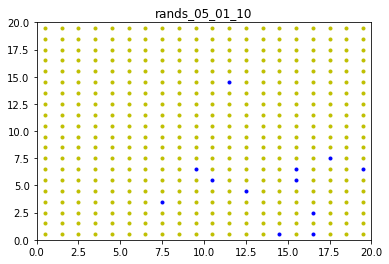

map saved!!


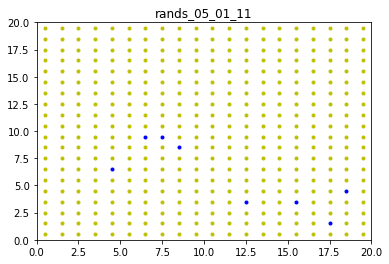

map saved!!


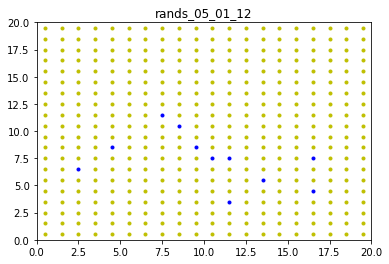

map saved!!


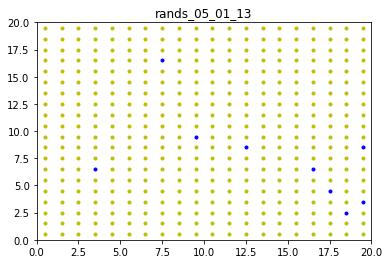

map saved!!


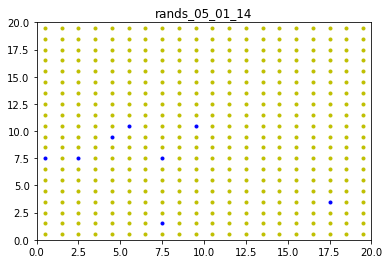

map saved!!


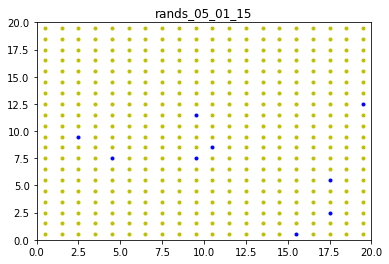

map saved!!


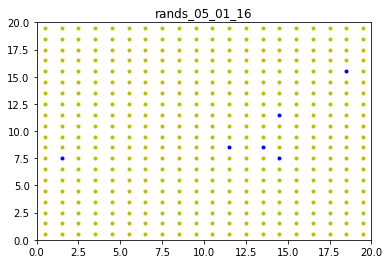

map saved!!


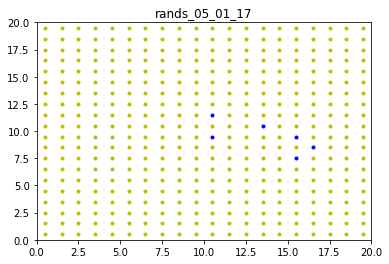

map saved!!


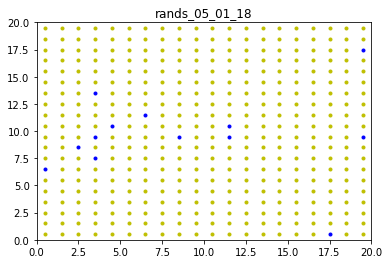

map saved!!


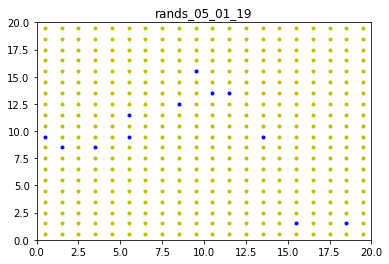

map saved!!


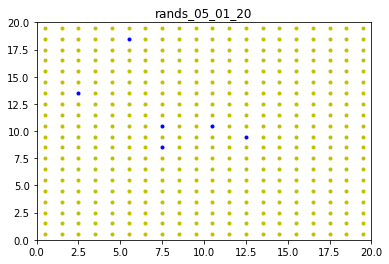

map saved!!


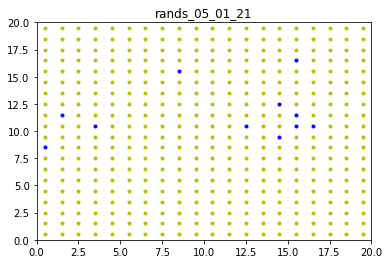

map saved!!


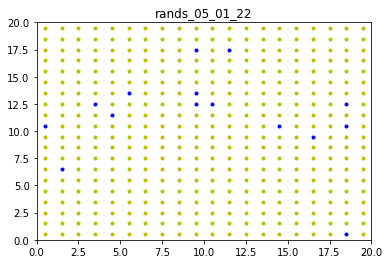

map saved!!


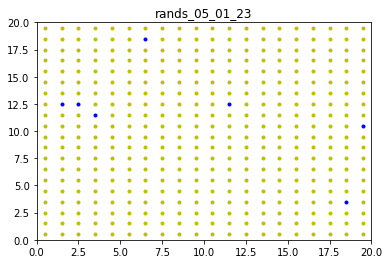

map saved!!


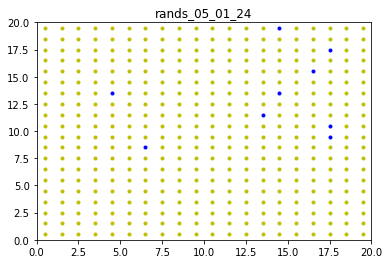

map saved!!


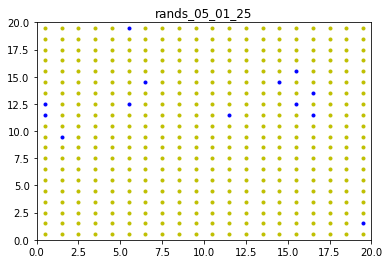

map saved!!


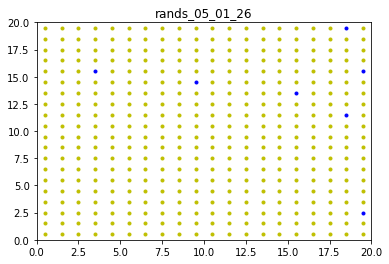

map saved!!


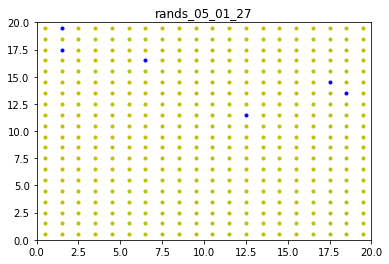

map saved!!


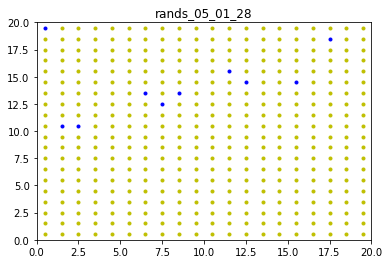

map saved!!


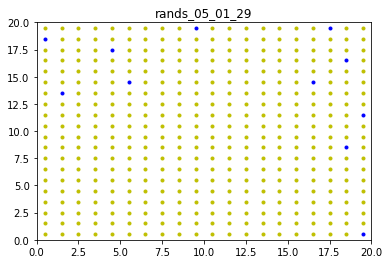

map saved!!


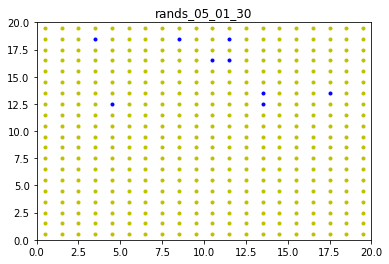

map saved!!


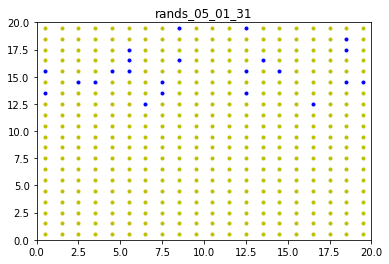

map saved!!


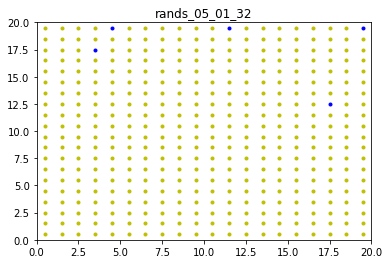

map saved!!


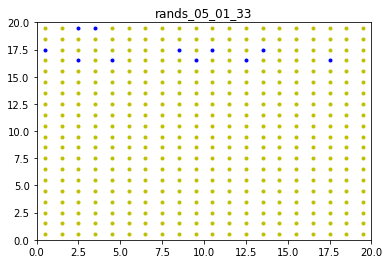

map saved!!


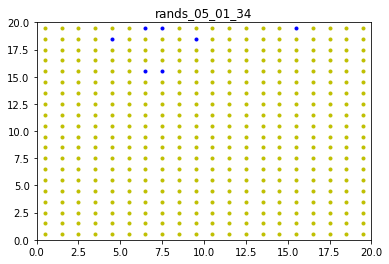

map saved!!


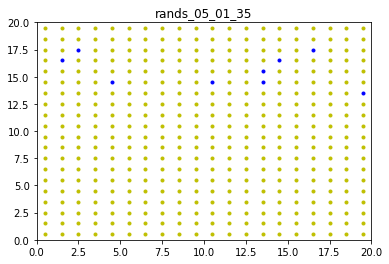

map saved!!


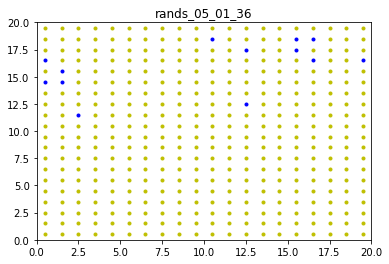

map saved!!


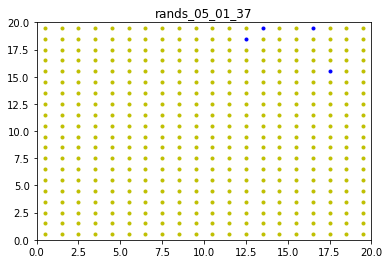

map saved!!


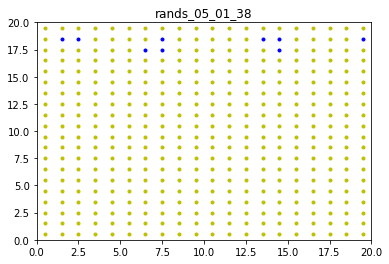

map saved!!


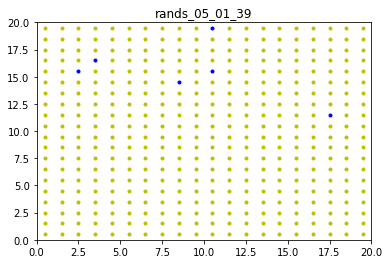

In [159]:
plot_thresh_onev(retar[:, 2], n6, (20, 20, 35), "rands_05_01", "results", True)

map saved!!


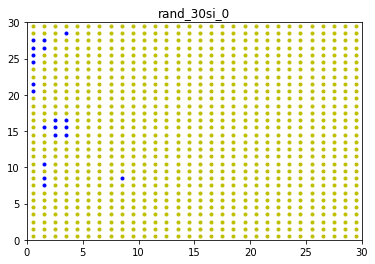

map saved!!


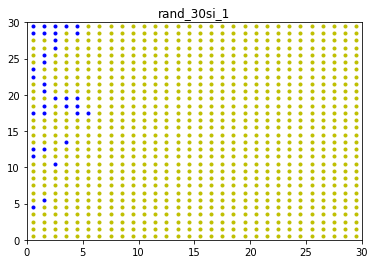

map saved!!


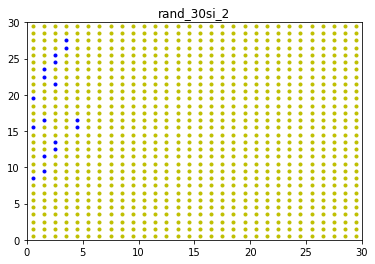

map saved!!


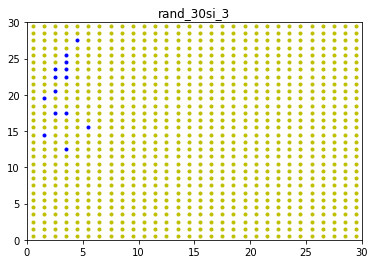

map saved!!


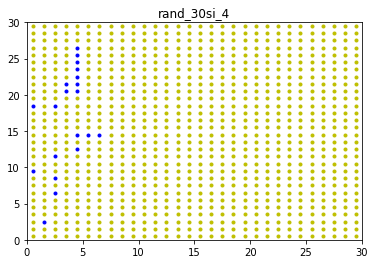

map saved!!


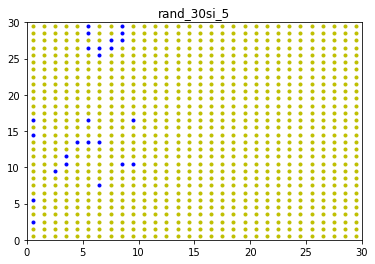

map saved!!


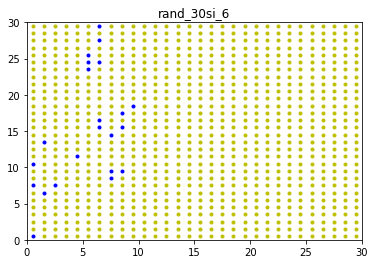

map saved!!


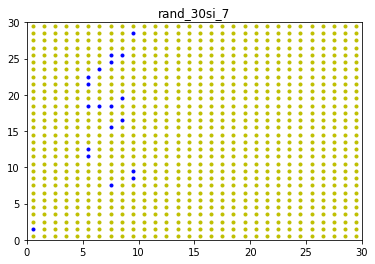

map saved!!


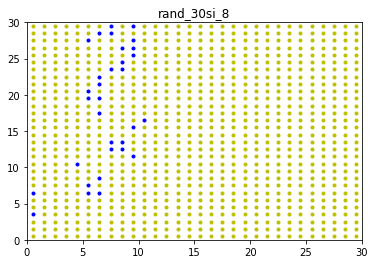

map saved!!


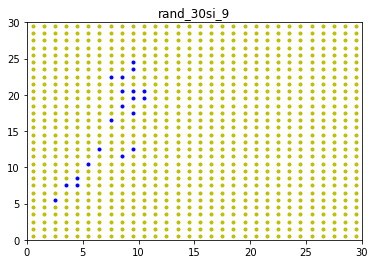

map saved!!


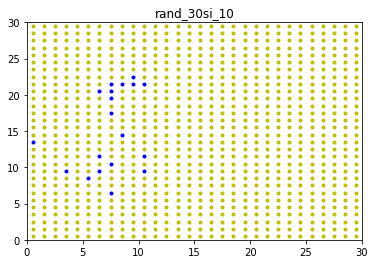

map saved!!


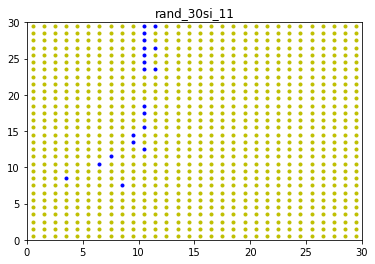

map saved!!


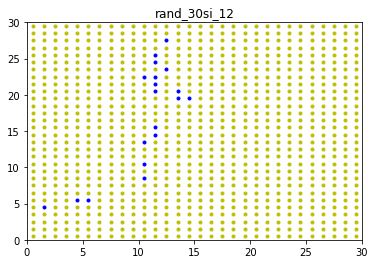

map saved!!


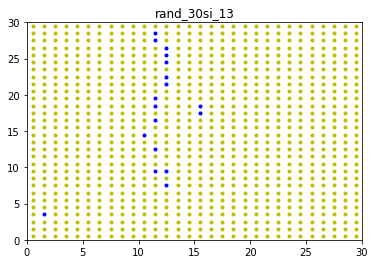

map saved!!


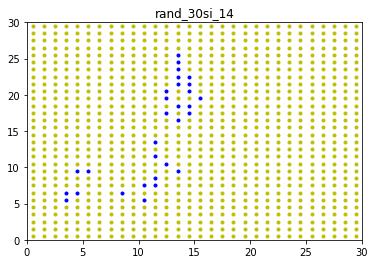

map saved!!


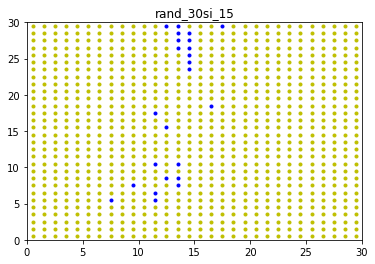

map saved!!


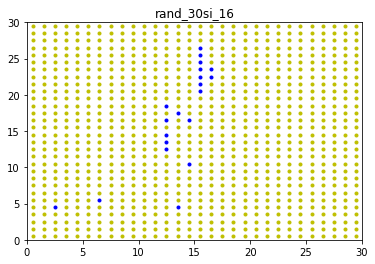

map saved!!


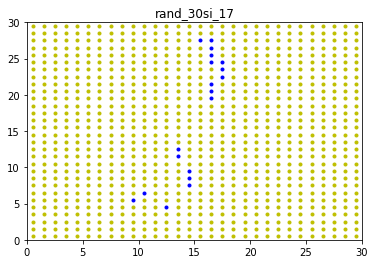

map saved!!


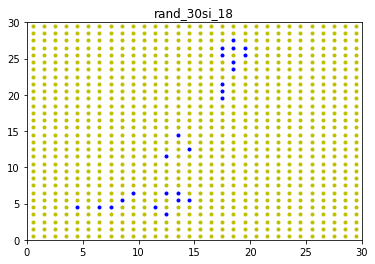

map saved!!


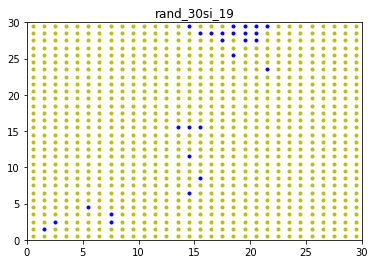

map saved!!


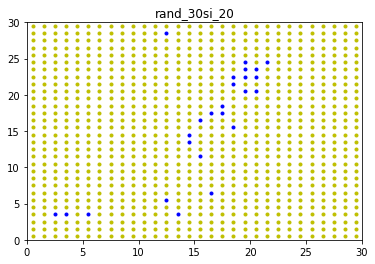

map saved!!


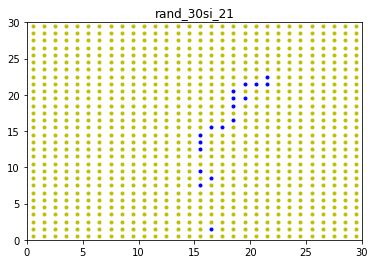

map saved!!


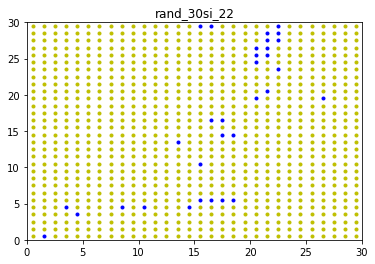

map saved!!


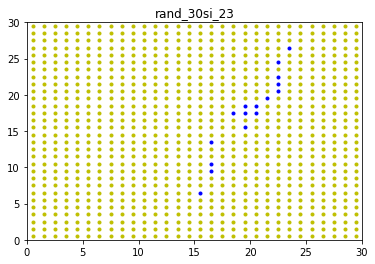

map saved!!


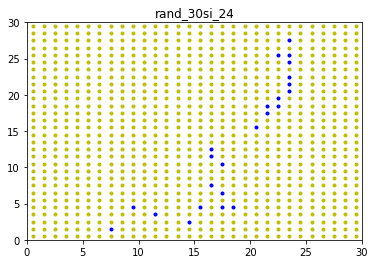

map saved!!


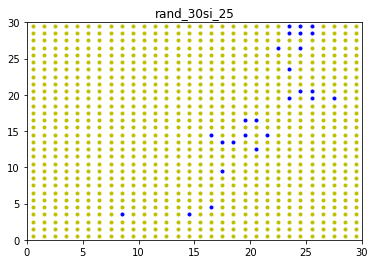

map saved!!


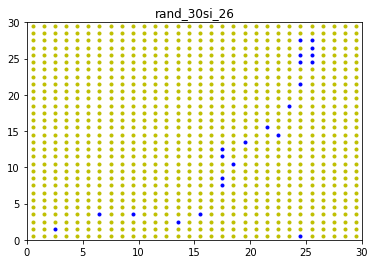

map saved!!


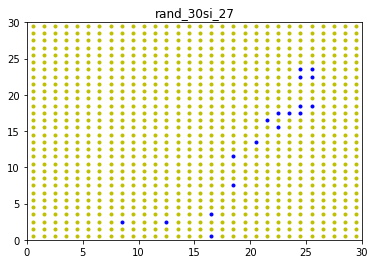

map saved!!


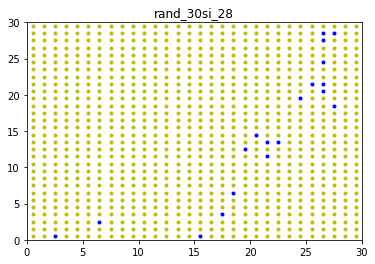

map saved!!


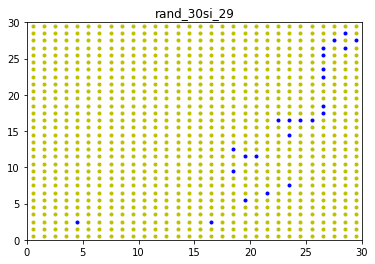

map saved!!


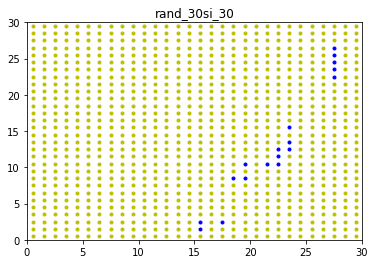

map saved!!


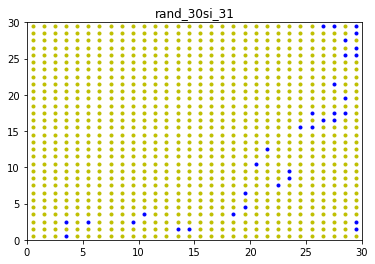

map saved!!


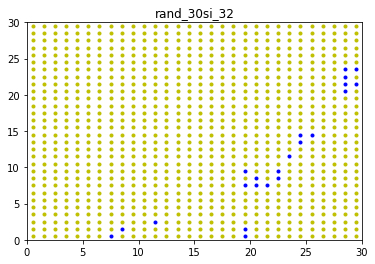

map saved!!


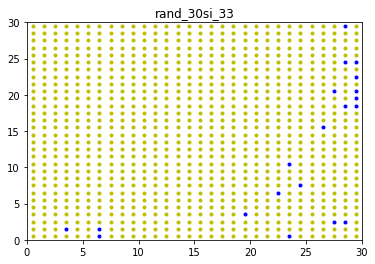

map saved!!


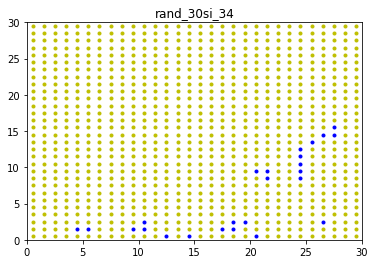

map saved!!


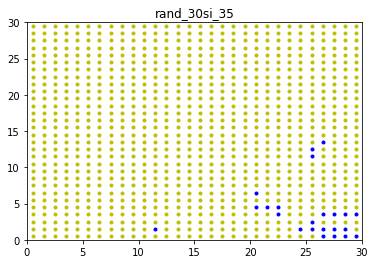

map saved!!


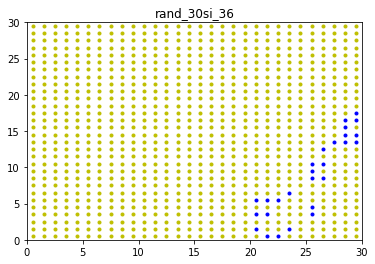

map saved!!


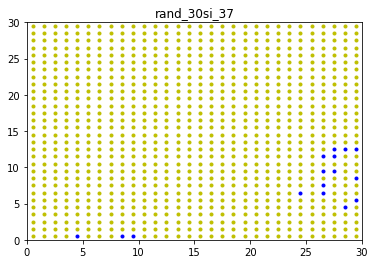

map saved!!


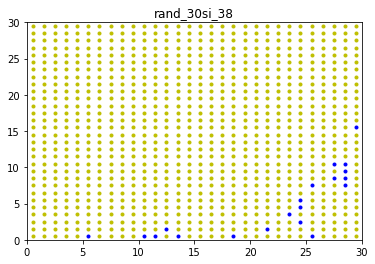

map saved!!


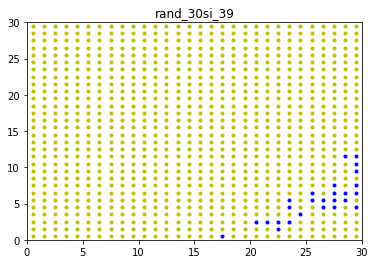

In [168]:
plot_thresh_onev(retar[:, 2], n7, (30, 30, 35), "rand_30si", "results", True)

map saved!!


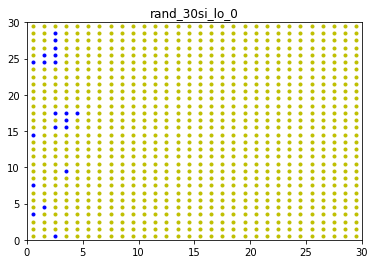

map saved!!


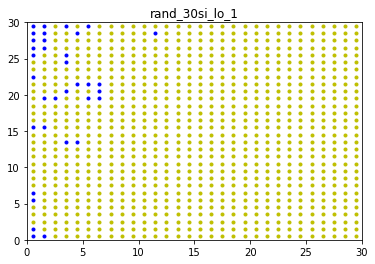

map saved!!


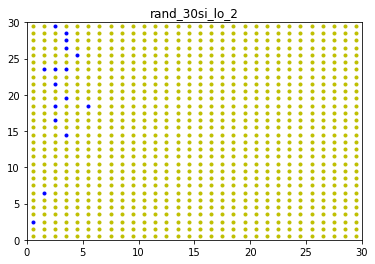

map saved!!


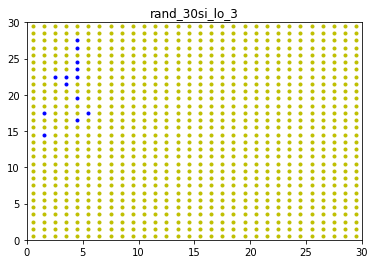

map saved!!


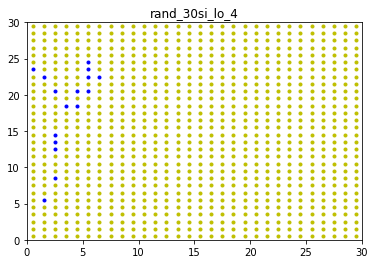

map saved!!


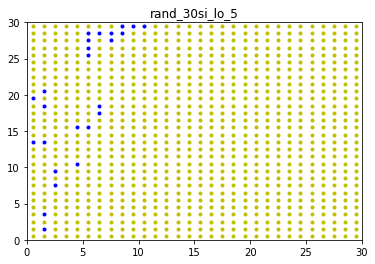

map saved!!


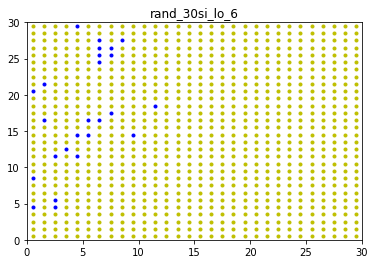

map saved!!


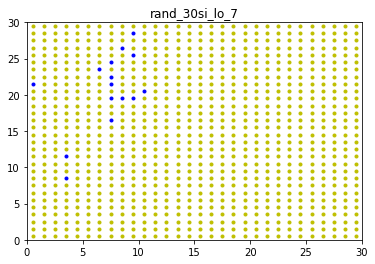

map saved!!


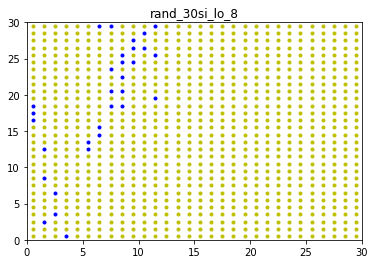

map saved!!


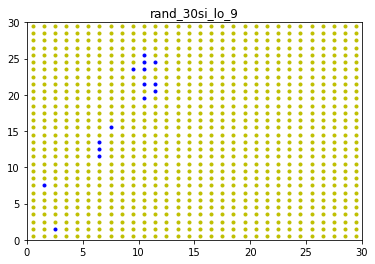

map saved!!


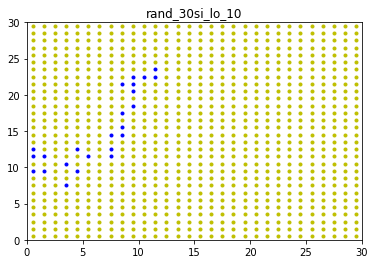

map saved!!


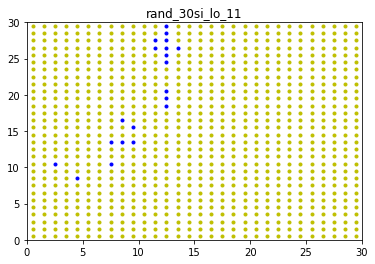

map saved!!


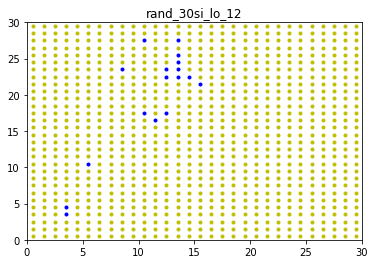

map saved!!


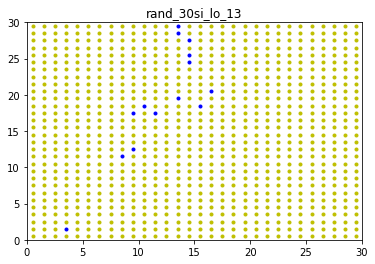

map saved!!


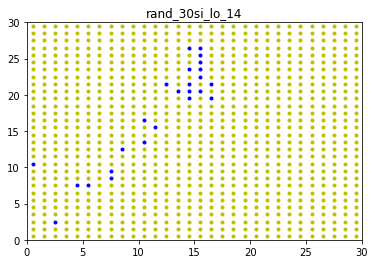

map saved!!


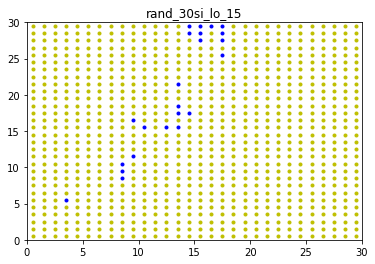

map saved!!


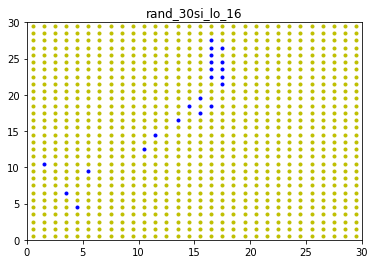

map saved!!


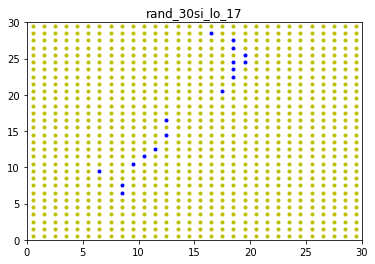

map saved!!


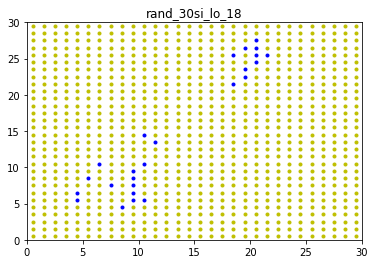

map saved!!


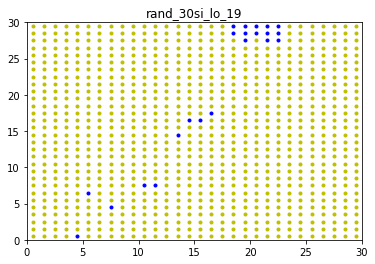

map saved!!


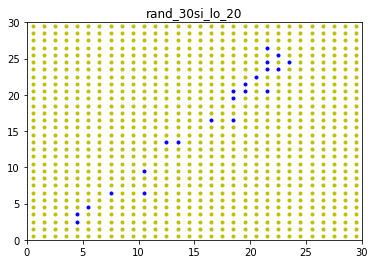

map saved!!


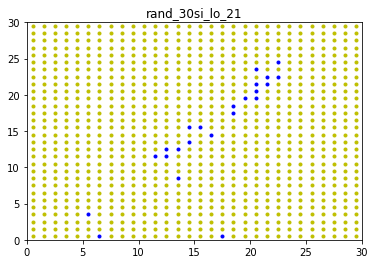

map saved!!


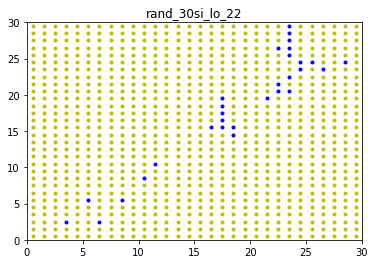

map saved!!


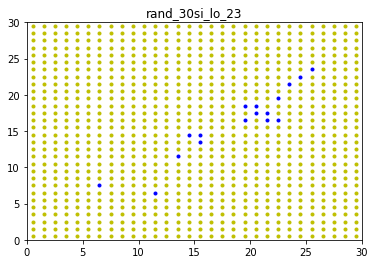

map saved!!


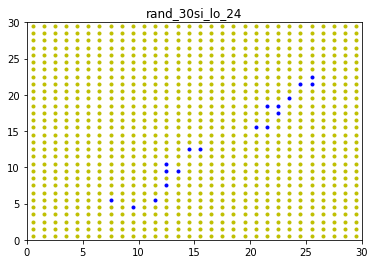

map saved!!


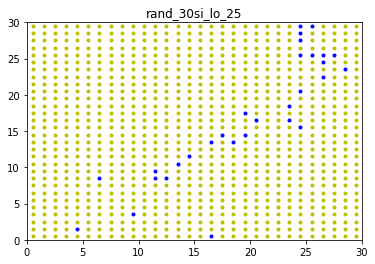

map saved!!


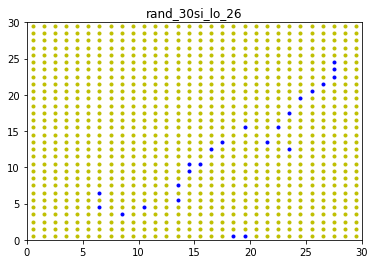

map saved!!


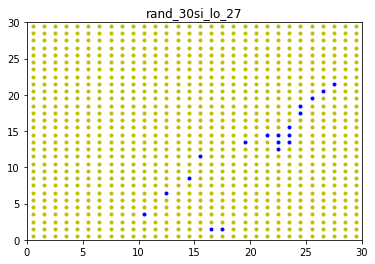

map saved!!


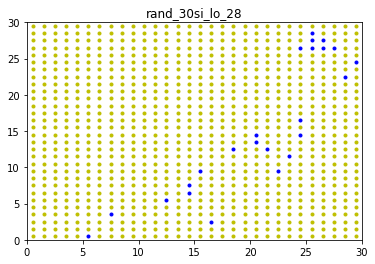

map saved!!


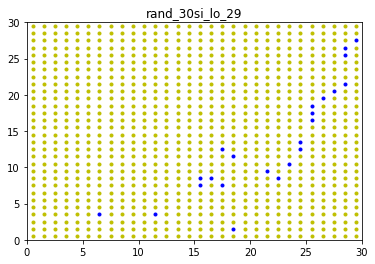

map saved!!


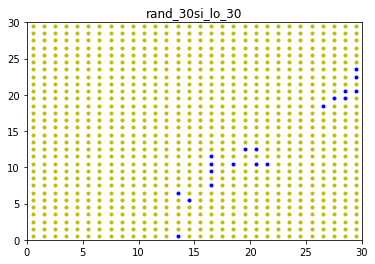

map saved!!


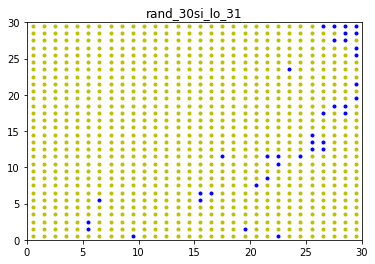

map saved!!


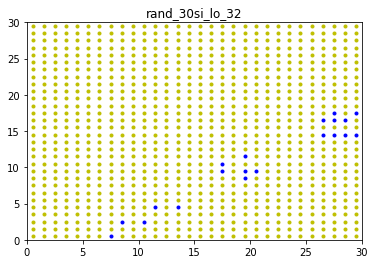

map saved!!


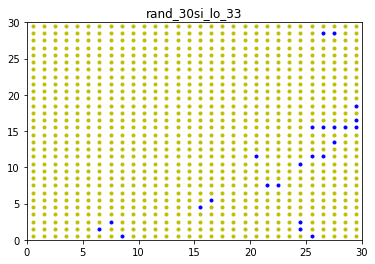

map saved!!


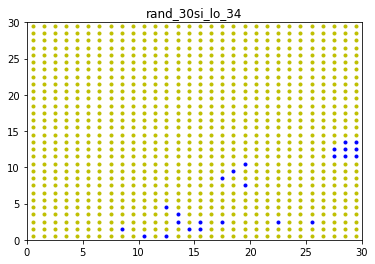

map saved!!


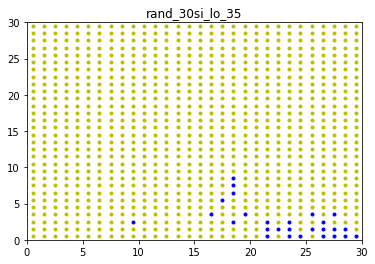

map saved!!


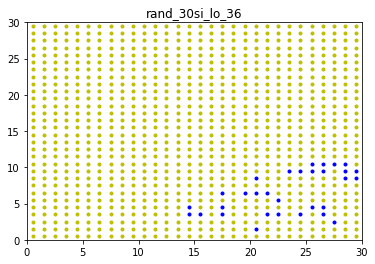

map saved!!


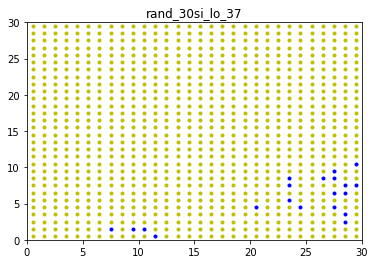

map saved!!


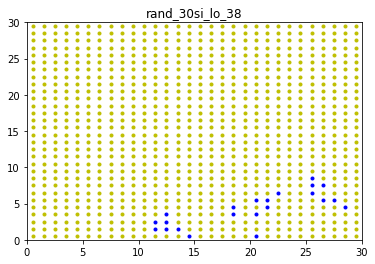

map saved!!


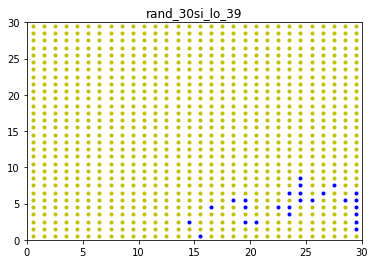

In [169]:
plot_thresh_onev(retar[:, 2], n8, (30, 30, 35), "rand_30si_lo", "results", True)

# Starting sections...

In [151]:
# get only required portions of data
def ext_np(csvdata, npydata, nopts):
    
    csv_k, csv_v = lookup(csvdata)
    npy_k, npy_v = lookup(npydata)
    nlis, coll = [], []
    
    for i in range(len(csv_k)):
        print(i)
        cur_ck = csv_k[i]
        cur_cv = csv_v[i]
        cur_nk = npy_k[i]
        cur_nv = npy_v[i]
        ecol = []
        
        labset = list(set(cur_cv.iloc[:, 7]))
        lablen = len(labset)
        curl = 0
        
        nset = np.zeros(nopts*lablen*(cur_nv.shape[1]-1)).reshape(-1, 6)
        
        ix = 0
        for m in range(cur_cv.shape[0]):
            if cur_cv.iloc[m, 7] == curl:
                curl = curl + 1
                for n in range(m, m+nopts):
                    nset[ix, :] = cur_nv[n, :6]
                    ix = ix + 1
                    ecol.append(n)
        
        
        nlis.append(nset)
        coll.append(ecol)
        
    ndict = join_dict(npy_k, nlis)
    return ndict, coll


def ext_pd(csvdata, indices):
    
    csv_k, csv_v = lookup(csvdata)
    plis = []
    
    for i in range(len(csv_k)):
        print(i)
        cur_ck = csv_k[i]
        cur_cv = csv_v[i]
        cur_id = indices[i]
        
        pds = pd.DataFrame(cur_cv.iloc[:1, :])
        for idx in cur_id:
            pdx_app = pd.DataFrame(cur_cv.iloc[idx:idx+1, :])
            pds = pdx_app.append(pds, ignore_index=True)
            
        plis.append(pds.iloc[1:, :])
        
    retdi = join_dict(csv_k, plis)
    return retdi

In [152]:
n1min, c1min = ext_np(dr_seg, num_npy, 600)

al_drseg  --->  (1267509, 8)
hf_drseg  --->  (406241, 8)
mu_drseg  --->  (428231, 8)
te_drseg  --->  (433037, 8)
al_drsegn.npy  --->  (1267509, 7)
hf_drsegn.npy  --->  (406241, 7)
mu_drsegn.npy  --->  (428231, 7)
te_drsegn.npy  --->  (433037, 7)
0
1
2
3


In [153]:
p1min = ext_pd(dr_seg, c1min)

al_drseg  --->  (1267509, 8)
hf_drseg  --->  (406241, 8)
mu_drseg  --->  (428231, 8)
te_drseg  --->  (433037, 8)
0
1
2
3


In [155]:
re1min = remap_dict(n1min, 5)
n1min['hf_drsegn.npy'].shape, p1min['hf_drseg'].shape

['al_drsegn_re', 'hf_drsegn_re', 'mu_drsegn_re', 'te_drsegn_re']
Label shape after window:  (71995, 30)
Label shape after window:  (23995, 30)
Label shape after window:  (23995, 30)
Label shape after window:  (23995, 30)


((24000, 6), (24000, 8))

Som of size:  (20, 20, 30)  has been initialized
Training begins...


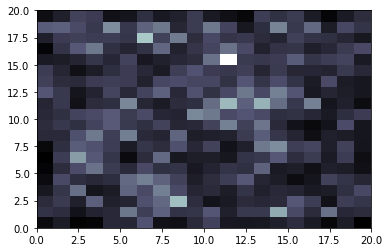

Still going... 0
Previous decay:  0.5
Updated decay:  0.4230769230769231
Previous decay:  1.0
Updated decay:  0.8461538461538461
Cycle -  0  - Complete!!


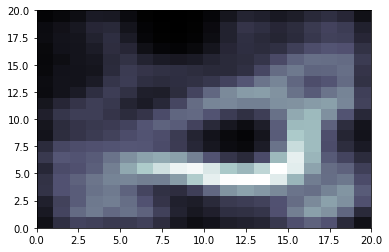

Still going... 0
Previous decay:  0.4230769230769231
Updated decay:  0.3102564102564102
Previous decay:  0.8461538461538461
Updated decay:  0.6205128205128204
Cycle -  1  - Complete!!


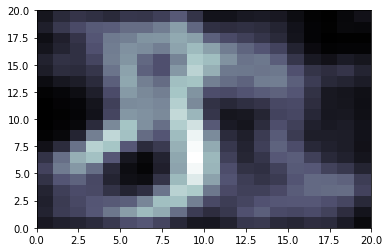

Still going... 0
Previous decay:  0.3102564102564102
Updated decay:  0.20075414781297132
Previous decay:  0.6205128205128204
Updated decay:  0.40150829562594265
Cycle -  2  - Complete!!


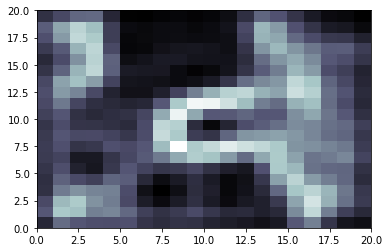

Still going... 0
Previous decay:  0.20075414781297132
Updated decay:  0.11622608557593077
Previous decay:  0.40150829562594265
Updated decay:  0.23245217115186154
Cycle -  3  - Complete!!


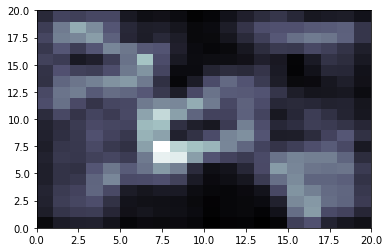

Still going... 0
Previous decay:  0.11622608557593077
Updated decay:  0.06088033053977326
Previous decay:  0.23245217115186154
Updated decay:  0.12176066107954651
Cycle -  4  - Complete!!


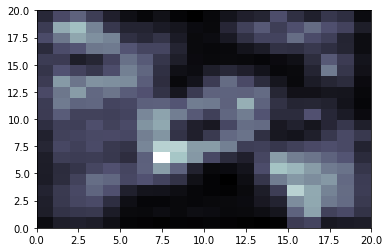

Still going... 0
Previous decay:  0.06088033053977326
Updated decay:  0.02911667982336982
Previous decay:  0.12176066107954651
Updated decay:  0.05823335964673964
Cycle -  5  - Complete!!


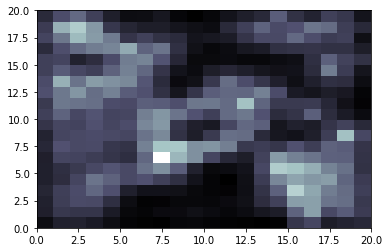

Still going... 0
Previous decay:  0.02911667982336982
Updated decay:  0.012811339122282722
Previous decay:  0.05823335964673964
Updated decay:  0.025622678244565444
Cycle -  6  - Complete!!


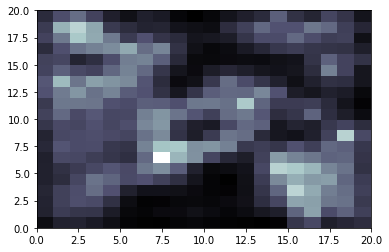

Still going... 0
Previous decay:  0.012811339122282722
Updated decay:  0.005219434457226294
Previous decay:  0.025622678244565444
Updated decay:  0.010438868914452589
Cycle -  7  - Complete!!


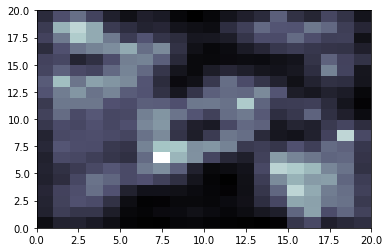

Still going... 0
Previous decay:  0.005219434457226294
Updated decay:  0.0019797854837754906
Previous decay:  0.010438868914452589
Updated decay:  0.003959570967550981
Cycle -  8  - Complete!!


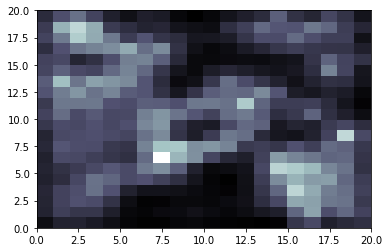

Still going... 0
Previous decay:  0.0019797854837754906
Updated decay:  0.0007025045265009805
Previous decay:  0.003959570967550981
Updated decay:  0.001405009053001961
Cycle -  9  - Complete!!
Sliding Window Training Complete!

...ready!


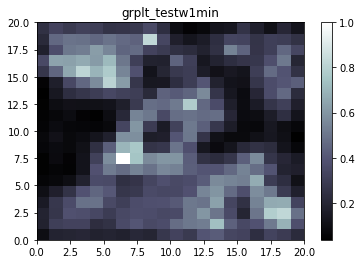

Mapping in progress... 1
Mapping in progress... 501
Mapping in progress... 1001
Mapping in progress... 1501
Mapping in progress... 2001
Mapping in progress... 2501
Mapping in progress... 3001
Mapping in progress... 3501
Mapping in progress... 4001
Mapping in progress... 4501
Mapping in progress... 5001
Mapping in progress... 5501
Mapping in progress... 6001
Mapping in progress... 6501
Mapping in progress... 7001
Mapping in progress... 7501
Mapping in progress... 8001
Mapping in progress... 8501
Mapping in progress... 9001
Mapping in progress... 9501
Mapping in progress... 10001
Mapping in progress... 10501
Mapping in progress... 11001
Mapping in progress... 11501
Mapping in progress... 12001
Mapping in progress... 12501
Mapping in progress... 13001
Mapping in progress... 13501
Mapping in progress... 14001
Mapping in progress... 14501
Mapping in progress... 15001
Mapping in progress... 15501
Mapping in progress... 16001
Mapping in progress... 16501
Mapping in progress... 17001
Mapping i

In [160]:
hfw, hfi = slide_win(re1min['hf_drsegn_re'], f_wts['mu_drsegn_re_init'][:20, :20, :30], 10, 1.0, 0.5,
                     "results", "weights", "testw1min", True)

Som of size:  (20, 20, 30)  has been initialized
Training begins...


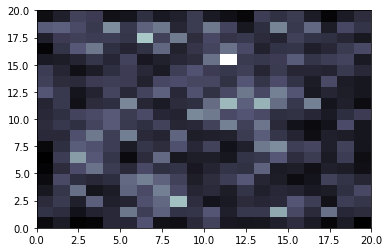

Still going... 0
Previous decay:  0.5
Updated decay:  0.4230769230769231
Previous decay:  1.0
Updated decay:  0.8461538461538461
Cycle -  0  - Complete!!


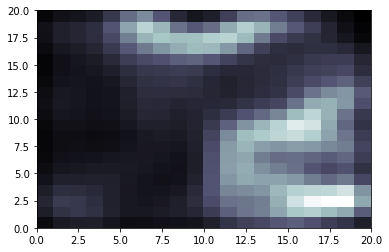

Still going... 0
Previous decay:  0.4230769230769231
Updated decay:  0.3102564102564102
Previous decay:  0.8461538461538461
Updated decay:  0.6205128205128204
Cycle -  1  - Complete!!


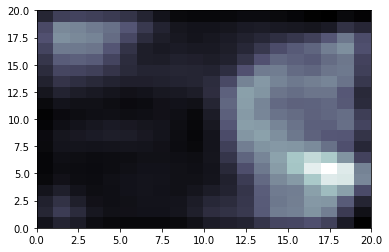

Still going... 0
Previous decay:  0.3102564102564102
Updated decay:  0.20075414781297132
Previous decay:  0.6205128205128204
Updated decay:  0.40150829562594265
Cycle -  2  - Complete!!


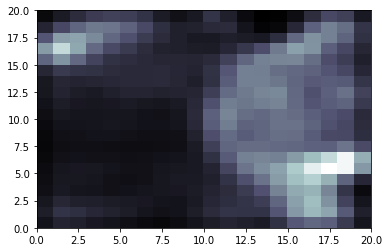

Still going... 0
Previous decay:  0.20075414781297132
Updated decay:  0.11622608557593077
Previous decay:  0.40150829562594265
Updated decay:  0.23245217115186154
Cycle -  3  - Complete!!


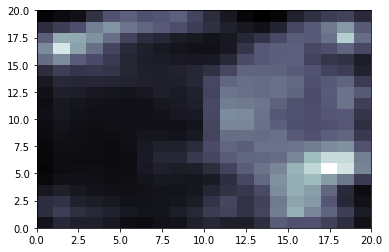

Still going... 0
Previous decay:  0.11622608557593077
Updated decay:  0.06088033053977326
Previous decay:  0.23245217115186154
Updated decay:  0.12176066107954651
Cycle -  4  - Complete!!


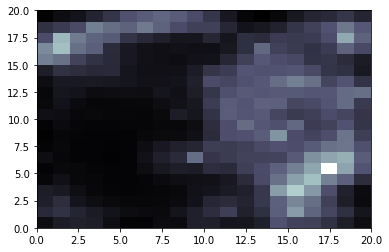

Still going... 0
Previous decay:  0.06088033053977326
Updated decay:  0.02911667982336982
Previous decay:  0.12176066107954651
Updated decay:  0.05823335964673964
Cycle -  5  - Complete!!


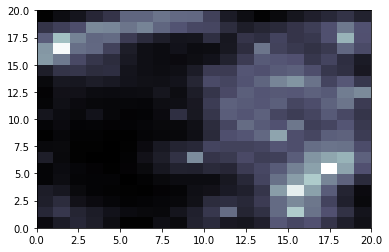

Still going... 0
Previous decay:  0.02911667982336982
Updated decay:  0.012811339122282722
Previous decay:  0.05823335964673964
Updated decay:  0.025622678244565444
Cycle -  6  - Complete!!


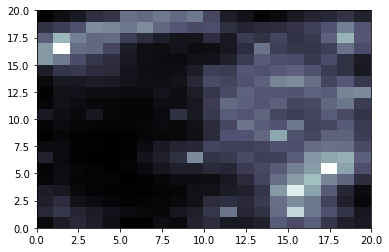

Still going... 0
Previous decay:  0.012811339122282722
Updated decay:  0.005219434457226294
Previous decay:  0.025622678244565444
Updated decay:  0.010438868914452589
Cycle -  7  - Complete!!


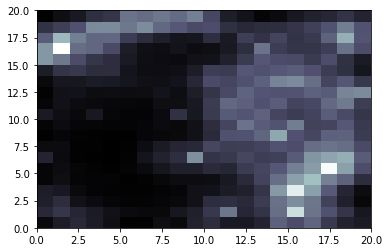

Still going... 0
Previous decay:  0.005219434457226294
Updated decay:  0.0019797854837754906
Previous decay:  0.010438868914452589
Updated decay:  0.003959570967550981
Cycle -  8  - Complete!!


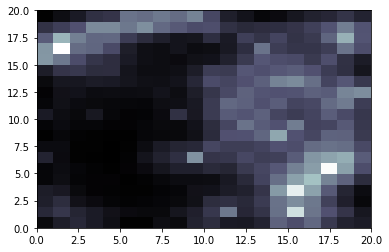

Still going... 0
Previous decay:  0.0019797854837754906
Updated decay:  0.0007025045265009805
Previous decay:  0.003959570967550981
Updated decay:  0.001405009053001961
Cycle -  9  - Complete!!
Random Window Training Complete!

...ready!


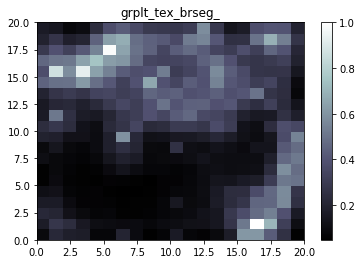

Mapping in progress... 1
Mapping in progress... 501
Mapping in progress... 1001
Mapping in progress... 1501
Mapping in progress... 2001
Mapping in progress... 2501
Mapping in progress... 3001
Mapping in progress... 3501
Mapping in progress... 4001
Mapping in progress... 4501
Mapping in progress... 5001
Mapping in progress... 5501
Mapping in progress... 6001
Mapping in progress... 6501
Mapping in progress... 7001
Mapping in progress... 7501
Mapping in progress... 8001
Mapping in progress... 8501
Mapping in progress... 9001
Mapping in progress... 9501
Mapping in progress... 10001
Mapping in progress... 10501
Mapping in progress... 11001
Mapping in progress... 11501
Mapping in progress... 12001
Mapping in progress... 12501
Mapping in progress... 13001
Mapping in progress... 13501
Mapping in progress... 14001
Mapping in progress... 14501
Mapping in progress... 15001
Mapping in progress... 15501
Mapping in progress... 16001
Mapping in progress... 16501
Mapping in progress... 17001
Mapping i

In [161]:
# hf on first minute
hf1min = all_rand(re1min['hf_drsegn_re'], target, f_wts['te_drsegn_re_init'][:20, :20, :30], 10, 1.0, 0.5, True)

In [171]:
examine(hfi)

1664
(18, 17)  --> 
[859, 593, 212, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
859
Max label.... 0
updated... [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




63
(17, 15)  --> 
[29, 26, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
29
Max label.... 0
updated... [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




50
(18, 16)  --> 
[25, 17, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
25
Max label.... 0
updated... [3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*

[56, 26, 19, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
56
Max label.... 0
updated... [57, 26, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




56
(3, 11)  --> 
[20, 19, 17, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
20
Max label.... 0
updated... [58, 26, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




42
(0, 12)  --> 
[6, 9, 27, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
27
Max label.... 2
updated... [58, 26, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*********************

(10, 6)  --> 
[12, 10, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
12
Max label.... 0
updated... [100, 48, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




21
(10, 5)  --> 
[8, 10, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
10
Max label.... 1
updated... [100, 49, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




26
(12, 3)  --> 
[11, 9, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
11
Max label.... 0
updated... [101, 49, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*******

[12, 12, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
12
Max label.... 0
updated... [116, 63, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




14
(13, 1)  --> 
[6, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
8
Max label.... 1
updated... [116, 64, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




12
(13, 0)  --> 
[6, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
6
Max label.... 0
updated... [117, 64, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*************************

[52, 83, 46, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
83
Max label.... 1
updated... [147, 89, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




21
(8, 1)  --> 
[7, 10, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
10
Max label.... 1
updated... [147, 90, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




29
(5, 3)  --> 
[6, 17, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
17
Max label.... 1
updated... [147, 91, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
**********************

37
Max label.... 0
updated... [158, 116, 9, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




80
(17, 18)  --> 
[44, 36, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
44
Max label.... 0
updated... [159, 116, 9, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




31
(15, 19)  --> 
[19, 12, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
19
Max label.... 0
updated... [160, 116, 9, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




6
(9, 12)  --> 
[6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

[31, 35, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
35
Max label.... 1
updated... [179, 144, 13, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




3
(4, 15)  --> 
[1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
2
Max label.... 1
updated... [179, 145, 13, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




37
(2, 6)  --> 
[0, 19, 18, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
19
Max label.... 1
updated... [179, 146, 13, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
******************

In [169]:
examine(hf1min)

1410
(19, 13)  --> 
[716, 505, 189, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
716
Max label.... 0
updated... [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




92
(19, 14)  --> 
[43, 39, 10, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
43
Max label.... 0
updated... [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




34
(19, 15)  --> 
[12, 16, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
16
Max label.... 1
updated... [2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


56
Max label.... 0
updated... [32, 8, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




113
(11, 4)  --> 
[29, 46, 38, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
46
Max label.... 1
updated... [32, 9, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




101
(10, 4)  --> 
[75, 25, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
75
Max label.... 0
updated... [33, 9, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




140
(9, 4)  --> 
[101, 39, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

updated... [76, 28, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




144
(5, 4)  --> 
[67, 49, 28, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
67
Max label.... 0
updated... [77, 28, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




92
(4, 4)  --> 
[43, 13, 36, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
43
Max label.... 0
updated... [78, 28, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




124
(2, 4)  --> 
[16, 56, 52, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

(17, 1)  --> 
[11, 25, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
25
Max label.... 1
updated... [122, 60, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




55
(19, 0)  --> 
[17, 9, 29, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
29
Max label.... 2
updated... [122, 60, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




35
(19, 3)  --> 
[6, 22, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
22
Max label.... 1
updated... [122, 61, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
******

[63, 56, 10, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
63
Max label.... 0
updated... [156, 91, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




67
(6, 4)  --> 
[35, 14, 18, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
35
Max label.... 0
updated... [157, 91, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




25
(12, 14)  --> 
[10, 13, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
13
Max label.... 1
updated... [157, 92, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************

[9, 13, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
13
Max label.... 1
updated... [174, 111, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




25
(9, 13)  --> 
[7, 15, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
15
Max label.... 1
updated... [174, 112, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




56
(9, 14)  --> 
[9, 38, 9, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
38
Max label.... 1
updated... [174, 113, 8, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*******************

Max label.... 0
updated... [204, 142, 10, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




24
(16, 3)  --> 
[9, 15, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
15
Max label.... 1
updated... [204, 143, 10, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




103
(9, 0)  --> 
[22, 81, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
81
Max label.... 1
updated... [204, 144, 10, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
*****************************************************




21
(15, 0)  --> 
[21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [162]:
# get the target
targhf1 = p1min['hf_drseg'].iloc[:, 7]
targmu1 = p1min['mu_drseg'].iloc[:, 7]
targte1 = p1min['te_drseg'].iloc[:, 7]

# convert to npy
hftar1 = convnp(targhf1)
mutar1 = convnp(targmu1)
tetar1 = convnp(targte1)

# remap the npy
hfre1 = remap(hftar1, 5)
mure1 = remap(mutar1, 5)
tere1 = remap(tetar1, 5)

hfre1.shape, mure1.shape, tere1.shape

Label shape after window:  (23995, 5)
Label shape after window:  (23995, 5)
Label shape after window:  (23995, 5)


((23995, 5), (23995, 5), (23995, 5))

legend: 
Lab:  0  Color:  #02b058
Lab:  1  Color:  #042333
Lab:  2  Color:  #0841fa
Lab:  3  Color:  #11fd99
Lab:  4  Color:  #28f934
Lab:  5  Color:  #3636ee
Lab:  6  Color:  #3c91a7
Lab:  7  Color:  #3e3986
Lab:  8  Color:  #3e8ae0
Lab:  9  Color:  #419b63
Lab:  10  Color:  #427b34
Lab:  11  Color:  #5c1c3a
Lab:  12  Color:  #649b7c
Lab:  13  Color:  #65eb69
Lab:  14  Color:  #74470b
Lab:  15  Color:  #77793c
Lab:  16  Color:  #7fbfd4
Lab:  17  Color:  #806be1
Lab:  18  Color:  #820022
Lab:  19  Color:  #a07475
Lab:  20  Color:  #a0f8fb
Lab:  21  Color:  #a3f96c
Lab:  22  Color:  #a4c00f
Lab:  23  Color:  #acf837
Lab:  24  Color:  #bd25f4
Lab:  25  Color:  #c27495
Lab:  26  Color:  #c55a2d
Lab:  27  Color:  #c5c8fc
Lab:  28  Color:  #c9dc9b
Lab:  29  Color:  #d18b2c
Lab:  30  Color:  #dcd6e7
Lab:  31  Color:  #e2fa2b
Lab:  32  Color:  #e8390a
Lab:  33  Color:  #edda36
Lab:  34  Color:  #ee5b21
Lab:  35  Color:  #f06752
Lab:  36  Color:  #f28cf0
Lab:  37  Color:  #f68e2f
Lab:  38  Col

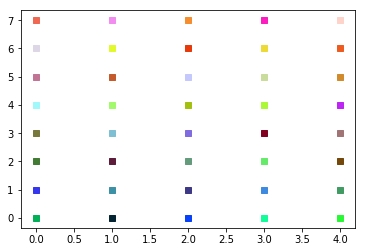

map saved!!


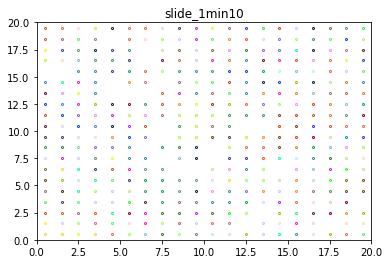

In [166]:
plot_thresh(hfre1[:, 2], hfi, (20, 20, 35), "slide_1min10", "results", True)

legend: 
Lab:  0  Color:  #02b058
Lab:  1  Color:  #042333
Lab:  2  Color:  #0841fa
Lab:  3  Color:  #11fd99
Lab:  4  Color:  #28f934
Lab:  5  Color:  #3636ee
Lab:  6  Color:  #3c91a7
Lab:  7  Color:  #3e3986
Lab:  8  Color:  #3e8ae0
Lab:  9  Color:  #419b63
Lab:  10  Color:  #427b34
Lab:  11  Color:  #5c1c3a
Lab:  12  Color:  #649b7c
Lab:  13  Color:  #65eb69
Lab:  14  Color:  #74470b
Lab:  15  Color:  #77793c
Lab:  16  Color:  #7fbfd4
Lab:  17  Color:  #806be1
Lab:  18  Color:  #820022
Lab:  19  Color:  #a07475
Lab:  20  Color:  #a0f8fb
Lab:  21  Color:  #a3f96c
Lab:  22  Color:  #a4c00f
Lab:  23  Color:  #acf837
Lab:  24  Color:  #bd25f4
Lab:  25  Color:  #c27495
Lab:  26  Color:  #c55a2d
Lab:  27  Color:  #c5c8fc
Lab:  28  Color:  #c9dc9b
Lab:  29  Color:  #d18b2c
Lab:  30  Color:  #dcd6e7
Lab:  31  Color:  #e2fa2b
Lab:  32  Color:  #e8390a
Lab:  33  Color:  #edda36
Lab:  34  Color:  #ee5b21
Lab:  35  Color:  #f06752
Lab:  36  Color:  #f28cf0
Lab:  37  Color:  #f68e2f
Lab:  38  Col

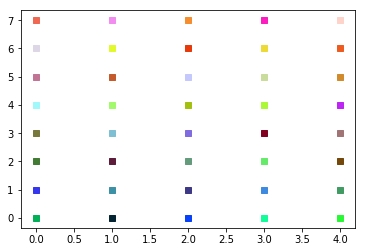

map saved!!


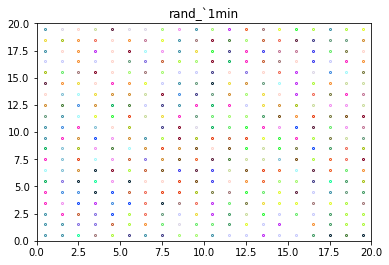

In [167]:
plot_thresh(hfre1[:, 2], hf1min, (20, 20, 35), "rand_`1min", "results", True)

map saved!!


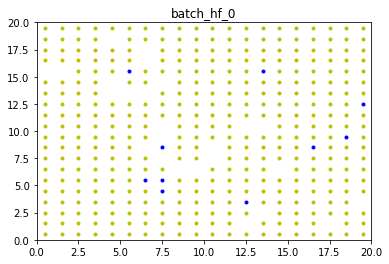

map saved!!


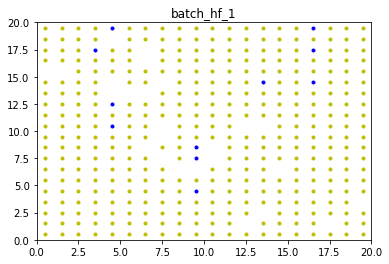

map saved!!


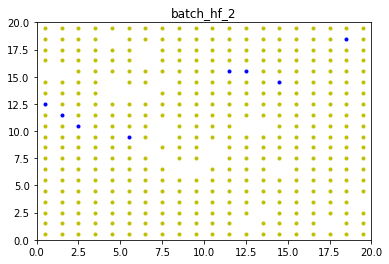

map saved!!


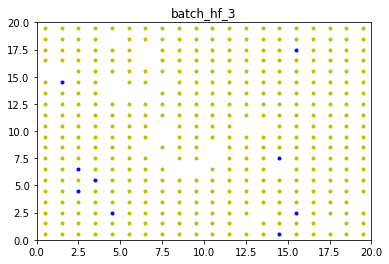

map saved!!


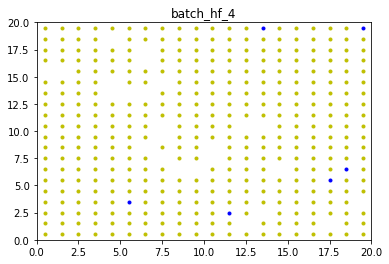

map saved!!


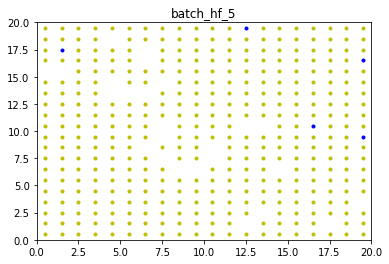

map saved!!


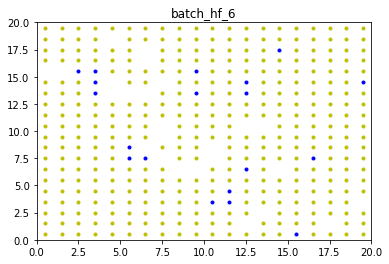

map saved!!


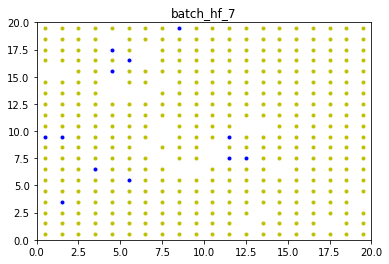

map saved!!


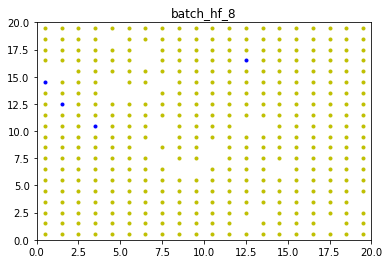

map saved!!


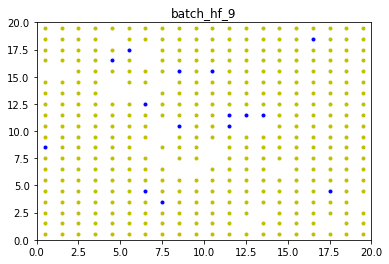

map saved!!


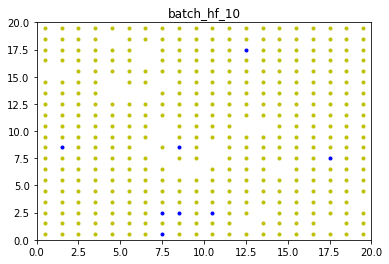

map saved!!


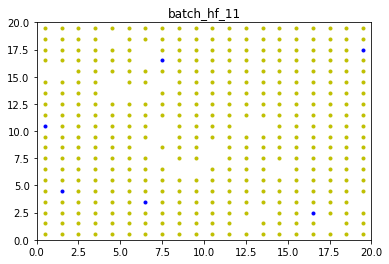

map saved!!


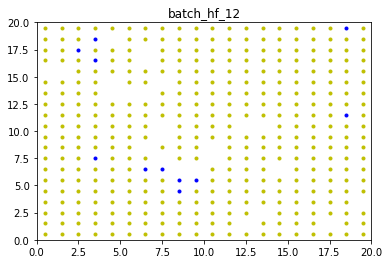

map saved!!


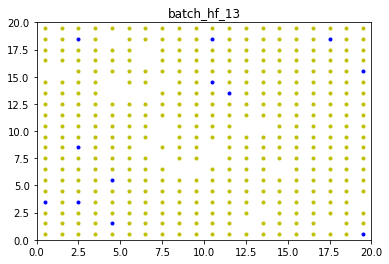

map saved!!


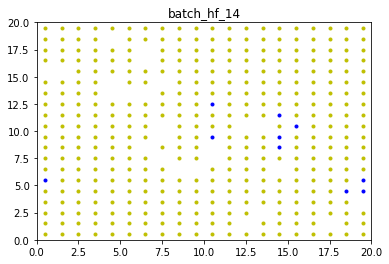

map saved!!


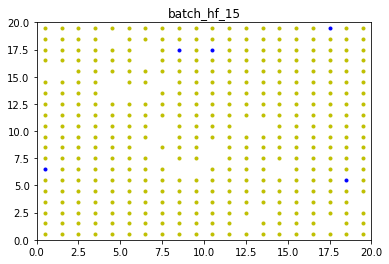

map saved!!


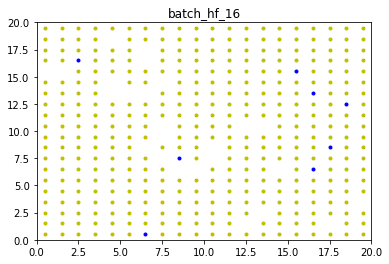

map saved!!


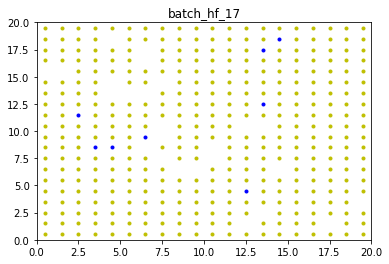

map saved!!


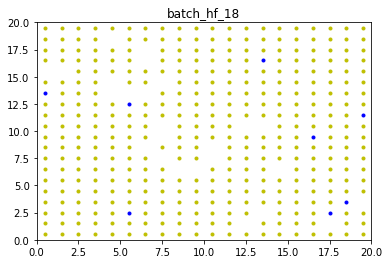

map saved!!


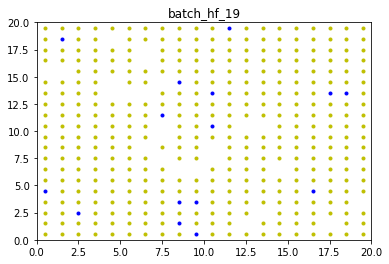

map saved!!


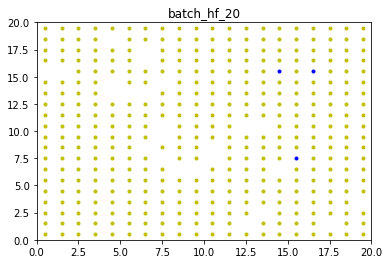

map saved!!


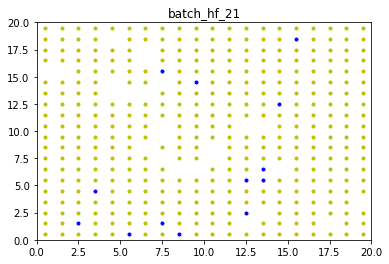

map saved!!


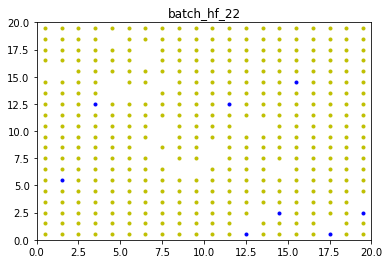

map saved!!


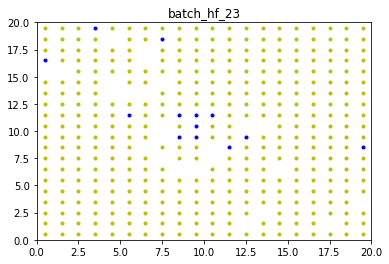

map saved!!


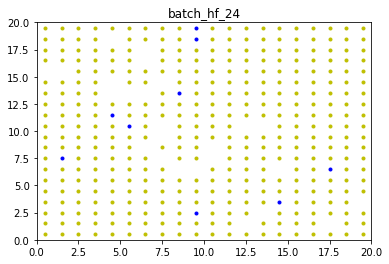

map saved!!


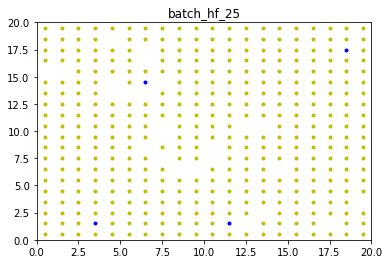

map saved!!


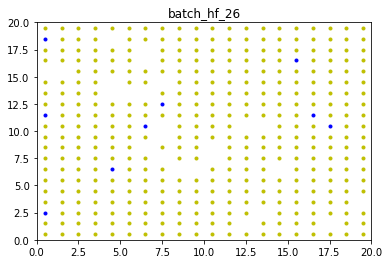

map saved!!


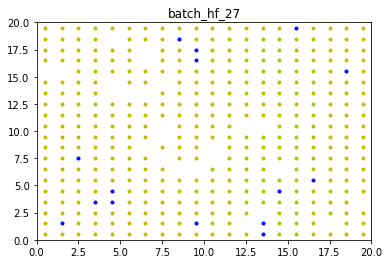

map saved!!


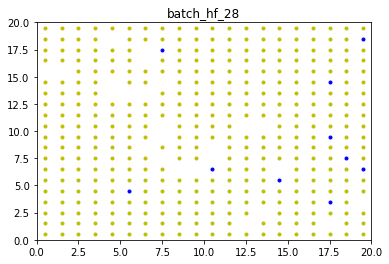

map saved!!


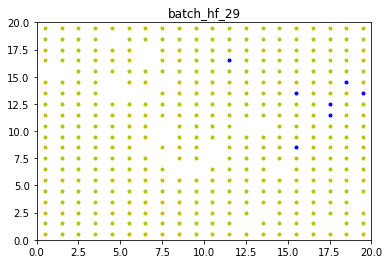

map saved!!


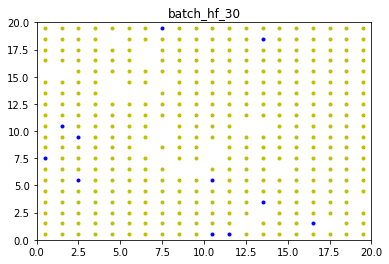

map saved!!


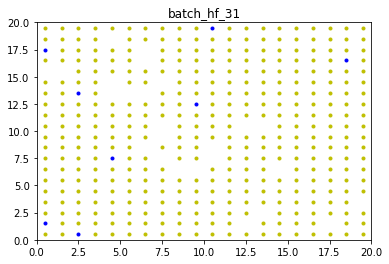

map saved!!


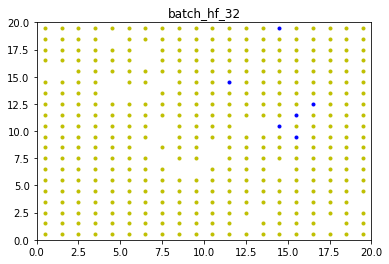

map saved!!


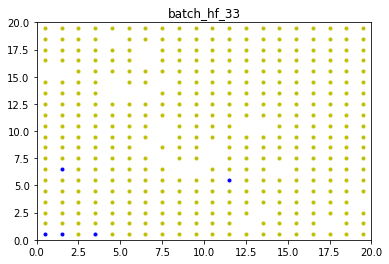

map saved!!


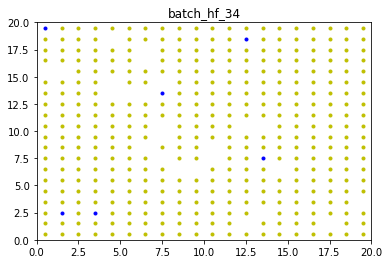

map saved!!


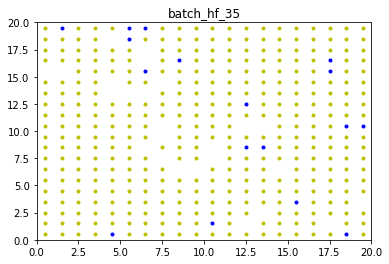

map saved!!


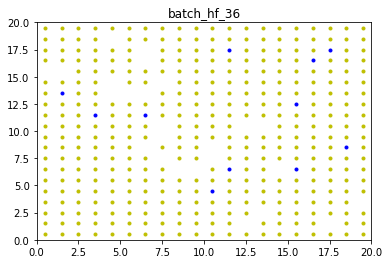

map saved!!


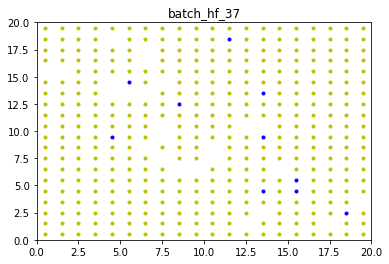

map saved!!


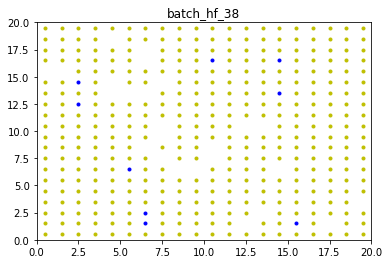

map saved!!


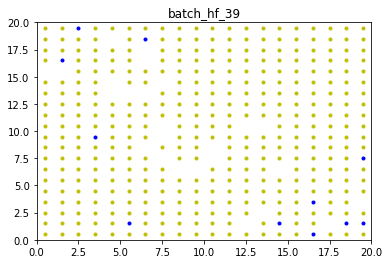

In [172]:
plot_thresh_onev(hfre1[:, 2], hfi, (20, 20, 35), "batch_hf", "results", True)

map saved!!


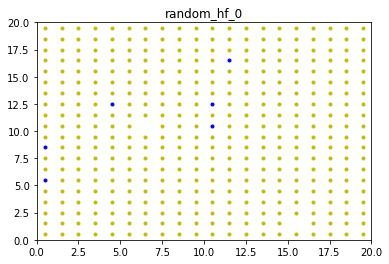

map saved!!


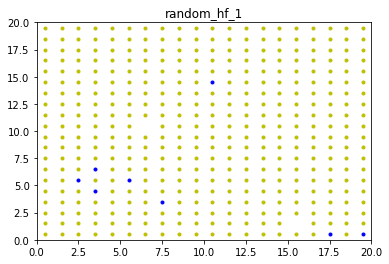

map saved!!


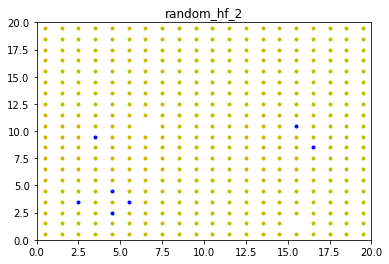

map saved!!


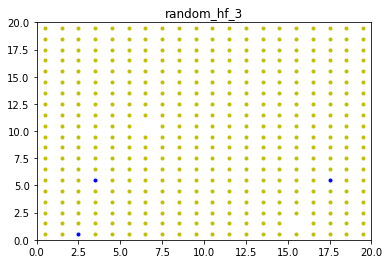

map saved!!


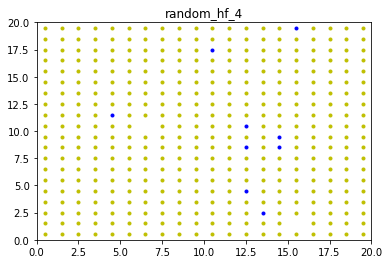

map saved!!


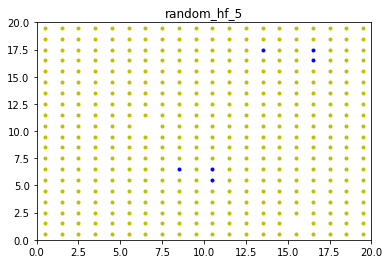

map saved!!


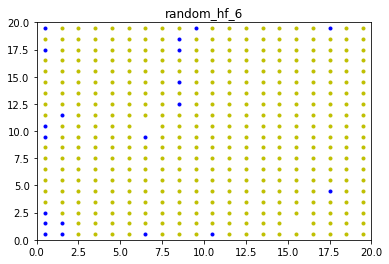

map saved!!


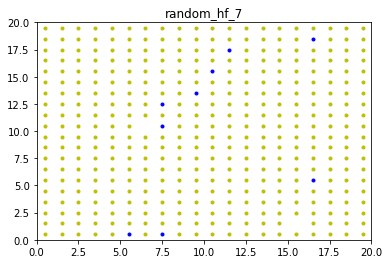

map saved!!


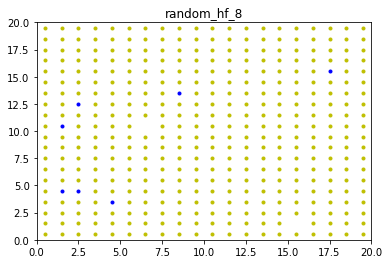

map saved!!


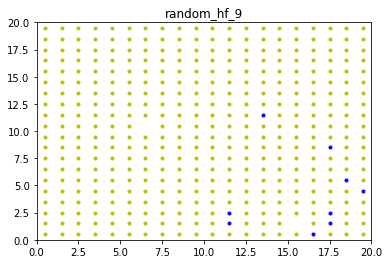

map saved!!


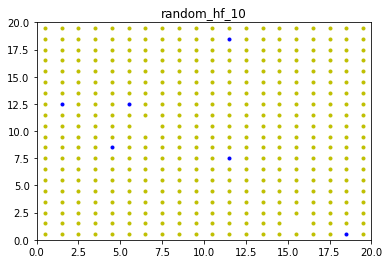

map saved!!


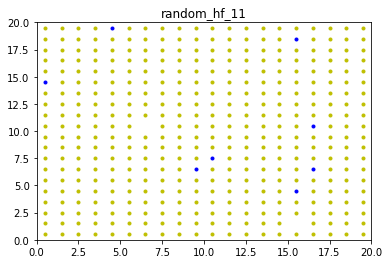

map saved!!


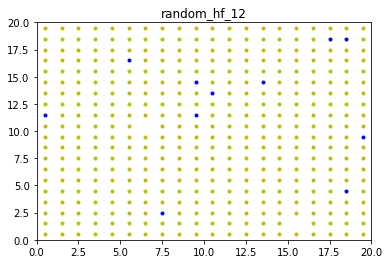

map saved!!


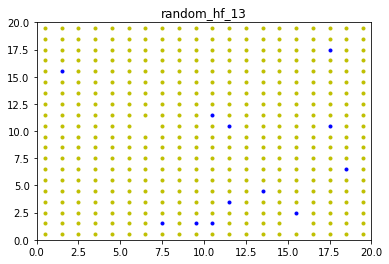

map saved!!


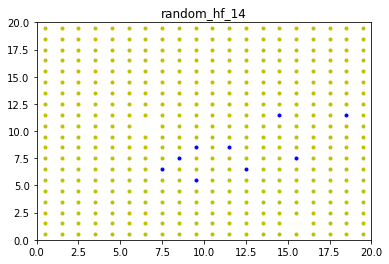

map saved!!


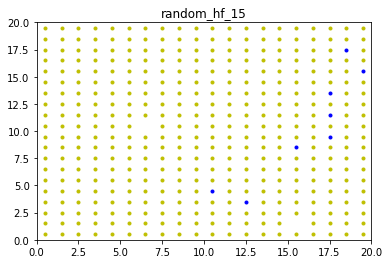

map saved!!


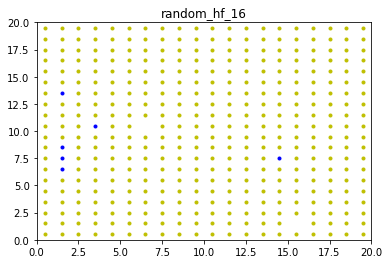

map saved!!


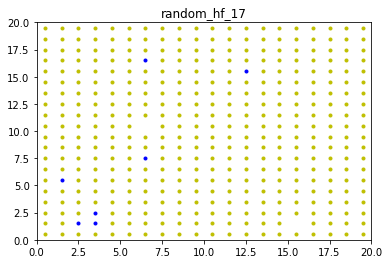

map saved!!


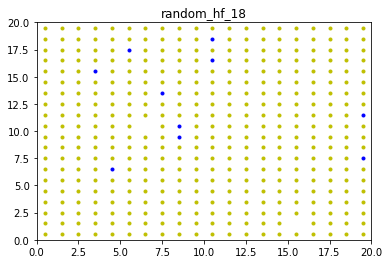

map saved!!


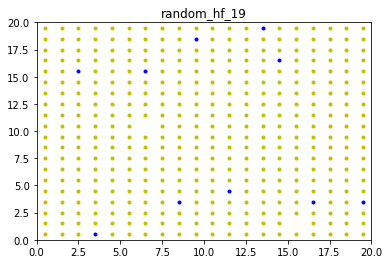

map saved!!


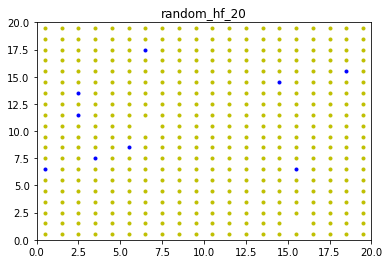

map saved!!


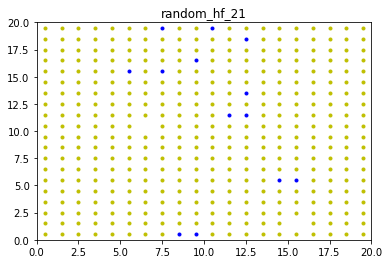

map saved!!


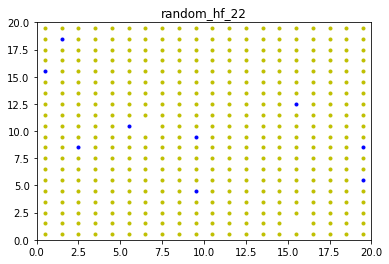

map saved!!


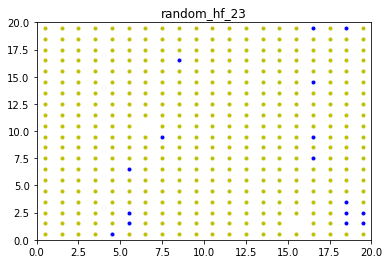

map saved!!


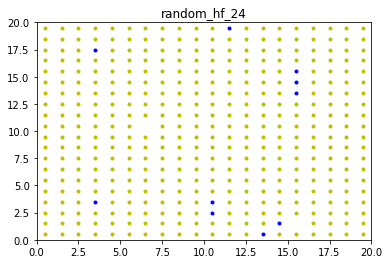

map saved!!


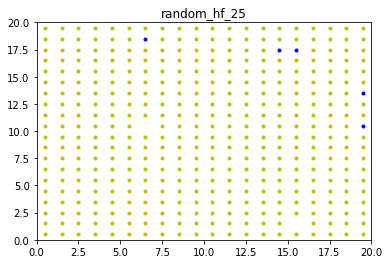

map saved!!


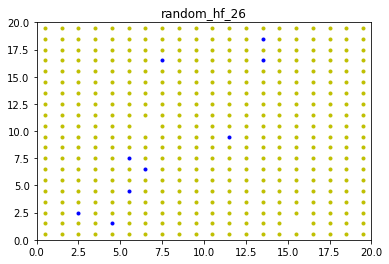

map saved!!


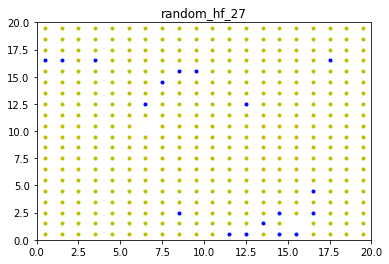

map saved!!


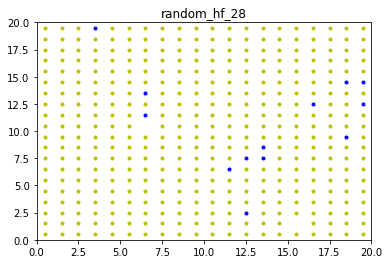

map saved!!


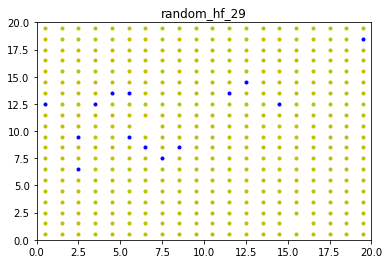

map saved!!


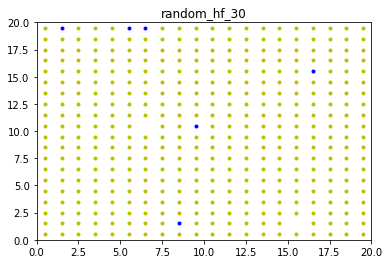

map saved!!


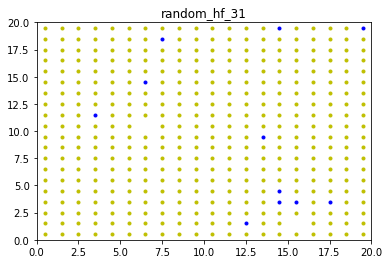

map saved!!


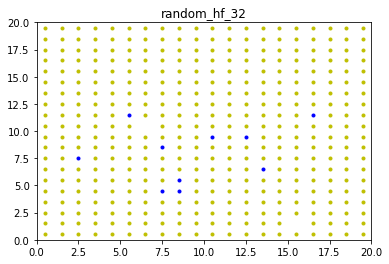

map saved!!


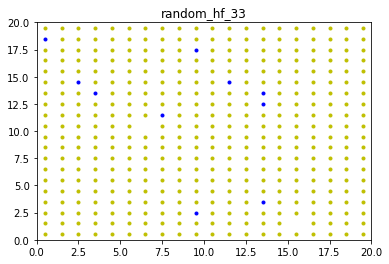

map saved!!


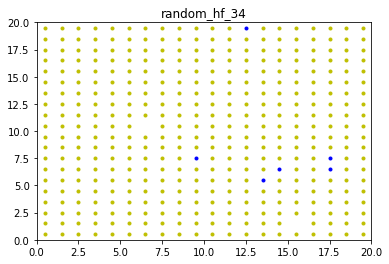

map saved!!


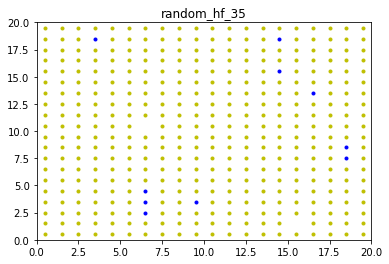

map saved!!


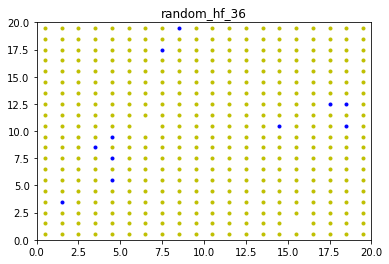

map saved!!


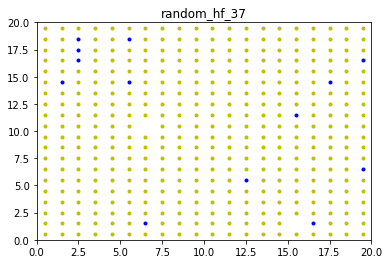

map saved!!


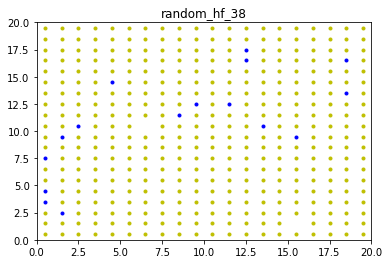

map saved!!


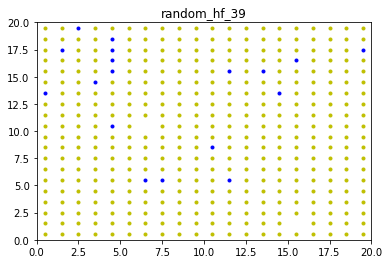

In [173]:
plot_thresh_onev(hfre1[:, 2], hf1min, (20, 20, 35), "random_hf", "results", True)

# Save the mappings section...

In [65]:
import csv

# store the index as a csv file
def store_idx(fname, cur_dict):
    
    os.chdir('mapping')
    name = fname + '.csv'
    with open(name, 'w') as f:
        
        for key in cur_dict.keys():
            cur_lis = cur_dict[key]
            cur_len = len(cur_lis)
            
            f.write("%d,%d,%d,"%(key[0], key[1], cur_len))
            
            for li in cur_lis:
                f.write("%d,"%(li))
            f.write("\n")
            
        print("File ", name, " saved!!")
        
    os.chdir('..')
    return

# load up the index from a csv file
def load_idx(fname):
    
    os.chdir('mapping')
    idx = defaultdict(list)
    
    with open(fname, 'rt') as f:
        cur_csv = csv.reader(f)
        
        for line in cur_csv:
            for val in range(3, int(line[2])+3):
                
                k1 = int(line[0])
                k2 = int(line[1])
                vv = int(line[val])
                
                idx[k1, k2].append(vv)
                
    os.chdir('..')
    print("File ", fname, " has been loaded")
    return idx

In [27]:
# save the mappings
indname = list(ind_di.keys())
for i in range(len(indname)):
    store_idx(indname[i], ind_list[i])

File  hf_drsegn_re_id.csv  saved!!
File  mu_drsegn_re_id.csv  saved!!
File  te_drsegn_re_id.csv  saved!!


In [66]:
# loading up segmented data
store_idx("hfseg_map", nhf)
store_idx("museg_map", nmu)
store_idx("teseg_map", nte)

File  hfseg_map.csv  saved!!
File  museg_map.csv  saved!!
File  teseg_map.csv  saved!!


In [69]:
store_idx("alseg_map", nal)

File  alseg_map.csv  saved!!


In [221]:
def dec(decay_val, t, max_iter):
    '''
    decay learning rate
    learning_rate: current learning rate
    t: current iteration
    max_iter: max number of iterations
    '''
    c = t + 1
    max_c = max_iter + 1
    
    divider = (1+c/(max_c/2))
    new_decay = decay_val / divider
    #print("Previous decay: ", decay_val)
    #print("Updated decay: ", new_decay)
    return new_decay

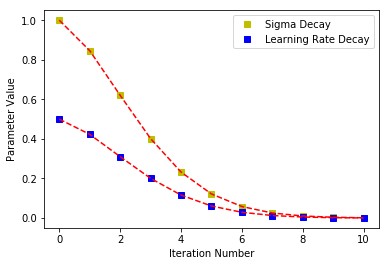

In [223]:
alr = 0.5
asig = 1.0
lrls, sigls = [alr], [asig]
maxcy = 10
#plt.axis([0, maxcy, 0, 1])

z = 0
for cy in range(maxcy):
    plt.plot(z, asig, 'ys')
    asig = dec(asig, cy, maxcy)
    sigls.append(asig)
    z = z + 1
plt.plot(z, asig, 'ys', label="Sigma Decay")
    
y = 0
for cy in range(maxcy):
    plt.plot(y, alr, 'bs')
    alr = dec(alr, cy, maxcy)
    lrls.append(alr)
    y = y + 1
plt.plot(y, alr, 'bs', label="Learning Rate Decay")


t = range(maxcy+1)
plt.plot(t, sigls, 'r--')
plt.plot(t, lrls, 'r--')
plt.xlabel("Iteration Number")
plt.ylabel("Parameter Value")
plt.legend()
plt.show()
#sigls, lrls